# Install libraries that are not preinstalled

In [1]:
!pip install pandas==2.0.0 numpy plotly scikit-learn scikit-posthocs pingouin kaleido nbformat session_info PyComplexHeatmap==1.6 yellowbrick matplotlib seaborn

Defaulting to user installation because normal site-packages is not writeable


# 1.Blank Filter

In [2]:
import pandas as pd

# Load the feature table and metadata
feature_table = pd.read_csv('featuretable_reformated.csv')
metadata = pd.read_csv('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Identify sample columns
sample_columns = [col for col in feature_table.columns if '.mz' in col]

# Process each dataset
datasets = metadata['ATTRIBUTE_dataset'].unique()
all_blank_cols = []  # List to keep track of all blank columns

for dataset in datasets:
    # Get sample and blank columns for the current dataset
    dataset_samples = metadata[(metadata['ATTRIBUTE_dataset'] == dataset) & (metadata['ATTRIBUTE_type'] == 'SAMPLE')]['filename']
    dataset_blanks = metadata[(metadata['ATTRIBUTE_dataset'] == dataset) & (metadata['ATTRIBUTE_type'] == 'BLANK')]['filename']
    
    # Remove ' Peak area' from sample and blank column names for matching
    dataset_samples = dataset_samples.str.replace(' Peak area', '')
    dataset_blanks = dataset_blanks.str.replace(' Peak area', '')
    
    sample_cols = [col for col in sample_columns if col.replace(' Peak area', '') in dataset_samples.values]
    blank_cols = [col for col in sample_columns if col.replace(' Peak area', '') in dataset_blanks.values]
    
    # Add current blank columns to the list of all blank columns
    all_blank_cols.extend(blank_cols)
    
    # Calculate average values for samples and blanks within the current dataset
    sample_avg = feature_table[sample_cols].mean(axis=1)
    blank_avg = feature_table[blank_cols].mean(axis=1)
    
    # Set feature abundances to zero based on the condition within the current dataset
    feature_table.loc[blank_avg >= 0.5 * sample_avg, sample_cols] = 0

# Remove all blank columns from the dataframe
feature_table.drop(columns=all_blank_cols, inplace=True)

# Remove rows where all values are zero in columns with 'Peak area' in their header
peak_area_columns = [col for col in feature_table.columns if 'Peak area' in col]
feature_table = feature_table[(feature_table[peak_area_columns] != 0).any(axis=1)]

# Save the resulting dataframe to a new .csv file
feature_table.to_csv('processed_featuretable_dezeroed.csv', index=False)

print("The dataframe has been processed and saved to 'processed_featuretable_dezeroed.csv'.")

The dataframe has been processed and saved to 'processed_featuretable_dezeroed.csv'.


# 2.PCoA code adapted from Hitchhikers Guide (PCoA from Fig.2a)

In [3]:
# importing necessary modules
import pandas as pd
import numpy as np

import glob
import os
import re
import itertools
import io
import session_info
import shutil
import warnings
import matplotlib.pyplot as plt
import platform
import math
import scipy.stats as stats

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.io as pio

In [4]:
import os

# Automatically select the current working directory
current_dir = os.getcwd()
os.chdir(current_dir)

print(f"Current working directory: {current_dir}")

Current working directory: /home/jarmo/Ocean_ASMS/AbsolutelyFinal/FBMN_1.7min/Clean_1blnkrem/Final4papersubmission


In [5]:

# Specify the filenames directly
feature_table_file = 'processed_featuretable_dezeroed.csv'
metadata_file = 'merged_metadata_AbsolutelyFinal_FBMN_20241110.txt'

# Read the files
ft = pd.read_csv(feature_table_file)
md = pd.read_csv(metadata_file, sep='\t', encoding='ISO-8859-1')

# Automatically set annotation choice to 'n' and select the file
annotation_choice = 'n'
gnps_file = 'Updated_merged_results_with_gnps.tsv'

if annotation_choice.lower() == 'y':
    input_str = input('Enter the index number of the GNPS library annotation file and the analog annotation files separated by commas: ')
    input_list = input_str.strip().split(',')
    an_gnps = pd.read_csv(file_names[int(input_list[0])], sep='\t')
    an_analog = pd.read_csv(file_names[int(input_list[1])], sep='\t')
elif annotation_choice.lower() == 'n':
    an_gnps = pd.read_csv(gnps_file, sep='\t')
    an_analog = an_gnps.copy()  # If only GNPS is provided, analog will be the same
else:
    print('Invalid input. Please rerun the cell and enter y or n.')

In [6]:
# Rename the columns of 'an_analog' with a prefix 'Analog' (excluding the '#Scan#' column)
an_analog.columns = ['Analog_' + col if col != '#Scan#' else col for col in an_analog.columns]

# Merge 'an_analog' with 'an_gnps' using a full join on the '#Scan#' column
an_final = pd.merge(an_gnps, an_analog, on='#Scan#', how='outer')

# Consolidate multiple annotations for a single '#Scan#' into one combined name
def combine_names(row):
    if row['Compound_Name'] == row['Analog_Compound_Name']:
        return row['Compound_Name']
    return ';'.join([str(row['Compound_Name']), str(row['Analog_Compound_Name'])])

an_final_single = an_final.groupby('#Scan#').apply(lambda group: pd.Series({
    'Combined_Name': combine_names(group.iloc[0])
})).reset_index()

# To get the DataFrame with that exact column name (without automatic renaming)
an_final_single.columns = an_final_single.columns.str.replace('.', '_')

In [7]:
ft_an = ft.merge(an_final_single, left_on= "row ID",  how='left', right_on= "#Scan#", sort=True)
print('Dimension: ', ft_an.shape)
ft_an.head()

Dimension:  (15571, 2338)


,row ID,row m/z,row retention time,intensity_measure,ion_mobility,ion_mobility_unit,ccs,correlation group ID,annotation network number,best ion,...,Tray_4_P_160.mzML Peak area,XA_DOM_34.mzXML Peak area,2019_2_08_Holl_DOM_1.mzXML Peak area,2019_2_19_Holl_DOM_1.mzXML Peak area,2019_3_02_Holl_DOM_1.mzXML Peak area,2019_2_07_Holl_DOM_2.mzXML Peak area,2019_5_17_SIO_DOM_1.mzXML Peak area,Unnamed: 2452,#Scan#,Combined_Name
0,2,281.050758,0.131312,area,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.000,0.0,0.0,0.0,NaN,2.0,"Spectral Match to Cyclotetrasiloxane, octameth..."
1,6,299.061417,0.197006,area,NaN,NaN,NaN,NaN,NaN,NaN,...,376465.3,0.0,0.0,0.000,0.0,0.0,0.0,NaN,NaN,NaN
2,12,391.284659,0.272925,area,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,5511098.000,5740718.0,0.0,0.0,NaN,12.0,Spectral Match to Bis(2-ethylhexyl) phthalate ...
3,16,297.082529,0.292609,area,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.000,0.0,0.0,0.0,NaN,16.0,Octamethylcyclotetrasiloxane
4,19,161.082038,0.309535,area,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,86291.664,0.0,0.0,0.0,NaN,19.0,M50367


In [8]:
new_md = md.copy() #storing the files under different names to preserve the original files
new_ft = ft.copy()

In [9]:
new_ft.columns = new_ft.columns.str.replace(' Peak area', '') # Removing " Peak area" extensions from the column names of new_ft
new_ft = new_ft.sort_values(by='row ID') # Arranging the rows of new_ft by ascending order of "row ID"

new_ft = new_ft.loc[:, new_ft.notna().sum() > 0] # Removing columns in new_ft where all values are NaN
new_md = new_md.loc[:, new_md.notna().sum() > 0] # Removing columns in new_md where all values are NaN

new_md = new_md[new_md.apply(lambda row: all(item != "" for item in row), axis=1)] # Remove rows where all the elements are empty strings
new_md = new_md.applymap(lambda x: x.strip() if isinstance(x, str) else x) # Remove leading and trailing spaces from each column of new_md

In [10]:
# Selecting only the columns with names containing 'mzXML' or 'mzML'
new_ft = new_ft.loc[:, new_ft.columns.str.contains('\\.mzXML$|\\.mzML$')]

# If either .mzXML or .mzML files are present, print a message
if new_ft.columns.str.contains('\\.mzXML$').any() and new_ft.columns.str.contains('\\.mzML$').any():
    print("Both .mzXML and .mzML file types are present in the data")

Both .mzXML and .mzML file types are present in the data


In [11]:
#new_ft = new_ft.reindex(columns=sorted(new_ft.columns)) # Ordering the columns of 'new_ft' by their names
#new_md = new_md.sort_values(by='filename').reset_index(drop=True) #ordering the md by the 1st column filename

In [12]:
new_md = new_md[new_md['ATTRIBUTE_type'] != "BLANK"].reset_index(drop=True)
# how many files in the metadata are also present in the feature table
new_md['filename'].isin(new_ft.columns).value_counts()  #if this returns False it means some files are missing

filename
True    2321
Name: count, dtype: int64

In [13]:
# check if new_ft column names and md row names are the same
if sorted(new_ft.columns) == sorted(new_md['filename']):
    print(f"All {len(new_ft.columns)} files are present in both new_md & new_ft.")
else:
    print("Not all files are present in both new_md & new_ft.\n")
    # print the md rows / ft column which are not in ft columns / md rows and remove them
    ft_cols_not_in_md = [col for col in new_ft.columns if col not in new_md['filename']]
    print(f"These {len(ft_cols_not_in_md)} columns of feature table are not present in metadata table and will be removed:\n{', '.join(ft_cols_not_in_md)}\n")
    new_ft.drop(columns=ft_cols_not_in_md, inplace=True)
    md_rows_not_in_ft = [row for row in new_md['filename'] if row not in new_ft.columns]
    print(f"These {len(md_rows_not_in_ft)} rows of metadata table are not present in feature table and will be removed:\n{', '.join(md_rows_not_in_ft)}\n")
    new_md.drop(md_rows_not_in_ft, inplace=True)

All 2321 files are present in both new_md & new_ft.


In [14]:
#checking the dimensions of our new ft and md:
print("The number of rows and columns in our original ft is:", ft.shape,"\n")
print("The number of rows and columns in our new ft is:", new_ft.shape,"\n")
print("The number of rows and columns in our new md is:", new_md.shape)

The number of rows and columns in our original ft is: (15571, 2336) 

The number of rows and columns in our new ft is: (15571, 2321) 

The number of rows and columns in our new md is: (2321, 21)


In [15]:
ft_t = pd.DataFrame(new_ft).T #transposing the ft
ft_t = ft_t.apply(pd.to_numeric) #converting all values to numeric
np.array_equal(new_md['filename'],ft_t.index) #should return True now

False

In [16]:
#merging metadata (new_md) and transposed feature table based on the sample names
ft_merged_with_md = pd.merge(new_md, ft_t.reset_index(), left_on='filename', right_on='index', how='left')
ft_merged_with_md.head(n=2)

,filename,Owner,Submitter,Sample Collector,MassIVE ID,ATTRIBUTE_batch,ATTRIBUTE_region,ATTRIBUTE_type,ATTRIBUTE_descriptorNEW,ATTRIBUTE_descriptor2,...,6343,3214,15390,4335,317,13294,7059,123,5922,15355
0,Aruba_16.mzML,carmabilog@gmail.com,ikoester@ucsd.edu,zquinlan@ucsd.edu,MSV000085891,ARUBA,Caribbean,SAMPLE,Aruba 2019,Aruba 2019,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Aruba_20.mzML,carmabilog@gmail.com,ikoester@ucsd.edu,zquinlan@ucsd.edu,MSV000085891,ARUBA,Caribbean,SAMPLE,Aruba 2019,Aruba 2019,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [17]:
#frequencyplotraw
bins, bins_label, a = [-1, 0, 1, 10], ["-1","0", "1", "10"], 2

while a<=10:
    bins_label.append(np.format_float_scientific(10**a))
    bins.append(10**a)
    a+=1

freq_table = pd.DataFrame(bins_label)
frequency = pd.DataFrame(np.array(np.unique(np.digitize(ft_t.T.to_numpy(), bins, right=True), return_counts=True)).T).set_index(0)
freq_table = pd.concat([freq_table,frequency], axis=1).fillna(0).drop(0)
freq_table.columns = ["intensity", "Frequency"]
freq_table["Log(Frequency)"] = np.log(freq_table["Frequency"]+1)

# get the lowest intensity (that is not zero) as a cutoff LOD value
cutoff_LOD = round(ft_t.replace(0, np.nan).min(numeric_only=True).min())

fig = px.bar(freq_table, x="intensity", y="Log(Frequency)", template="plotly_white",  width=600, height=400)

fig.update_traces(marker_color="#696880")
fig.update_layout(font={"color":"grey", "size":12, "family":"Sans"},
                  title={"text":"Frequency plot - Gap Filled", "x":0.5, "font_color":"#3E3D53"},
                  xaxis_title= "Range")

fig.write_image(os.path.join(current_dir, "frequency_plot.svg"))

fig.show()

fig.write_html("frequencyplotraw.html")

In [18]:
# Set the seed for random number generation
np.random.seed(141222)

imp = ft_t.copy()
imp = imp.applymap(lambda x: np.random.randint(1, ((cutoff_LOD)/5)) if x == 0 else x)

In [19]:
(imp == 0).sum().sum() # checking if there are any zeros in our imputed table

0

In [20]:
normalized = imp.copy()

# Dividing each element of a particular row (as each row is the sample) with its row sum
norm_TIC = normalized.apply(lambda x: x/np.sum(x), axis=1)

print('No NA values in Normalized data:',norm_TIC.isnull().values.any() == False)
print('Dimension: ', norm_TIC.shape)
norm_TIC.head(n=3)

No NA values in Normalized data: True
Dimension:  (2321, 15571)


,3213,3887,7562,3819,120,569,6758,3501,1556,231,...,6343,3214,15390,4335,317,13294,7059,123,5922,15355
CCE_P1706_141_MSMS.mzXML,0.000034,0.000007,0.000033,0.000031,0.000033,0.000039,0.000038,0.000007,0.000038,0.000024,...,3.837584e-05,0.000008,0.000013,0.000001,7.421597e-07,3.432489e-05,0.000031,0.000014,0.000018,0.000027
CCE_P1706_175_MSMS.mzXML,0.000012,0.000013,0.000009,0.000027,0.000025,0.000021,0.000012,0.000001,0.000011,0.000016,...,3.055485e-05,0.000023,0.000027,0.000017,1.632348e-05,6.450008e-07,0.000005,0.000011,0.000013,0.000005
CCE_P1706_199_MSMS.mzXML,0.000016,0.000017,0.000011,0.000025,0.000018,0.000029,0.000014,0.000011,0.000007,0.000008,...,3.168333e-07,0.000024,0.000021,0.000021,1.358656e-05,3.084465e-06,0.000013,0.000030,0.000003,0.000003


In [21]:
print('Dimension: ', new_md.shape)

Dimension:  (2321, 21)


In [22]:

cleaned_data = norm_TIC

metadata = new_md

#norm_TIC.to_csv(os.path.join(current_dir, "norm_TIC.csv"))
#new_md.to_csv(os.path.join(current_dir, "new_md.csv"))

In [23]:
custom_palette = [
    "orange", "green", "red", "blue", "black", "slategray", "purple", "cyan",
    "maroon", "yellow", "magenta", "teal", "pink", "lavender", "olive",
    "turquoise", "brown", "navy", "goldenrod", "indigo", "darkorange"
]

In [24]:
metadata.set_index('filename', inplace=True)

In [25]:
metadata = metadata.reindex(cleaned_data.index)

In [26]:
import skbio.stats.distance
import numpy as np
import pandas as pd
import plotly.express as px
from scipy.spatial import distance

custom_palette = [
    "orange", "green", "red", "blue", "black", "slategray", "purple", "cyan",
    "maroon", "yellow", "magenta", "teal", "pink", "lavender", "olive",
    "turquoise", "brown", "navy", "goldenrod", "indigo", "darkorange"
]

metrices = ['euclidean','cityblock','canberra','braycurtis','jaccard','minkowski']

# Define your color mapping
color_mapping = {
    "Open Ocean": "purple",
    "Coastal": "orange",
    "Coral Reef": "teal"
}

def plotPCoA(data, meta, distmetric, attribute,
             col_attribute, mdtype='categorical', cols=color_mapping,
             title='Principal coordinates plot', plot=True, print_perm=True):
    if not distmetric in metrices:
      print('Wrong metric. Please choose one out of the following list: ', metrices)

    # Create the distance matrix from the original data
    distance_matrix = skbio.stats.distance.DistanceMatrix(distance.squareform(distance.pdist(data, distmetric)),
                                                         ids=data.index)

    np.random.seed(0)
    # perform PERMDISP test
    permdisp = skbio.stats.distance.permdisp(distance_matrix, meta[attribute])
    if print_perm:
      display('PERMDISP', permdisp)

    # perform PERMANOVA test
    permanova = skbio.stats.distance.permanova(distance_matrix, meta[attribute])

    # SumOfSquares_ratio is the ratio of sum of squares between groups (SSB) and the sum of squares within groups (SSW)
    SumOfSquares_ratio = (permanova['test statistic'] * (permanova['number of groups'] - 1)) / (permanova['sample size'] - permanova['number of groups'])
    permanova['R2'] = SumOfSquares_ratio / (SumOfSquares_ratio + 1)
    if print_perm:
      display('PERMANOVA', permanova)

    # perfom PCoA
    pcoa = skbio.stats.ordination.pcoa(distance_matrix)
    df = pcoa.samples[['PC1', 'PC2']]
    df = df.set_index(meta.index)
    df = pd.merge(df[['PC1', 'PC2']], meta[attribute].apply(str), left_index=True, right_index=True)

    title_text = (
    f'{title}<br>'  # First line with existing title
    f'PERMISP p-value: {permdisp["p-value"]}<br>'  # Second line with PERMISP p-value
    f'PERMANOVA p-value: {permanova["p-value"]}  R2: {permanova["R2"]:.4f}<br>'  # Third line with PERMANOVA p-value and R2
    )

    if mdtype == 'categorical':
      fig = px.scatter(df, x='PC1', y='PC2', template='plotly_white', width=600, height=400, color=col_attribute, color_discrete_map=cols)
    elif mdtype == 'continuous':
      fig = px.scatter(df, x='PC1', y='PC2', template='plotly_white', width=600, height=400, color=col_attribute, color_continuous_scale=cols)
    else:
      print('Wrong mdtype parameter. Please choose from categorical or continuous')
    fig.update_layout(font={"color":"grey", "size":12, "family":"Sans"},
                      title={"text": title_text, 'x':0.18, "font_color":"#3E3D53"},
                      xaxis_title=f'PC1 {round(pcoa.proportion_explained[0]*100, 1)}%',
                      yaxis_title=f'PC2 {round(pcoa.proportion_explained[1]*100, 1)}%')
    if plot:
      display(fig)
    return(fig)

fig = plotPCoA(cleaned_data,
         metadata,
         distmetric = 'braycurtis', #canberra distance is used
         attribute = 'ATTRIBUTE_ecosystem', # now a different group is used
         col_attribute = 'ATTRIBUTE_ecosystem',
         mdtype = 'categorical',
         title = 'Principal coordinates plot')

fig.write_html("TICNORM_blnkrem_braycurtis_ecosystem.html")


'PERMDISP'

method name               PERMDISP
test statistic name        F-value
sample size                   2321
number of groups                 3
test statistic            39.06675
p-value                      0.001
number of permutations         999
Name: PERMDISP results, dtype: object

'PERMANOVA'

method name                PERMANOVA
test statistic name         pseudo-F
sample size                     2321
number of groups                   3
test statistic            213.657985
p-value                        0.001
number of permutations           999
R2                          0.155653
Name: PERMANOVA results, dtype: object

In [27]:
import plotly.io as pio
# Save the figure as an SVG file
pio.write_image(fig, "TICNORM_blnkrem_braycurtis_ecosystem.svg")

# 2.Feature Table Conversion and Merging with GNPS and Taglist

In [28]:
import pandas as pd

# Read the CSV file
df = pd.read_csv('processed_featuretable_dezeroed.csv')

# Keep only 'row ID' and columns that contain 'Peak area' in their header
columns_to_keep = ['row ID'] + [col for col in df.columns if 'Peak area' in col]
df_filtered = df[columns_to_keep]

# Remove ' Peak area' from the column headers
df_filtered.columns = df_filtered.columns.str.replace(' Peak area', '')

# Save the modified DataFrame back to the same CSV file
df_filtered.to_csv('Transposed_Cleaned05_go.csv', index=False)

print("The file has been processed and saved successfully.")

The file has been processed and saved successfully.


In [29]:
import pandas as pd

# Read clustersummary_with_groups.tsv into df1 and merged_results_with_gnps.tsv into df2
df1 = pd.read_csv("Transposed_Cleaned05_go.csv")
df2 = pd.read_csv("Updated_merged_results_with_gnps.tsv", encoding='ISO-8859-1', sep="\t")

# Ensure that the columns being merged have the same data type
df1['row ID'] = df1['row ID'].astype(str)
df2['#Scan#'] = df2['#Scan#'].astype(str)

# Merge dataframes based on the columns "row ID" in df1 and "#Scan#" in df2
merged_df = pd.merge(df1, df2, left_on="row ID", right_on="#Scan#", how="inner")

# Save the output as gnpsmergedtable05.csv
merged_df.to_csv("gnpsmergedtable05.csv", index=False)

print("Filtered dataframe saved as gnpsmergedtable05.csv")

Filtered dataframe saved as gnpsmergedtable05.csv


In [30]:
import pandas as pd

# Read clustersummary_with_groups.tsv into df1 and merged_results_with_gnps.tsv into df2
df1 = pd.read_csv("gnpsmergedtable05.csv")
df2 = pd.read_csv("taglist.csv", encoding='ISO-8859-1')

# Merge dataframes based on the columns "row ID" in df1 and "#Scan#" in df2
merged_df = pd.merge(df1, df2, left_on="Compound_Name", right_on="Compound_Name_GNPS", how="left")

# Save the output as gnpsmergedtable05.csv
merged_df.to_csv("gnpsmergedtable05_tagged.csv", index=False)

print("Filtered dataframe saved as gnpsmergedtable05.csv")

/tmp/ipykernel_20140/1241898061.py:4: DtypeWarning:

Columns (2357) have mixed types. Specify dtype option on import or set low_memory=False.



Filtered dataframe saved as gnpsmergedtable05.csv


In [31]:
import pandas as pd

# Load the CSV file
df = pd.read_csv('gnpsmergedtable05_tagged.csv')

# Filter columns with '.mz' in the header and the specified columns
columns_to_keep = [col for col in df.columns if '.mz' in col] + ['row ID', 'Assigned name', 'Compound_Name_GNPS', 'SpecMZ_y', 'Use', 'Type', 'Ref', 'Class']
filtered_df = df[columns_to_keep]

# Rename columns
filtered_df = filtered_df.rename(columns={'Assigned name': 'name', 'SpecMZ_y': 'SpecMZ'})

# Keep only rows that have an entry in 'Compound_Name_GNPS'
filtered_df = filtered_df[filtered_df['Compound_Name_GNPS'].notna()]

# Remove rows with the entry 'NP' in column 'Type'
filtered_df = filtered_df[filtered_df['Type'] != 'NP']

# Save the output with the suffix '_filtered'
filtered_df.to_csv('gnpsmergedtable05_tagged_filtered.csv', index=False)

print("Filtered data has been saved to 'gnpsmergedtable05_tagged_filtered.csv'.")

/tmp/ipykernel_20140/4017564835.py:4: DtypeWarning:

Columns (2357,2385) have mixed types. Specify dtype option on import or set low_memory=False.



Filtered data has been saved to 'gnpsmergedtable05_tagged_filtered.csv'.


In [32]:
import pandas as pd

# Load the filtered CSV file
df = pd.read_csv('gnpsmergedtable05_tagged_filtered.csv')

# Identify columns with '.mz' in their headers
mz_columns = [col for col in df.columns if '.mz' in col]

# Group by 'name' and aggregate the required columns
grouped_df = df.groupby('name').agg({
    'row ID': lambda x: '_'.join(x.astype(str)),
    'SpecMZ': 'mean',
    'Compound_Name_GNPS': lambda x: '_'.join(x.astype(str)),
    'Use': lambda x: '_'.join(x.astype(str)) if len(set(x)) > 1 else x.iloc[0],
    'Type': lambda x: '_'.join(x.astype(str)) if len(set(x)) > 1 else x.iloc[0],
    'Class': lambda x: '_'.join(x.astype(str)) if len(set(x)) > 1 else x.iloc[0],
    'Ref': lambda x: '_'.join(x.astype(str)) if len(set(x)) > 1 else x.iloc[0],
    **{col: 'sum' for col in mz_columns}
}).reset_index()

# Save the output to a new CSV file
grouped_df.to_csv('gnpsmergedtable05_tagged_filtered_merged.csv', index=False)

print("Merged data has been saved to 'gnpsmergedtable05_tagged_filtered_merged.csv'.")

/tmp/ipykernel_20140/2439186712.py:4: DtypeWarning:

Columns (2322,2325,2328) have mixed types. Specify dtype option on import or set low_memory=False.



Merged data has been saved to 'gnpsmergedtable05_tagged_filtered_merged.csv'.


# 3.Presence/Absence calculations

In [33]:
import pandas as pd
import numpy as np

# Load your data
df = pd.read_csv('gnpsmergedtable05_tagged_filtered_merged.csv')

# Set 'name' as index
df.set_index('name', inplace=True)

# Remove rows where 'Type' is 'unknown'
df = df[df['Type'] != 'unknown']

# Drop the specified columns
columns_to_drop = ['row ID', 'SpecMZ', 'Compound_Name_GNPS', 'Use', 'Ref', 'Class']
df.drop(columns=columns_to_drop, inplace=True)

# Drop the 'Type' column before presence/absence calculation
df.drop(columns=['Type'], inplace=True)

# Load the metadata
metadata = pd.read_csv('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep="\t", encoding='ISO-8859-1')

# Create a dictionary mapping column names to groups
col_to_group = dict(zip(metadata['filename'], metadata['ATTRIBUTE_descriptor']))

# Transpose the dataframe so that columns become rows, then group by 'col_to_group' and sum the values
df = df.T.groupby(col_to_group).sum().T

# Convert the dataframe to presence/absence
df = (df > 0).astype(int)

# Save the output to a new CSV file
df.to_csv('preabs_Cleaned05_xenobiotics_grouped.csv')

print("Presence/absence data saved to 'presence_absence_output.csv'")


Presence/absence data saved to 'presence_absence_output.csv'


In [34]:
import pandas as pd
import numpy as np

# Load your data
df = pd.read_csv('gnpsmergedtable05_tagged_filtered_merged.csv')

# Set 'name' as index
df.set_index('name', inplace=True)

# Remove rows where 'Type' is 'unknown'
df = df[df['Type'] != 'unknown']

# Drop the specified columns
columns_to_drop = ['row ID', 'SpecMZ', 'Compound_Name_GNPS', 'Use', 'Ref', 'Class']
df.drop(columns=columns_to_drop, inplace=True)

# Separate the 'Type' column
type_column = df['Type']

# Perform presence/absence calculation on the remaining columns
presence_absence_df = (df.drop(columns=['Type']) > 0).astype(int)

# Add the 'Type' column back to the presence/absence dataframe
presence_absence_df['Type'] = type_column

# Save the output to a new CSV file
presence_absence_df.to_csv('preabs_Cleaned05_xenobiotics.csv')

print("Presence/absence data saved to 'preabs_Cleaned05_xenobiotics.csv'")

Presence/absence data saved to 'preabs_Cleaned05_xenobiotics.csv'


In [35]:
import pandas as pd
import numpy as np

# Load your data
df = pd.read_csv('Transposed_Cleaned05_go.csv')

# Set 'name' as index
df.set_index('row ID', inplace=True)

# Load the metadata
metadata = pd.read_csv('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep="\t", encoding='ISO-8859-1')

# Create a dictionary mapping column names to groups
col_to_group = dict(zip(metadata['filename'], metadata['ATTRIBUTE_descriptor']))

# Transpose the dataframe so that columns become rows, then group by 'col_to_group' and sum the values
df = df.T.groupby(col_to_group).sum().T

# Convert the dataframe to presence/absence
df = (df > 0).astype(int)

# Save the output to a new CSV file
df.to_csv('preabs_Cleaned05_allfeatures_grouped.csv')

print("Presence/absence data saved to 'presence_absence_output.csv'")


Presence/absence data saved to 'presence_absence_output.csv'


In [36]:
import pandas as pd
import numpy as np

# Load your data
df = pd.read_csv('Transposed_Cleaned05_go.csv')

# Set 'name' as index
df.set_index('row ID', inplace=True)

df = (df > 0).astype(int)

# Save the output to a new CSV file
df.to_csv('preabs_Cleaned05_allfeatures.csv')

print("Presence/absence data saved to 'presence_absence_output.csv'")


Presence/absence data saved to 'presence_absence_output.csv'


# 4.Upset plots (Fig.2b)

In [37]:
pip install pandas matplotlib upsetplot seaborn

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [38]:
import pandas as pd

# Load the dataframe from the CSV file
df = pd.read_csv('preabs_Cleaned05_xenobiotics_grouped.csv')

# Set the 'name' column as the index
df.set_index('name', inplace=True)

# Convert the DataFrame to boolean values
df = df.astype(bool)

# Create a MultiIndex from the DataFrame
multi_index_df = df.reset_index().set_index(list(df.columns))

# Print the DataFrame with MultiIndex
print(multi_index_df)

                                                                                                                                                                                                                                                                                                                                                                                                                                                                         name
Aruba 2019 Baltic Sea 2021 California Current 2017 California Current 2019 California Current 2020 California Current 2021 Caribbean Netherlands 2022 Curacao 2018 Curacao 2021/22 Gulf of Maine 2022 Hawaii 2019 Moorea 2017 Moorea 2022 North Pacific 2018 Northern San Diego Coast 2017/18 Northern San Diego Coast 2020 Pacific OMZ 2018 Patagonia 2018 Puerto Rico 2022 South Africa 2018/19 Southern San Diego Coast 2019                                              
False      False           False                   False                   T

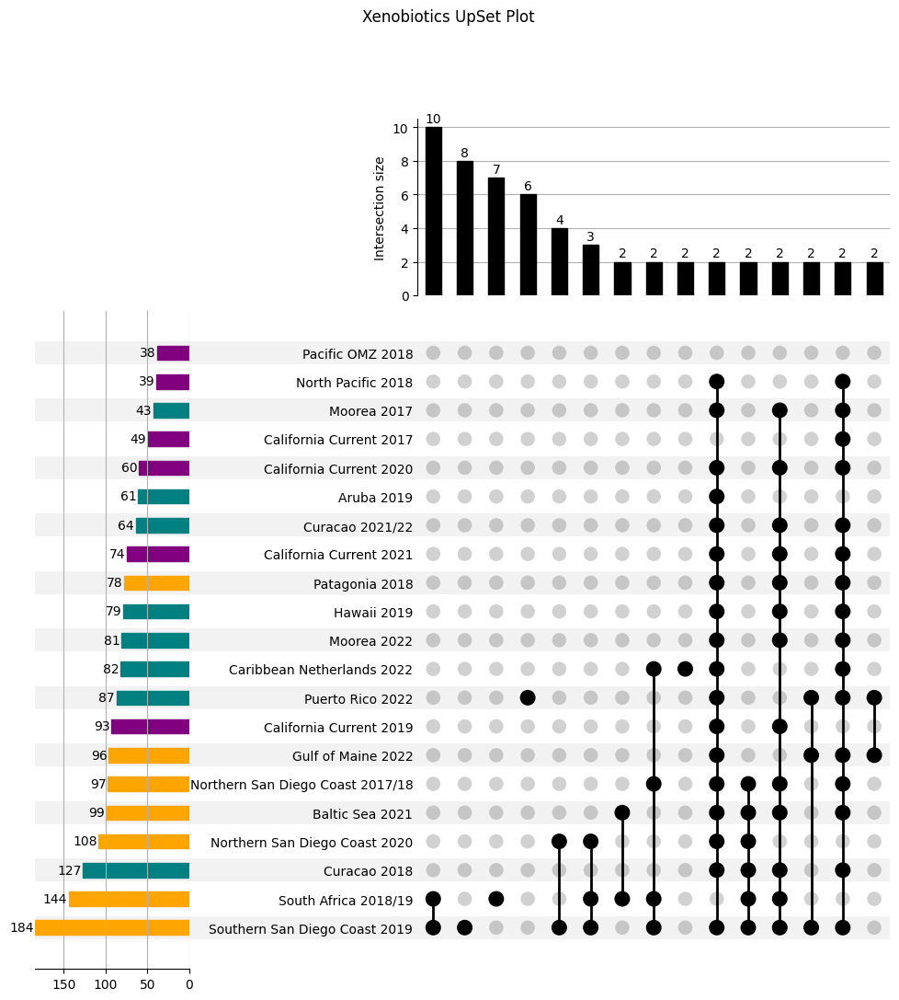

In [39]:
import matplotlib.pyplot as plt
from upsetplot import UpSet

# Assuming multi_index_df is your DataFrame
upset = UpSet(
    multi_index_df,
    show_counts=True,
    sort_by="cardinality",
    min_subset_size=2,
    totals_plot_elements=5
)

upset.style_categories(
    ["Moorea 2017", 'Aruba 2019', "Hawaii 2019", 'Caribbean Netherlands 2022', 'Curacao 2018', 'Curacao 2021/22', 'Moorea 2017','Moorea 2022','Puerto Rico 2022'], bar_facecolor="teal"
)

upset.style_categories(
    ['Baltic Sea 2021', 'Gulf of Maine 2022','Northern San Diego Coast 2017/18','Northern San Diego Coast 2020', 'Patagonia 2018','South Africa 2018/19','Southern San Diego Coast 2019'], bar_facecolor="orange"
)

upset.style_categories(
    ['California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021', 'North Pacific 2018','Pacific OMZ 2018'], bar_facecolor="purple"
)

# Plot
upset.plot()

# Add a title
plt.suptitle("Xenobiotics UpSet Plot")

# Save the plot as SVG
plt.savefig("xenobiotics_upset_plot.svg", format='svg')

# Show the plot
plt.show()


In [40]:
import pandas as pd

# Load the dataframe from the CSV file
df = pd.read_csv('preabs_Cleaned05_allfeatures_grouped.csv')

# Set the 'name' column as the index
df.set_index('row ID', inplace=True)

# Convert the DataFrame to boolean values
df = df.astype(bool)

# Create a MultiIndex from the DataFrame
multi_index_df2 = df.reset_index().set_index(list(df.columns))

# Print the DataFrame with MultiIndex
print(multi_index_df2)

                                                                                                                                                                                                                                                                                                                                                                                                                                 row ID
Aruba 2019 Baltic Sea 2021 California Current 2017 California Current 2019 California Current 2020 California Current 2021 Caribbean Netherlands 2022 Curacao 2018 Curacao 2021/22 Gulf of Maine 2022 Hawaii 2019 Moorea 2017 Moorea 2022 North Pacific 2018 Northern San Diego Coast 2017/18 Northern San Diego Coast 2020 Pacific OMZ 2018 Patagonia 2018 Puerto Rico 2022 South Africa 2018/19 Southern San Diego Coast 2019        
False      True            True                    False                   True                    True                    True                       Tr

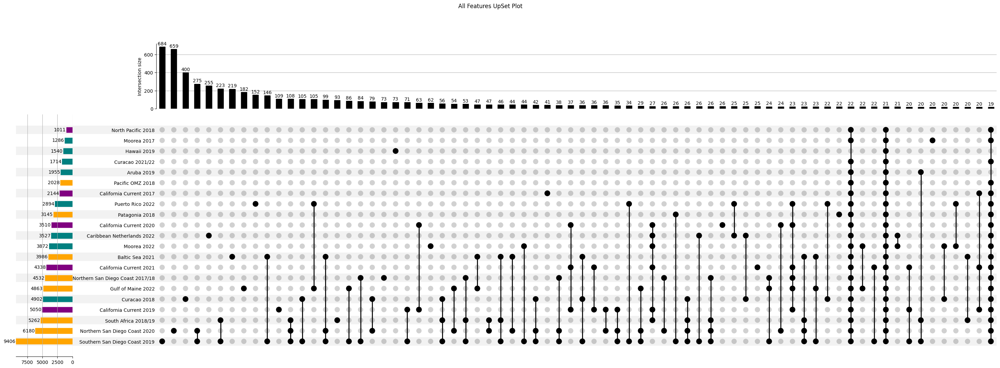

In [41]:
import matplotlib.pyplot as plt
from upsetplot import UpSet

# Assuming multi_index_df is your DataFrame
upset = UpSet(
    multi_index_df2,
    show_counts=True,
    sort_by="cardinality",
    min_subset_size=19,
    totals_plot_elements=5
)

upset.style_categories(
    ["Moorea 2017", 'Aruba 2019', "Hawaii 2019", 'Caribbean Netherlands 2022', 'Curacao 2018', 'Curacao 2021/22', 'Moorea 2017','Moorea 2022','Puerto Rico 2022'], bar_facecolor="teal"
)

upset.style_categories(
    ['Baltic Sea 2021', 'Gulf of Maine 2022','Northern San Diego Coast 2017/18','Northern San Diego Coast 2020','Pacific OMZ 2018', 'Patagonia 2018','South Africa 2018/19','Southern San Diego Coast 2019'], bar_facecolor="orange"
)

upset.style_categories(
    ['California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021', 'North Pacific 2018'], bar_facecolor="purple"
)

# Plot
upset.plot()

# Add a title
plt.suptitle("All Features UpSet Plot")

# Save the plot as SVG
plt.savefig("AllFeatures_upset_plot.svg", format='svg')

# Show the plot
plt.show()


# 5.Frequency plot (Fig.3a)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


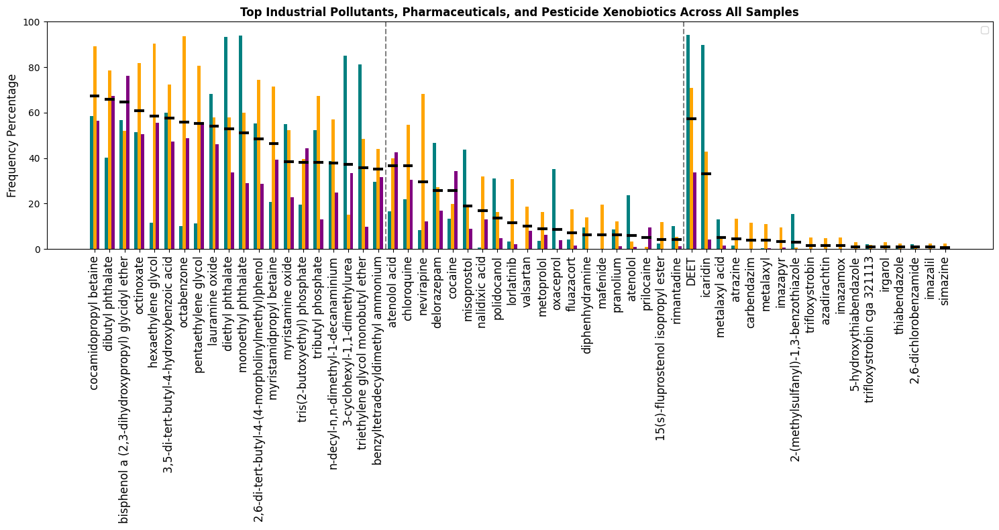

In [42]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data into a DataFrame
df = pd.read_csv('preabs_Cleaned05_xenobiotics.csv')

# Load the metadata
metadata = pd.read_csv('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Set the 'name' as the index
df.set_index('name', inplace=True)

# Separate the 'Type' column from the numerical data
types = df['Type']
df = df.drop(columns=['Type'])

# Filter metadata to include only samples present in df
metadata = metadata[metadata['filename'].isin(df.columns)]

# Calculate the frequency of presence (1s) for each feature
frequency = df.sum(axis=1)

# Calculate the total number of samples
total_samples = df.shape[1]

# Convert frequency to percentage
frequency_percentage = (frequency / total_samples) * 100

# Add frequency percentage and 'Type' back to the DataFrame
df['frequency_percentage'] = frequency_percentage
df['Type'] = types

# Filter the DataFrame by 'Type'
urban_df = df[df['Type'] == 'urban']
drug_df = df[df['Type'] == 'drug']
pesticide_df = df[df['Type'] == 'pesticide']

# Sort each type by frequency percentage in descending order and select top features
top_20_urban = urban_df.sort_values(by='frequency_percentage', ascending=False).head(20)
top_20_drug = drug_df.sort_values(by='frequency_percentage', ascending=False).head(20)
top_18_pesticide = pesticide_df.sort_values(by='frequency_percentage', ascending=False).head(18)

# Concatenate the top features into a single DataFrame
top_features = pd.concat([top_20_urban, top_20_drug, top_18_pesticide])

# Initialize a dictionary to store subgroup frequencies
subgroup_frequencies = {'Coral Reef': [], 'Coastal': [], 'Open Ocean': []}

# Calculate subgroup frequencies for each feature
for feature in top_features.index:
    for subgroup in subgroup_frequencies.keys():
        # Get samples belonging to the current subgroup
        subgroup_samples = metadata[metadata['ATTRIBUTE_ecosystem'] == subgroup]['filename']
        # Calculate the frequency of presence for the current subgroup
        subgroup_frequency = df.loc[feature, subgroup_samples].sum()
        # Convert to percentage
        subgroup_frequency_percentage = (subgroup_frequency / len(subgroup_samples)) * 100
        # Store the result
        subgroup_frequencies[subgroup].append(subgroup_frequency_percentage)

# Plot the frequency percentage of the top features with subgroups
plt.figure(figsize=(15, 8))

bar_width = 0.22  # Width of each subgroup bar (reduced by 20%)
master_bar_width = bar_width * 3  # Width of master bar

for i, feature in enumerate(top_features.index):
    # Plot the horizontal line at the maximum value of the master bar in black
    plt.hlines(y=top_features.loc[feature, 'frequency_percentage'], xmin=i - master_bar_width/2, xmax=i + master_bar_width/2, colors='black', linewidth=3)

    # Plot the subgroup bars with reduced width and touching each other within the master bar width
    plt.bar(i - bar_width, subgroup_frequencies['Coral Reef'][i], color='teal', width=bar_width)  # Darker blue
    plt.bar(i, subgroup_frequencies['Coastal'][i], color='orange', width=bar_width)
    plt.bar(i + bar_width, subgroup_frequencies['Open Ocean'][i], color='purple', width=bar_width)  # Brighter green

# Add vertical dashed lines between groups 'urban', 'drug', and 'pesticide'
urban_end_index = len(top_20_urban) - 0.5
drug_end_index = len(top_20_urban) + len(top_20_drug) - 0.5

plt.axvline(x=urban_end_index, color='gray', linestyle='--')
plt.axvline(x=drug_end_index, color='gray', linestyle='--')

plt.ylabel('Frequency Percentage', fontsize=12)
plt.title('Top Industrial Pollutants, Pharmaceuticals, and Pesticide Xenobiotics Across All Samples', fontsize=12, fontweight='bold')
plt.xticks(range(len(top_features.index)), top_features.index, rotation=90, fontsize=12)  # Manually set font size here
plt.ylim(0, 100)
plt.legend()

# Reduce space between y-axis and leftmost bar graph as well as between right panel boundary and rightmost bar graph
plt.subplots_adjust(left=0.05, right=0.95)

# Ensure the plot is fully rendered before saving
plt.tight_layout()

# Save the plot as an SVG file
plt.savefig('Feature_FrequencyPlot_FBMNblnkrem1_samplepresencevsID_xeno_top_features_with_subgroups.svg', format='svg')

# Show the plot
plt.show()

# 6.Violin plots (scaled) for xenobiotics and types (Fig.3 b)

In [43]:
import pandas as pd

# Load xenobiotic table
df = pd.read_csv('gnpsmergedtable05_tagged_filtered_merged.csv')

# Drop unknown classifications
df = df[df['Type'] != 'unknown']

# Keep only the 'row ID' and 'Type' columns
df = df[['row ID', 'Type']]

# Split the 'row ID' column
df_split = df['row ID'].str.split('_', expand=True)

# Flatten the DataFrame and drop NaN values
df_split = df_split.stack().reset_index(level=1, drop=True).to_frame(name='row ID')

# Add the 'Type' column back to the split DataFrame
df_split['Type'] = df['Type'].values.repeat(df_split.groupby(level=0).size())

# Remove duplicate entries
df_split = df_split.drop_duplicates()

print(df_split)


    row ID   Type
4    65213   drug
8    16881  urban
9    45941  urban
9    67961  urban
10   14947  urban
..     ...    ...
280  53451  urban
281  70530  urban
282  18801  urban
283  50531   drug
283  69257   drug

[338 rows x 2 columns]


In [44]:
import pandas as pd

# Load the FT
ft_df = pd.read_csv('featuretable_reformated.csv')

#remove Peak area suffix
ft_df.columns = ft_df.columns.str.replace(' Peak area', '')

# Remove columns that don't have '.mz' or 'ID' in their header 
ft_filtered = ft_df.filter(regex='(.mz|row ID)')

# Convert 'row ID' columns to the same type
ft_filtered['row ID'] = ft_filtered['row ID'].astype(str)
df_split['row ID'] = df_split['row ID'].astype(str)

# Merge DataFrames on 'row ID'
merged_df = pd.merge(ft_filtered, df_split, on='row ID', how='right')

# Save the filtered result to a new CSV file
merged_df.to_csv('xenobiotics_withblanks.csv', index=False)

print("The filtered feature table has been saved to 'filtered_featuretable.csv'.")


The filtered feature table has been saved to 'filtered_featuretable.csv'.


In [45]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Separate the 'row ID' and 'Type' columns 
id_type_df = merged_df[['row ID', 'Type']]

# Filter columns containing ".mz"
df = merged_df.filter(regex=".mz")

# Scale the features (rows)
scaled_features = scaler.fit_transform(df.T).T

# Create a new DataFrame with the scaled features
scaled_df = pd.DataFrame(scaled_features, index=df.index, columns=df.columns)

# Add the 'row ID' and 'Type' columns back to the scaled DataFrame 
final_df = pd.concat([id_type_df, scaled_df], axis=1)

# Save the final DataFrame to a new file with suffix '_Scaled'
final_df.to_csv('xenobiotics_withblanks_scaled.csv', index=False)


/tmp/ipykernel_20140/1792270501.py:59: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/1792270501.py:59: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



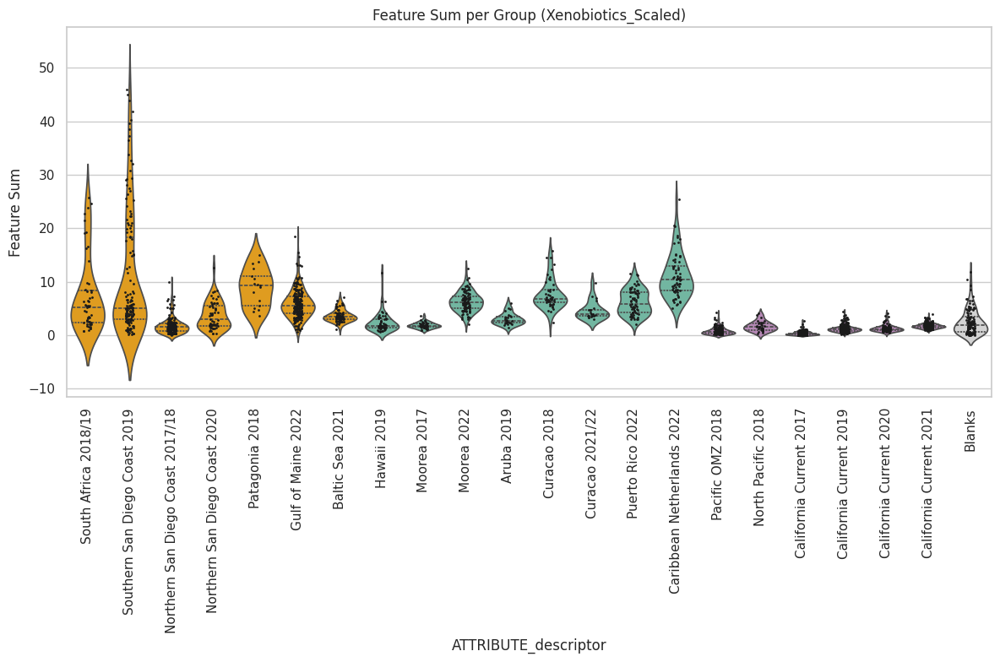

In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('xenobiotics_withblanks_scaled.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows
df['feature sum'] = df.sum(axis=1)

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Merge with metadata according to descriptor
df_merged = df.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021', 'Blanks']

# Sort the DataFrame based on the desired order
df_merged['ATTRIBUTE_descriptor'] = pd.Categorical(df_merged['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_merged = df_merged.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonia 2018': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2021': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_merged,
    x='ATTRIBUTE_descriptor',
    y='feature sum',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_merged,
    x='ATTRIBUTE_descriptor',
    y='feature sum',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Feature Sum per Group (Xenobiotics_Scaled)')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Feature Sum')
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('Xenobiotics_Scaled_violinplot.svg')
plt.show()

/tmp/ipykernel_20140/3838806928.py:61: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/3838806928.py:61: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



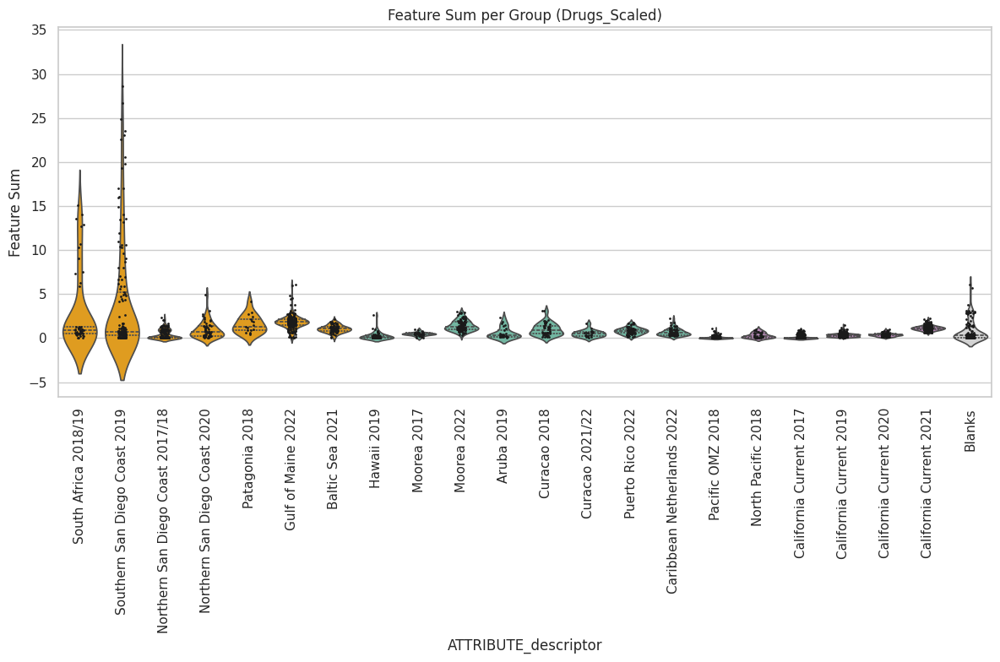

In [47]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('xenobiotics_withblanks_scaled.csv', index_col='row ID')

df = df[df['Type'] == 'drug']

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows
df['feature sum'] = df.sum(axis=1)

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Merge with metadata according to descriptor
df_merged = df.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021', 'Blanks']

# Sort the DataFrame based on the desired order
df_merged['ATTRIBUTE_descriptor'] = pd.Categorical(df_merged['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_merged = df_merged.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonia 2018': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2021': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_merged,
    x='ATTRIBUTE_descriptor',
    y='feature sum',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_merged,
    x='ATTRIBUTE_descriptor',
    y='feature sum',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Feature Sum per Group (Drugs_Scaled)')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Feature Sum')
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('Drugs_Scaled_violinplot.svg')
plt.show()

/tmp/ipykernel_20140/3100878023.py:61: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/3100878023.py:61: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



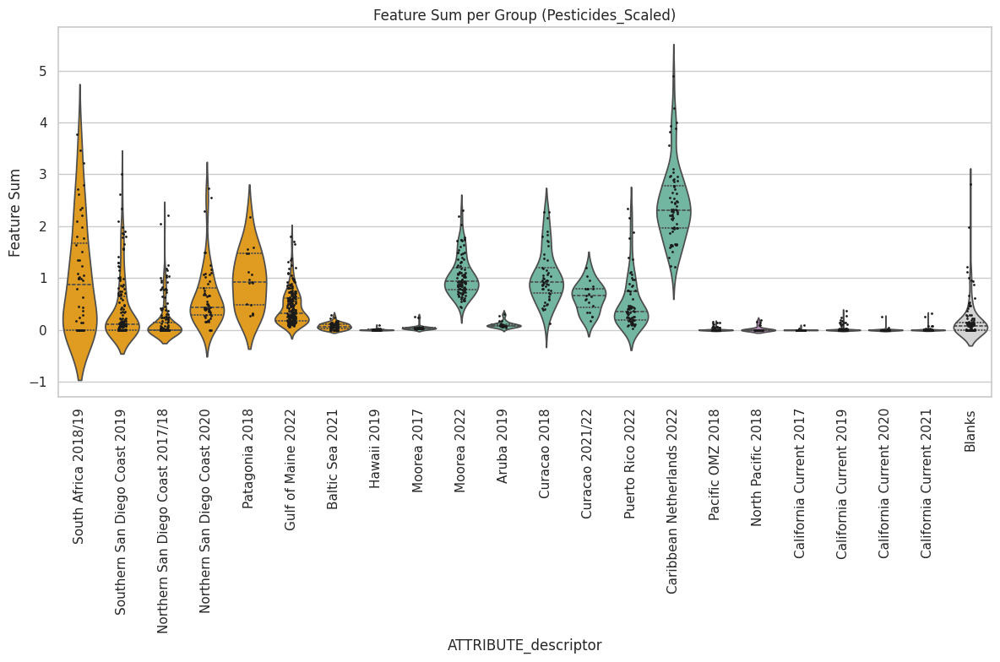

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('xenobiotics_withblanks_scaled.csv', index_col='row ID')

df = df[df['Type'] == 'pesticide']

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows
df['feature sum'] = df.sum(axis=1)

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Merge with metadata according to descriptor
df_merged = df.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021', 'Blanks']

# Sort the DataFrame based on the desired order
df_merged['ATTRIBUTE_descriptor'] = pd.Categorical(df_merged['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_merged = df_merged.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonia 2018': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2021': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_merged,
    x='ATTRIBUTE_descriptor',
    y='feature sum',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_merged,
    x='ATTRIBUTE_descriptor',
    y='feature sum',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Feature Sum per Group (Pesticides_Scaled)')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Feature Sum')
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('Pesticides_Scaled_violinplot.svg')
plt.show()

The filtered feature table has been saved to 'filtered_featuretable.csv'.


/tmp/ipykernel_20140/268821927.py:130: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/268821927.py:130: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



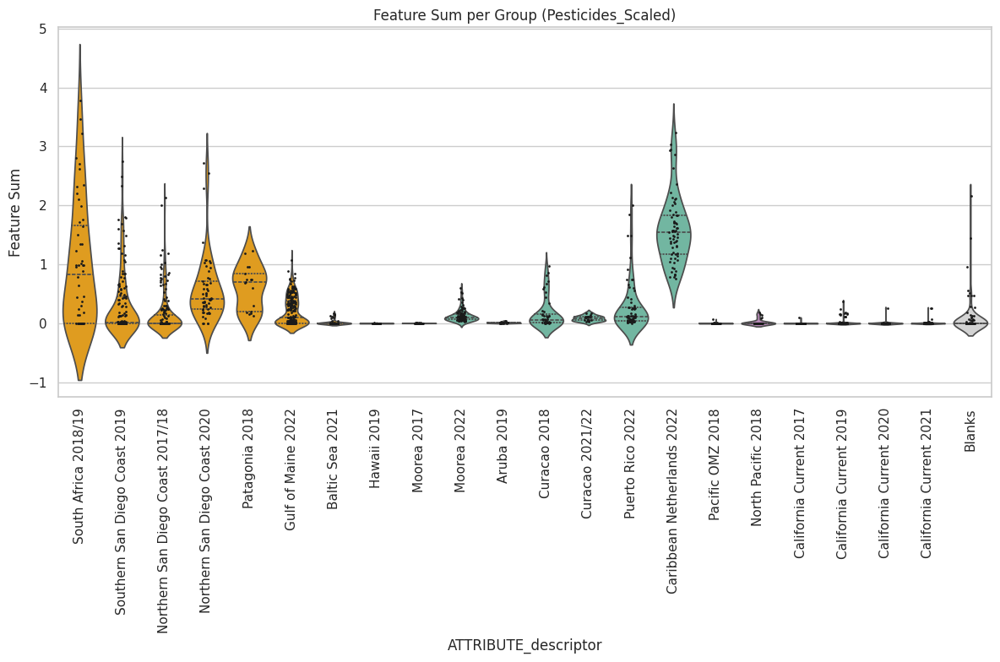

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Load xenobiotic table
df = pd.read_csv('gnpsmergedtable05_tagged_filtered_merged.csv')

# Drop unknown classifications
df = df[df['Type'] != 'unknown']

# Drop DEET
df = df[df['name'] != 'DEET']

# Keep only the 'row ID' and 'Type' columns
df = df[['row ID', 'Type']]

# Split the 'row ID' column
df_split = df['row ID'].str.split('_', expand=True)

# Flatten the DataFrame and drop NaN values
df_split = df_split.stack().reset_index(level=1, drop=True).to_frame(name='row ID')

# Add the 'Type' column back to the split DataFrame
df_split['Type'] = df['Type'].values.repeat(df_split.groupby(level=0).size())

# Remove duplicate entries
df_split = df_split.drop_duplicates()

# Load the FT
ft_df = pd.read_csv('featuretable_reformated.csv')

#remove Peak area suffix
ft_df.columns = ft_df.columns.str.replace(' Peak area', '')

# Remove columns that don't have '.mz' or 'ID' in their header 
ft_filtered = ft_df.filter(regex='(.mz|row ID)')

# Convert 'row ID' columns to the same type
ft_filtered['row ID'] = ft_filtered['row ID'].astype(str)
df_split['row ID'] = df_split['row ID'].astype(str)

# Merge DataFrames on 'row ID'
merged_df = pd.merge(ft_filtered, df_split, on='row ID', how='right')

# Save the filtered result to a new CSV file
merged_df.to_csv('xenobiotics_withblanks_noDEET.csv', index=False)

print("The filtered feature table has been saved to 'filtered_featuretable.csv'.")

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Separate the 'row ID' and 'Type' columns 
id_type_df = merged_df[['row ID', 'Type']]

# Filter columns containing ".mz"
df = merged_df.filter(regex=".mz")

# Scale the features (rows)
scaled_features = scaler.fit_transform(df.T).T

# Create a new DataFrame with the scaled features
scaled_df = pd.DataFrame(scaled_features, index=df.index, columns=df.columns)

# Add the 'row ID' and 'Type' columns back to the scaled DataFrame 
final_df = pd.concat([id_type_df, scaled_df], axis=1)

# Save the final DataFrame to a new file with suffix '_Scaled'
final_df.to_csv('xenobiotics_withblanks_scaled_noDEET.csv', index=False) 

# Load the data
df = pd.read_csv('xenobiotics_withblanks_scaled_noDEET.csv', index_col='row ID')

df = df[df['Type'] == 'pesticide']

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows
df['feature sum'] = df.sum(axis=1)

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Merge with metadata according to descriptor
df_merged = df.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021', 'Blanks']

# Sort the DataFrame based on the desired order
df_merged['ATTRIBUTE_descriptor'] = pd.Categorical(df_merged['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_merged = df_merged.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonia 2018': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2021': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_merged,
    x='ATTRIBUTE_descriptor',
    y='feature sum',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_merged,
    x='ATTRIBUTE_descriptor',
    y='feature sum',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Feature Sum per Group (Pesticides_Scaled)')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Feature Sum')
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('Pesticides_Scaled_violinplot_noDEET.svg')
plt.show()

/tmp/ipykernel_20140/206559198.py:61: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/206559198.py:61: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



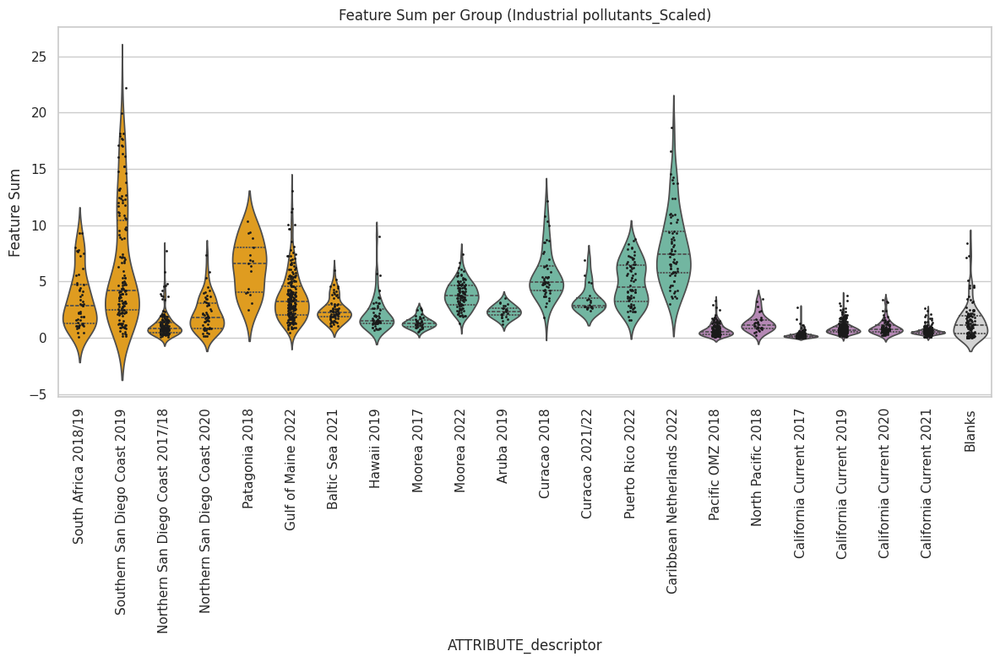

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('xenobiotics_withblanks_scaled.csv', index_col='row ID')

df = df[df['Type'] == 'urban']

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows
df['feature sum'] = df.sum(axis=1)

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Merge with metadata according to descriptor
df_merged = df.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021', 'Blanks']

# Sort the DataFrame based on the desired order
df_merged['ATTRIBUTE_descriptor'] = pd.Categorical(df_merged['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_merged = df_merged.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonia 2018': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2021': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_merged,
    x='ATTRIBUTE_descriptor',
    y='feature sum',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_merged,
    x='ATTRIBUTE_descriptor',
    y='feature sum',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Feature Sum per Group (Industrial pollutants_Scaled)')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Feature Sum')
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('IndustrialPollutants_Scaled_violinplot.svg')
plt.show()

# 7.Percentage violins (Fig.5a)

In [51]:
import pandas as pd

# Load xenobiotic table
df = pd.read_csv('gnpsmergedtable05_tagged_filtered_merged.csv')

# Drop unknown classifications
df = df[df['Type'] != 'unknown']

# Keep only the 'row ID' and 'Type' columns
df = df[['row ID', 'Type', 'Class']]

# Split the 'row ID' column
df_split = df['row ID'].str.split('_', expand=True)

# Flatten the DataFrame and drop NaN values
df_split = df_split.stack().reset_index(level=1, drop=True).to_frame(name='row ID')

# Add the 'Type' column back to the split DataFrame
df_split['Type'] = df['Type'].values.repeat(df_split.groupby(level=0).size())
df_split['Class'] = df['Class'].values.repeat(df_split.groupby(level=0).size())

# Remove duplicate entries
df_split = df_split.drop_duplicates()

print(df_split)
df_split.to_csv('unique_xenobiotic_features.csv', index=False)


    row ID   Type            Class
4    65213   drug     chlorophenyl
8    16881  urban        guanidino
9    45941  urban        guanidino
9    67961  urban        guanidino
10   14947  urban        guanidino
..     ...    ...              ...
280  53451  urban  organophosphate
281  70530  urban  organophosphate
282  18801  urban           glycol
283  50531   drug         tetrazol
283  69257   drug         tetrazol

[338 rows x 3 columns]


In [52]:
import pandas as pd

# Load xenobiotic table
df = pd.read_csv('gnpsmergedtable05_tagged_filtered_merged.csv')

# Drop unknown classifications
df = df[df['Type'] != 'unknown']

# Drop unknown classifications
df = df[df['name'] != 'DEET']

# Keep only the 'row ID' and 'Type' columns
df = df[['row ID', 'Type', 'Class']]

# Split the 'row ID' column
df_split = df['row ID'].str.split('_', expand=True)

# Flatten the DataFrame and drop NaN values
df_split = df_split.stack().reset_index(level=1, drop=True).to_frame(name='row ID')

# Add the 'Type' column back to the split DataFrame
df_split['Type'] = df['Type'].values.repeat(df_split.groupby(level=0).size())
df_split['Class'] = df['Class'].values.repeat(df_split.groupby(level=0).size())

# Remove duplicate entries
df_split = df_split.drop_duplicates()

print(df_split)
df_split.to_csv('unique_xenobiotic_features_noDEET.csv', index=False)


    row ID   Type            Class
4    65213   drug     chlorophenyl
8    16881  urban        guanidino
9    45941  urban        guanidino
9    67961  urban        guanidino
10   14947  urban        guanidino
..     ...    ...              ...
280  53451  urban  organophosphate
281  70530  urban  organophosphate
282  18801  urban           glycol
283  50531   drug         tetrazol
283  69257   drug         tetrazol

[333 rows x 3 columns]


/tmp/ipykernel_20140/3221873803.py:73: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/3221873803.py:73: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



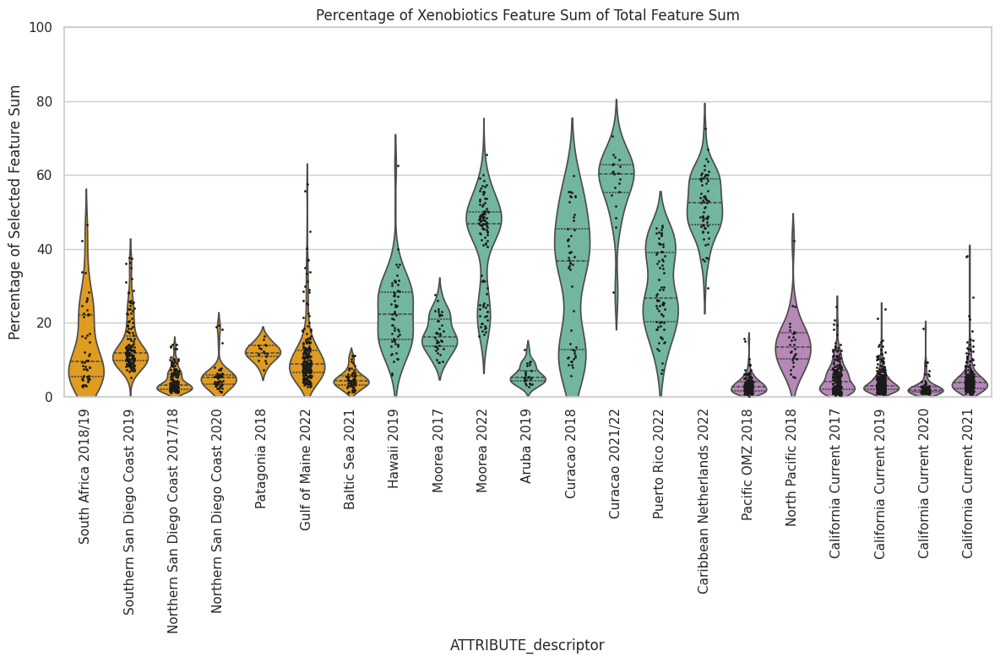

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

df_featuresofinterest = pd.read_csv('unique_xenobiotic_features.csv')

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[df_featuresofinterest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonia 2018': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2021': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    #'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Percentage of Xenobiotics Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Percentage of Selected Feature Sum')
plt.ylim(0, 100)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('percentageplot_xenobiotics.svg')
plt.show()

# Save the final DataFrame to a CSV file
df_final.to_csv('final_results_xenobiotics.csv', index=False)

/tmp/ipykernel_20140/2132942530.py:84: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/2132942530.py:84: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



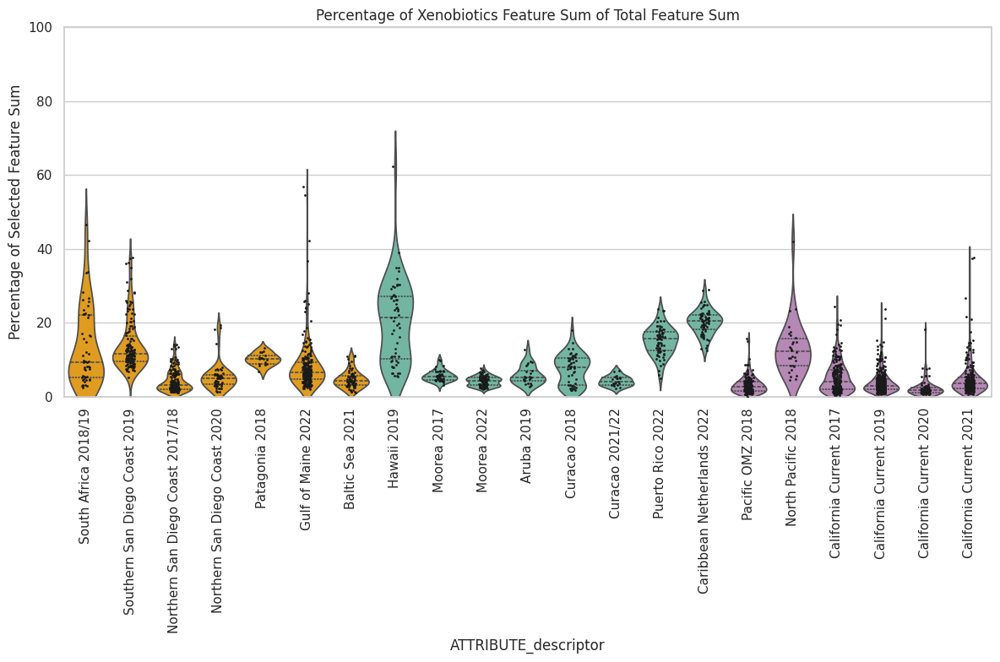

In [54]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

df_featuresofinterest = pd.read_csv('unique_xenobiotic_features_noDEET.csv')

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[df_featuresofinterest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_descriptor')

# Calculate the median and mean for each ATTRIBUTE_descriptor
median_values = df_final.groupby('ATTRIBUTE_descriptor')['percentage'].median().reset_index()
median_values.rename(columns={'percentage': 'median_percentage'}, inplace=True)

mean_values = df_final.groupby('ATTRIBUTE_descriptor')['percentage'].mean().reset_index()
mean_values.rename(columns={'percentage': 'mean_percentage'}, inplace=True)

# Merge the median and mean values with the final DataFrame
df_final = df_final.merge(median_values, on='ATTRIBUTE_descriptor')
df_final = df_final.merge(mean_values, on='ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonia 2018': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2021': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    #'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Percentage of Xenobiotics Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Percentage of Selected Feature Sum')
plt.ylim(0, 100)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('percentageplot_xenobiotics_noDEET.svg')
plt.show()

# Save the final DataFrame to a CSV file
df_final.to_csv('final_results_xenobiotics_noDEETmedian.csv', index=False)


/tmp/ipykernel_20140/1646039420.py:86: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/1646039420.py:86: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



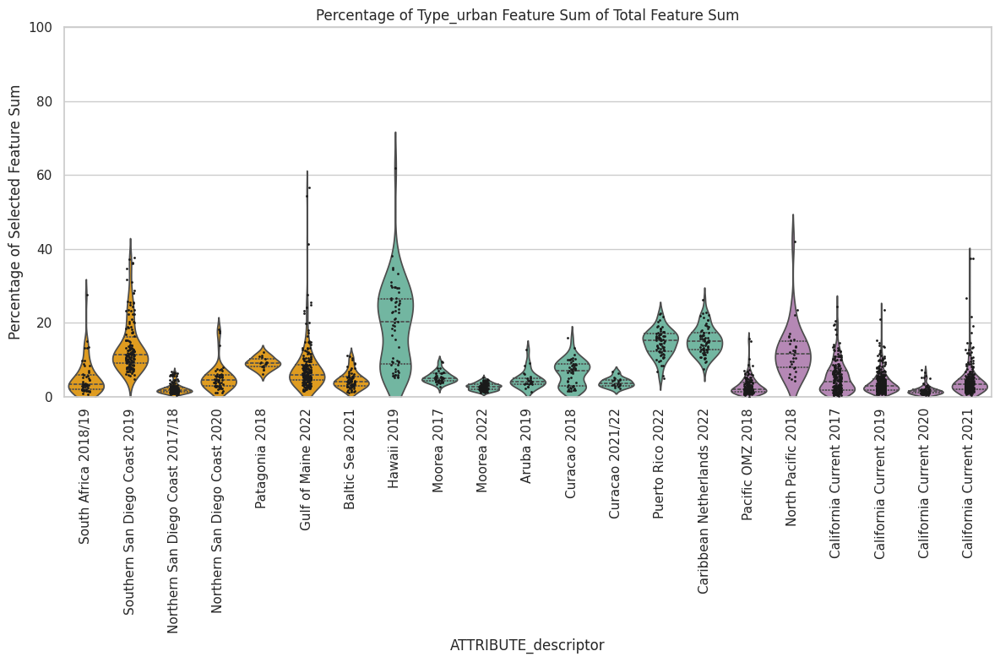

/tmp/ipykernel_20140/1646039420.py:86: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/1646039420.py:86: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



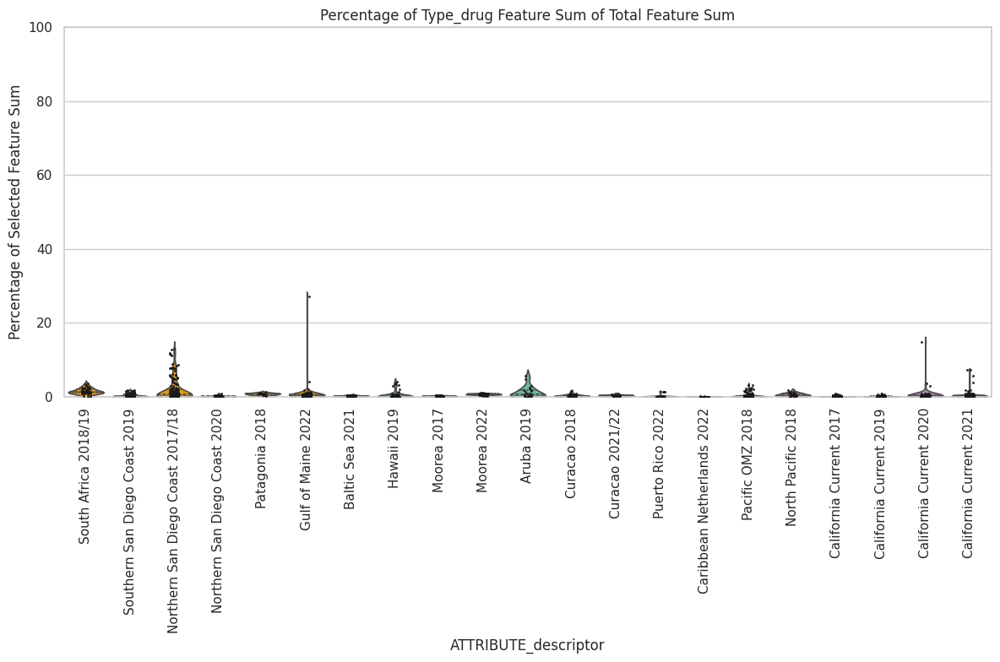

/tmp/ipykernel_20140/1646039420.py:86: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/1646039420.py:86: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



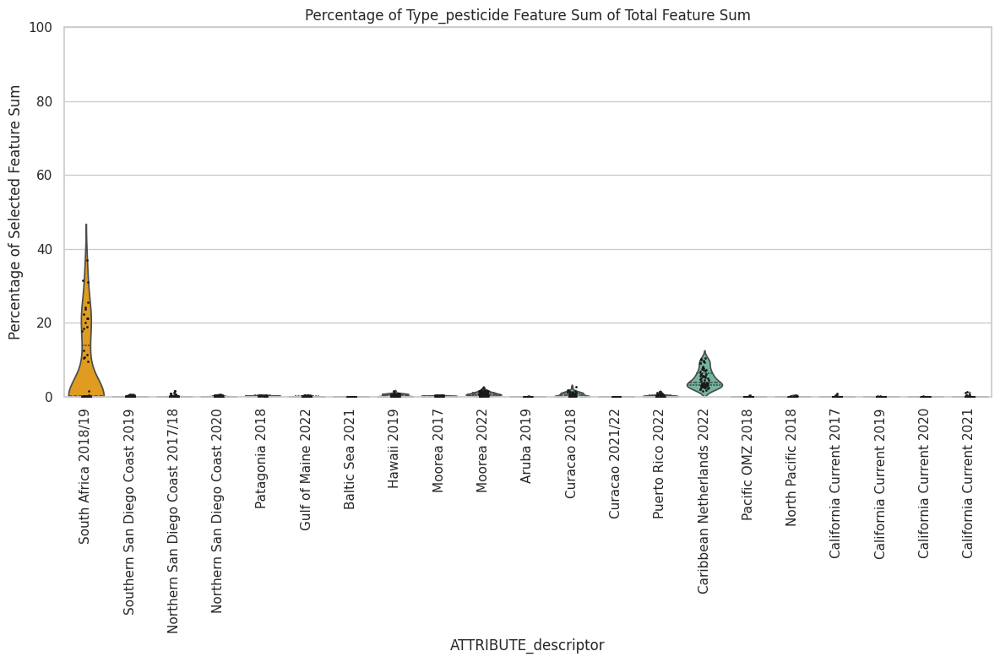

/tmp/ipykernel_20140/1646039420.py:86: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/1646039420.py:86: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



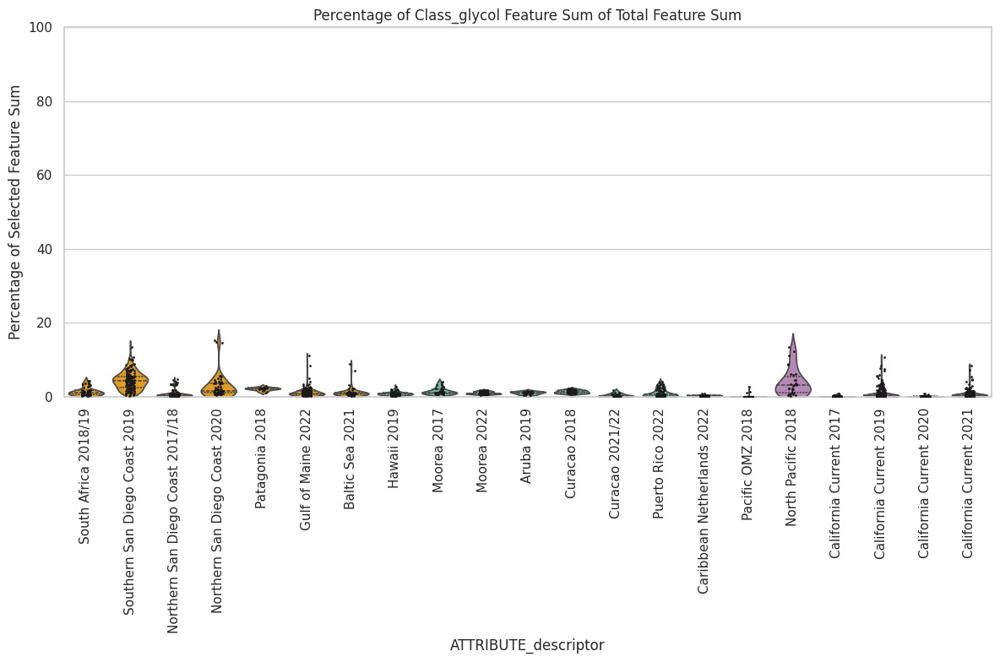

/tmp/ipykernel_20140/1646039420.py:86: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/1646039420.py:86: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



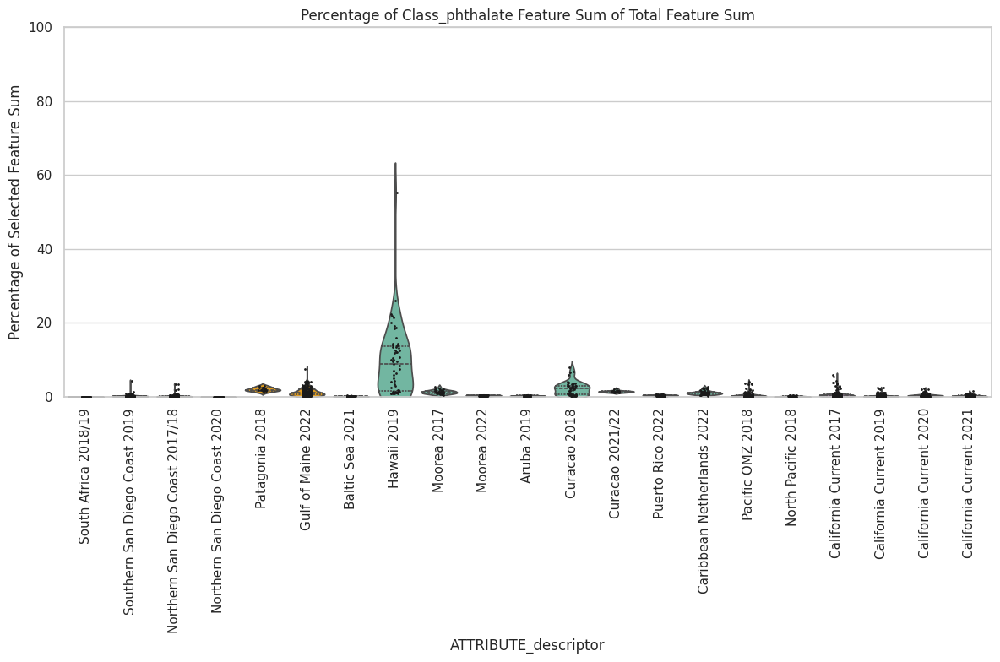

/tmp/ipykernel_20140/1646039420.py:86: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/1646039420.py:86: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



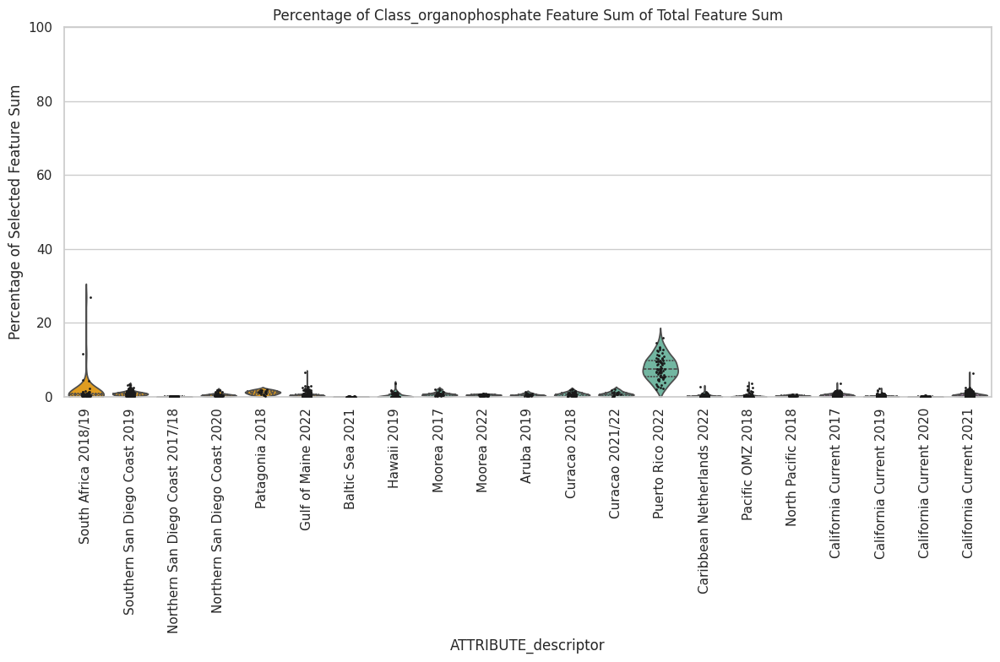

In [55]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

# Load features of interest
df_featuresofinterest = pd.read_csv('unique_xenobiotic_features_noDEET.csv')

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonia 2018': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2021': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd'
}

# Define subsets for Type and Class
subsets = {
    "Type_urban": df_featuresofinterest[df_featuresofinterest['Type'] == "urban"],
    "Type_drug": df_featuresofinterest[df_featuresofinterest['Type'] == "drug"],
    "Type_pesticide": df_featuresofinterest[df_featuresofinterest['Type'] == "pesticide"],
    "Class_glycol": df_featuresofinterest[df_featuresofinterest['Class'] == "glycol"],
    "Class_phthalate": df_featuresofinterest[df_featuresofinterest['Class'] == "phthalate"],
    "Class_organophosphate": df_featuresofinterest[df_featuresofinterest['Class'] == "organophosphate"]
}

for subset_name, subset_df in subsets.items():
    
    # Filter the DataFrame to keep only the features of interest
    df_selected_features = df[subset_df['row ID']]
    
    # Sum the selected features per sample
    df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
    
    # Calculate the percentage of selected feature sum compared to total feature sum
    df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
    
    # Merge with metadata according to descriptor
    df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')
    
    # Sort the DataFrame based on the desired order
    df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
    df_final = df_final.sort_values('ATTRIBUTE_descriptor')
    
    # Plot violin plot
    plt.figure(figsize=(12, 8))
    sns.set_theme(style="whitegrid")
    
    ax = sns.violinplot(
        data=df_final,
        x='ATTRIBUTE_descriptor',
        y='percentage',
        inner='quartile',  
        palette=custom_palette,
        scale='width'  
    )
    
    sns.stripplot(
        data=df_final,
        x='ATTRIBUTE_descriptor',
        y='percentage',
        color='k',
        size=2,  
        jitter=True,  
        ax=ax
    )
    
    plt.title(f'Percentage of {subset_name} Feature Sum of Total Feature Sum')
    plt.xlabel('ATTRIBUTE_descriptor')
    plt.ylabel('Percentage of Selected Feature Sum')
    plt.ylim(0, 100)
    plt.xticks(rotation=90)
    plt.tight_layout()
    
    # Save plot and DataFrame to files
    plt.savefig(f'percentageplot_{subset_name}.svg')
    plt.show()
    
    df_final.to_csv(f'final_results_{subset_name}.csv', index=False)

/tmp/ipykernel_20140/752042209.py:81: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/752042209.py:81: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



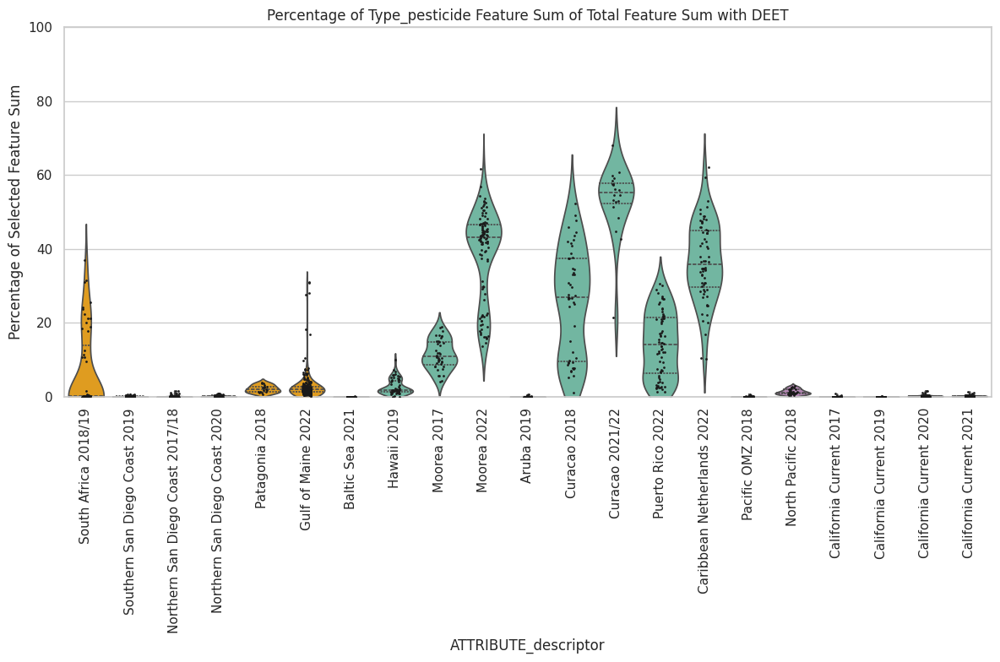

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

# Load features of interest
df_featuresofinterest = pd.read_csv('unique_xenobiotic_features.csv')

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonia 2018': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2021': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd'
}

# Define subsets for Type and Class
subsets = {
    "Type_pesticide": df_featuresofinterest[df_featuresofinterest['Type'] == "pesticide"]
}

for subset_name, subset_df in subsets.items():
    
    # Filter the DataFrame to keep only the features of interest
    df_selected_features = df[subset_df['row ID']]
    
    # Sum the selected features per sample
    df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
    
    # Calculate the percentage of selected feature sum compared to total feature sum
    df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
    
    # Merge with metadata according to descriptor
    df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')
    
    # Sort the DataFrame based on the desired order
    df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
    df_final = df_final.sort_values('ATTRIBUTE_descriptor')
    
    # Plot violin plot
    plt.figure(figsize=(12, 8))
    sns.set_theme(style="whitegrid")
    
    ax = sns.violinplot(
        data=df_final,
        x='ATTRIBUTE_descriptor',
        y='percentage',
        inner='quartile',  
        palette=custom_palette,
        scale='width'  
    )
    
    sns.stripplot(
        data=df_final,
        x='ATTRIBUTE_descriptor',
        y='percentage',
        color='k',
        size=2,  
        jitter=True,  
        ax=ax
    )
    
    plt.title(f'Percentage of {subset_name} Feature Sum of Total Feature Sum with DEET')
    plt.xlabel('ATTRIBUTE_descriptor')
    plt.ylabel('Percentage of Selected Feature Sum')
    plt.ylim(0, 100)
    plt.xticks(rotation=90)
    plt.tight_layout()
    
    # Save plot and DataFrame to files
    plt.savefig(f'percentageplot_{subset_name}_withDEET.svg')
    plt.show()
    
    df_final.to_csv(f'final_results_{subset_name}_withDEET.csv', index=False)

# 8. 1st neighbors Percentage plots (Fig.5b)

In [57]:
import pandas as pd

# Read the CSV files
df1 = pd.read_csv('unique_xenobiotic_features_noDEET.csv')  # File 1
df2 = pd.read_csv('filtered_pairs.tsv', sep="\t")     # File 2

df1_prefixed1 = df1.add_prefix('1_')

# Merge on 'row ID' in df1 and 'CLUSTERID1' in df2 with an outer merge
merged_df1 = pd.merge(df1_prefixed1, df2, left_on='1_row ID', right_on='CLUSTERID1', how='outer')

df1_prefixed = df1.add_prefix('2_')

# Merge on 'row ID' in df1 and 'CLUSTERID1' in df2 with an outer merge
merged_df2 = pd.merge(df1_prefixed, merged_df1, left_on='2_row ID', right_on='CLUSTERID2', how='outer')

# Merge columns with 'Class' in their names
merged_df2['Class'] = merged_df2.filter(like='Class').apply(lambda x: '_'.join(x.fillna('').astype(str)), axis=1)

# Merge columns with 'Type' in their names
merged_df2['Type'] = merged_df2.filter(like='Type').apply(lambda x: '_'.join(x.fillna('').astype(str)), axis=1)

# Drop columns with 'row ID' in their names
merged_df2 = merged_df2.drop(columns=merged_df2.filter(like='row ID').columns)
# Drop columns with 'row ID' in their names
merged_df2 = merged_df2.drop(columns=merged_df2.filter(like='1_').columns)
# Drop columns with 'row ID' in their names
merged_df2 = merged_df2.drop(columns=merged_df2.filter(like='2_').columns)

# Drop rows that are empty in CLUSTERID1
merged_df2 = merged_df2.dropna(subset=['CLUSTERID1'])

# Strip underscores from both the front and the end of strings
merged_df2['Class'] = merged_df2['Class'].str.strip('_')
merged_df2['Type'] = merged_df2['Type'].str.strip('_')

# Function to merge replicates
def merge_replicates(s):
    parts = s.split('_')
    unique_parts = []
    for part in parts:
        if not unique_parts or unique_parts[-1] != part:
            unique_parts.append(part)
    return '_'.join(unique_parts)

# Apply the function to 'Class' and 'Type' columns
merged_df2['Class'] = merged_df2['Class'].apply(merge_replicates)
merged_df2['Type'] = merged_df2['Type'].apply(merge_replicates)

# Drop rows that are empty or contain only empty strings in 'Class'
merged_df2 = merged_df2[merged_df2['Class'].str.strip() != '']
merged_df2 = merged_df2.dropna(subset=['Class'])

# Save the filtered DataFrame to a new CSV file (e.g., 'amended_filtered_pairs.csv')
merged_df2.to_csv('amended_filtered_pairs.csv', index=False)

In [58]:
import pandas as pd

# Load the amended_filtered_pairs.csv file
df = pd.read_csv('amended_filtered_pairs.csv')

# Extract unique values from CLUSTERID1 and CLUSTERID2 and put them into a column 'row ID'
unique_ids = pd.unique(df[['CLUSTERID1', 'CLUSTERID2']].values.ravel('K'))
unique_df = pd.DataFrame(unique_ids, columns=['row ID'])

# Function to merge replicates and remove duplicates
def merge_replicates(s):
    parts = s.split('_')
    unique_parts = []
    for part in parts:
        if part not in unique_parts:
            unique_parts.append(part)
    return '_'.join(unique_parts)

# Initialize 'Class' and 'Type' columns in unique_df
unique_df['Class'] = ''
unique_df['Type'] = ''

# Populate 'Class' and 'Type' columns with corresponding values
for idx, row_id in enumerate(unique_df['row ID']):
    class_values = df[(df['CLUSTERID1'] == row_id) | (df['CLUSTERID2'] == row_id)]['Class'].dropna().unique()
    type_values = df[(df['CLUSTERID1'] == row_id) | (df['CLUSTERID2'] == row_id)]['Type'].dropna().unique()
    
    # Merge and separate 'Class' and 'Type' values, remove duplicates
    merged_class = '_'.join(class_values).replace('__', '_').strip('_')
    merged_type = '_'.join(type_values).replace('__', '_').strip('_')
    
    unique_df.at[idx, 'Class'] = merge_replicates(merged_class)
    unique_df.at[idx, 'Type'] = merge_replicates(merged_type)

# Drop rows that are empty or contain only empty strings in 'Class'
unique_df = unique_df[unique_df['Class'].str.strip() != '']
unique_df = unique_df.dropna(subset=['Class'])

# Save the resulting DataFrame to a new CSV file (e.g., 'unique_combined_pairs.csv')
unique_df.to_csv('unique_combined_filtered_pairs.csv', index=False)

print("The unique values have been extracted and saved to 'unique_combined_pairs.csv'.")



The unique values have been extracted and saved to 'unique_combined_pairs.csv'.


/tmp/ipykernel_20140/1464456431.py:86: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/1464456431.py:86: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



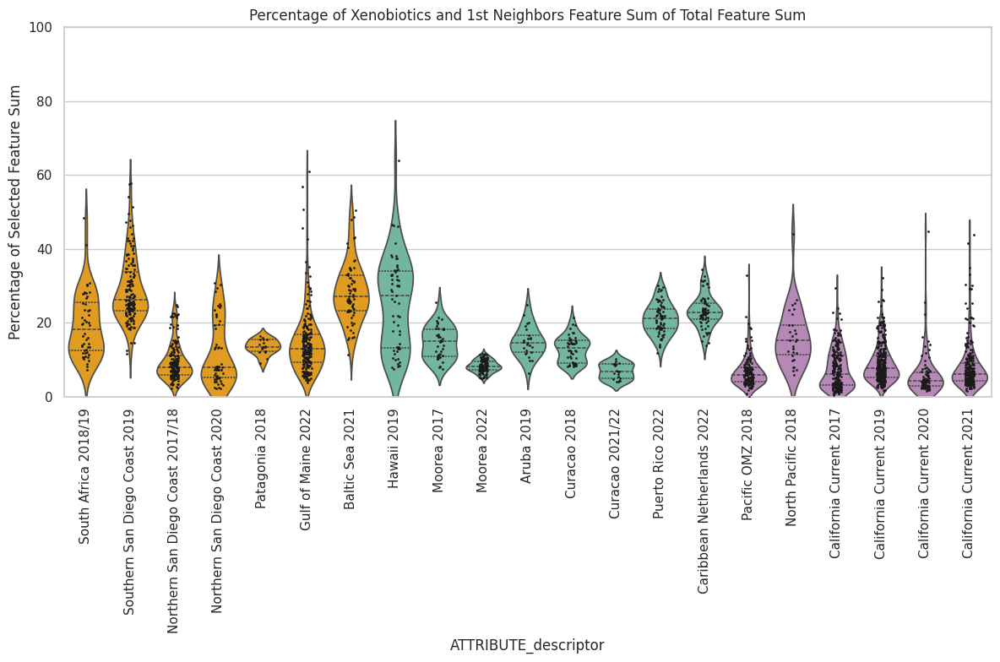

In [59]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

df_featuresofinterest = pd.read_csv('unique_combined_filtered_pairs.csv', dtype={'row ID': int})

df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['row ID'].isin(pd.read_csv('Transposed_Cleaned05_go.csv')['row ID'])]

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[df_featuresofinterest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_descriptor')

# Calculate the median and mean for each ATTRIBUTE_descriptor
median_values = df_final.groupby('ATTRIBUTE_descriptor')['percentage'].median().reset_index()
median_values.rename(columns={'percentage': 'median_percentage'}, inplace=True)

mean_values = df_final.groupby('ATTRIBUTE_descriptor')['percentage'].mean().reset_index()
mean_values.rename(columns={'percentage': 'mean_percentage'}, inplace=True)

# Merge the median and mean values with the final DataFrame
df_final = df_final.merge(median_values, on='ATTRIBUTE_descriptor')
df_final = df_final.merge(mean_values, on='ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonia 2018': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2021': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    #'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Percentage of Xenobiotics and 1st Neighbors Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Percentage of Selected Feature Sum')
plt.ylim(0, 100)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('percentageplot_xenobiotics1stneighbors_noDEET.svg')
plt.show()

# Save the final DataFrame to a CSV file
df_final.to_csv('final_results_xenobiotics1stneighbors_noDEET.csv', index=False)


# 9. 1st neighbor violin plots xenobiotic class scaled (Fig.4)

In [60]:
import pandas as pd

# Load xenobiotic table
df = pd.read_csv('unique_combined_filtered_pairs.csv')
df['row ID'] = df['row ID'].astype(str)
df['Class'] = df['Class'].astype(str)
# Drop unknown classifications
df = df[df['Type'] != 'unknown']

# Keep only the 'row ID' and 'Class' columns
df = df[['row ID', 'Class']]

# Convert 'row ID' to floats and then to integers
df['row ID'] = df['row ID'].astype(float).astype(int)

# Split the 'row ID' column
df_split = df['row ID'].astype(str).str.split('_', expand=True)

# Flatten the DataFrame and drop NaN values
df_split = df_split.stack().reset_index(level=1, drop=True).to_frame(name='row ID')

# Convert 'row ID' back to integers
df_split['row ID'] = df_split['row ID'].astype(int)

# Add the 'Class' column back to the split DataFrame
df_split['Class'] = df['Class'].values.repeat(df_split.groupby(level=0).size())

# Remove duplicate entries
df_split = df_split.drop_duplicates()

print(df_split)

     row ID                      Class
0     19012                  guanidino
1      2022                  guanidino
2     14947                  guanidino
3     50155                pyrollidone
4     60544  fluorinated_benzopyranone
..      ...                        ...
692   68281                   acrylate
693   63815                   acrylate
694   79384                   acrylate
695   85803            organophosphate
696   25612                     glycol

[697 rows x 2 columns]


In [61]:
import pandas as pd

# Load the FT
ft_df = pd.read_csv('featuretable_reformated.csv')

#remove Peak area suffix
ft_df.columns = ft_df.columns.str.replace(' Peak area', '')

# Remove columns that don't have '.mz' or 'ID' in their header 
ft_filtered = ft_df.filter(regex='(.mz|row ID)')

# Convert 'row ID' columns to the same type
ft_filtered['row ID'] = ft_filtered['row ID'].astype(str)
df_split['row ID'] = df_split['row ID'].astype(str)

# Merge DataFrames on 'row ID'
merged_df = pd.merge(ft_filtered, df_split, on='row ID', how='right')

# Save the filtered result to a new CSV file
merged_df.to_csv('xenobiotics1stneighbors_withblanks(class).csv', index=False)

print("The filtered feature table has been saved to 'filtered_featuretable.csv'.")


The filtered feature table has been saved to 'filtered_featuretable.csv'.


In [62]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Separate the 'row ID' and 'Type' columns 
id_type_df = merged_df[['row ID', 'Class']]

# Filter columns containing ".mz"
df = merged_df.filter(regex=".mz")

# Scale the features (rows)
scaled_features = scaler.fit_transform(df.T).T

# Create a new DataFrame with the scaled features
scaled_df = pd.DataFrame(scaled_features, index=df.index, columns=df.columns)

# Add the 'row ID' and 'Type' columns back to the scaled DataFrame 
final_df = pd.concat([id_type_df, scaled_df], axis=1)

# Save the final DataFrame to a new file with suffix '_Scaled'
final_df.to_csv('xenobiotics1stneighbors_withblanks(class)_scaled.csv', index=False)


/tmp/ipykernel_20140/1640889679.py:66: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/1640889679.py:66: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



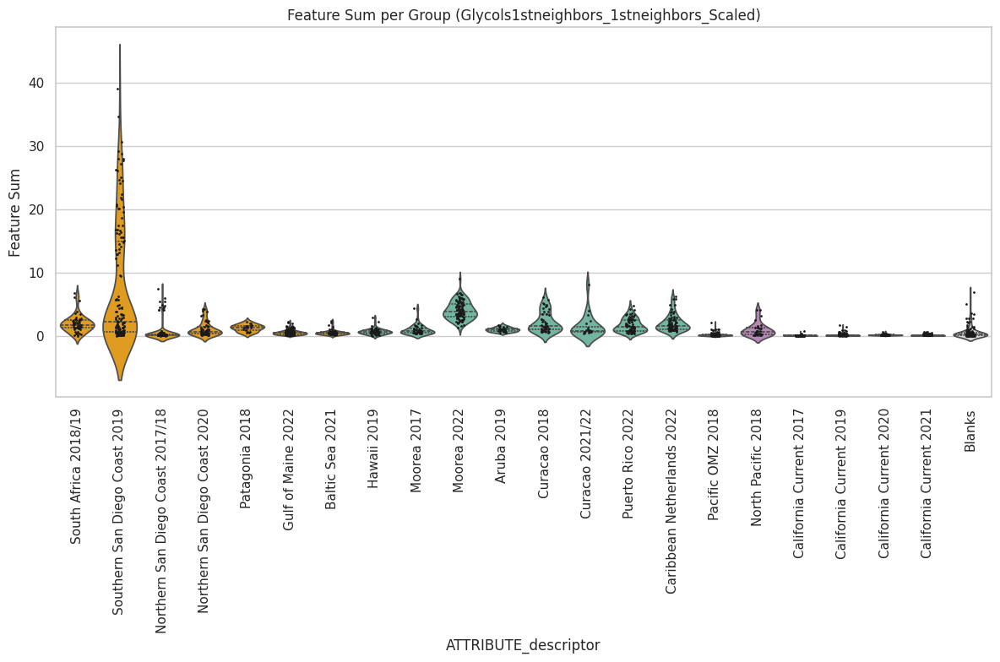

/tmp/ipykernel_20140/1640889679.py:66: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/1640889679.py:66: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



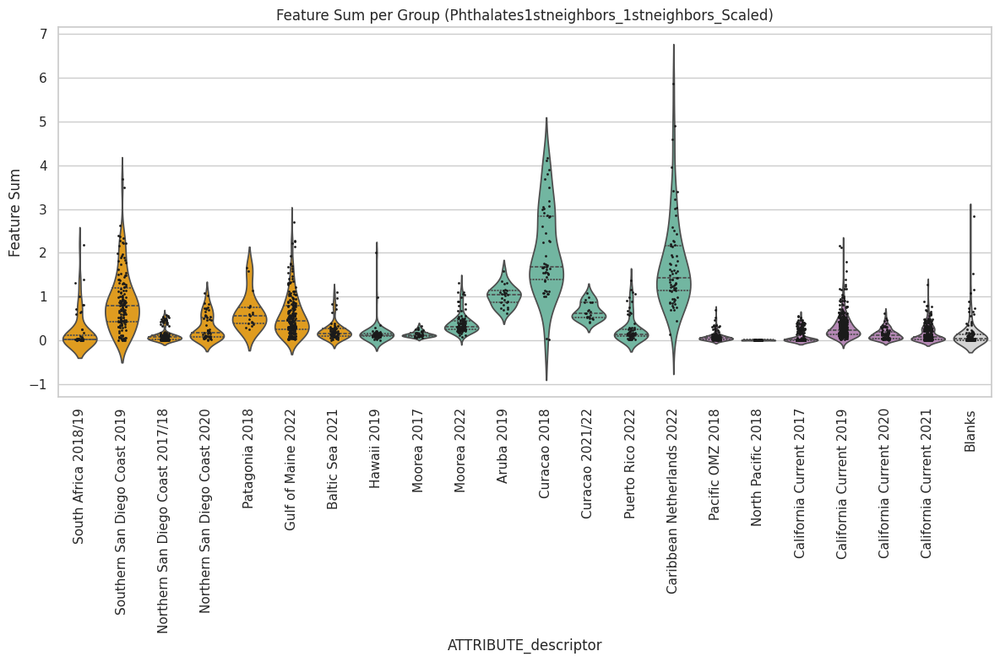

/tmp/ipykernel_20140/1640889679.py:66: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/1640889679.py:66: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



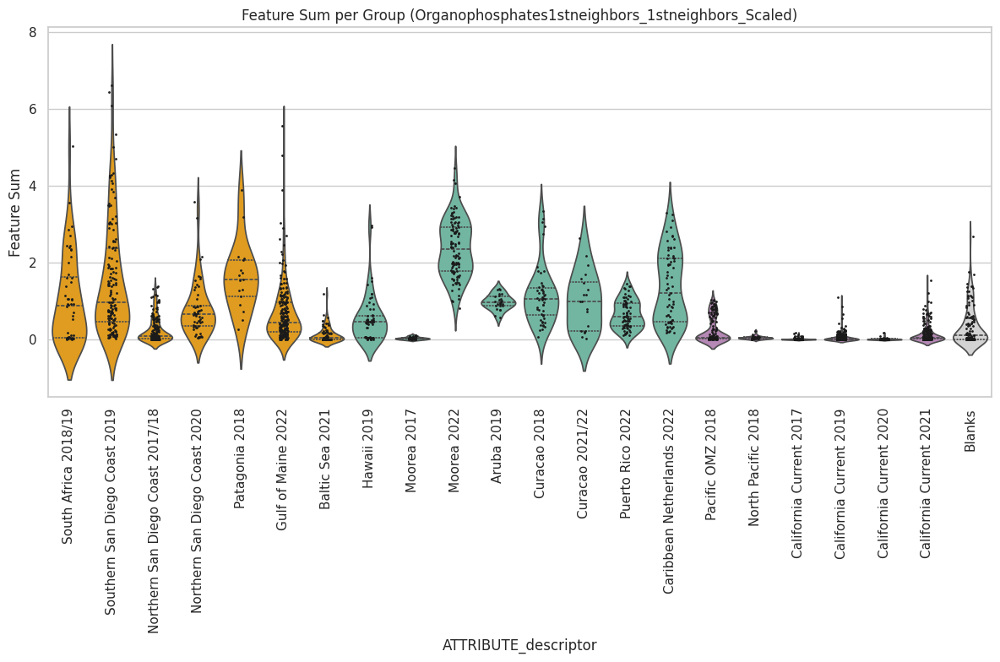

In [63]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('xenobiotics1stneighbors_withblanks(class)_scaled.csv', index_col='row ID')

# List of classes to iterate over
classes = ['glycol', 'phthalate', 'organophosphate']

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021', 'Blanks']

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonia 2018': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2021': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    'Blanks': 'lightgrey'
}

for class_name in classes:
    # Filter the DataFrame for the current class using str.contains
    df_class = df[df['Class'].str.contains(class_name, case=False, na=False)]

    # Filter columns containing ".mz"
    df_class = df_class.filter(regex=".mz")

    # Transpose the DataFrame so that sample names are the index
    df_class = df_class.transpose()

    # Sum all rows
    df_class['feature sum'] = df_class.sum(axis=1)

    # Merge with metadata according to descriptor
    df_merged = df_class.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

    # Sort the DataFrame based on the desired order
    df_merged['ATTRIBUTE_descriptor'] = pd.Categorical(df_merged['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
    df_merged = df_merged.sort_values('ATTRIBUTE_descriptor')

    # Plot violin plot
    plt.figure(figsize=(12, 8))
    sns.set_theme(style="whitegrid")
    ax = sns.violinplot(
        data=df_merged,
        x='ATTRIBUTE_descriptor',
        y='feature sum',
        inner='quartile',  # Show quartiles inside the violin
        palette=custom_palette,
        scale='width'  # Normalize the width of the violins
    )
    sns.stripplot(
        data=df_merged,
        x='ATTRIBUTE_descriptor',
        y='feature sum',
        color='k',
        size=2,  # Adjust size if needed
        jitter=True,  # Add jitter to prevent overlapping
        ax=ax
    )

    # Capitalize the first letter of the class name and add trailing "s" for plot title and file name
    class_name_capitalized = class_name.capitalize() + "s1stneighbors"

    plt.title(f'Feature Sum per Group ({class_name_capitalized}_1stneighbors_Scaled)')
    plt.xlabel('ATTRIBUTE_descriptor')
    plt.ylabel('Feature Sum')
    plt.xticks(rotation=90)
    plt.tight_layout()
    
    # Save the plot as SVG file
    plt.savefig(f'{class_name_capitalized}_1stneighbors_Scaled_violinplot.svg')
    
    # Show the plot
    plt.show()

# 10.SI retention time, m/z deviation and peak area plots (Supp.Fig. 3 to 5)

Datasets contributing to the plot: ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']


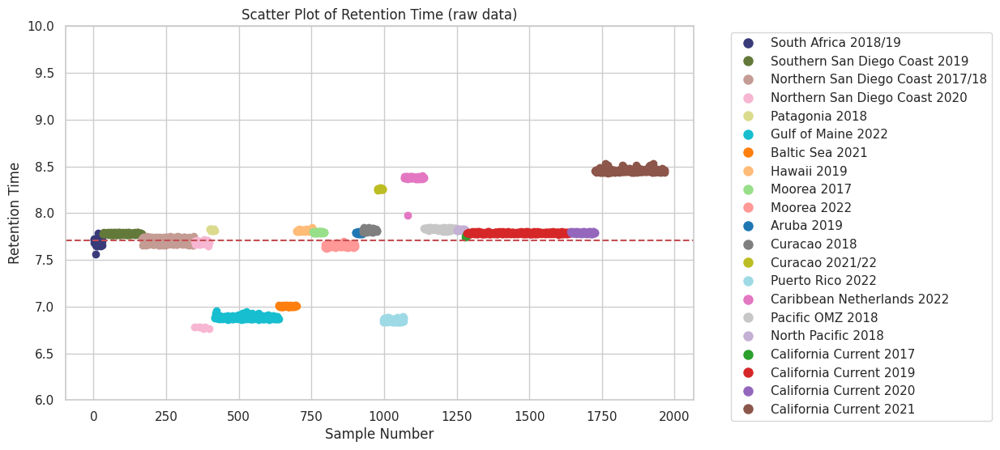

In [64]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
file_path = '20250122_OceanMeta7mergedAbsolutelyFINALqcstuff_1.1.csv'
data = pd.read_csv(file_path)

# Convert 'row ID' column to strings
data['row ID'] = data['row ID'].astype(str)

# Define the user-defined 'row ID' rows
user_defined_row_ids = ['57256']  # Example row IDs, replace with actual IDs

# Filter the data for the user-defined 'row ID' rows
filtered_data = data[data['row ID'].isin(user_defined_row_ids)]

# Extract the 'row retention time' and sample columns with 'Feature RT' in the header
retention_time = filtered_data['row retention time']
feature_rt_columns = [col for col in filtered_data.columns if 'Feature RT' in col]
feature_rt_data = filtered_data[feature_rt_columns]

# Load the metadata file
metadata_file_path = 'merged_metadata_AbsolutelyFinal_FBMN_20241110.txt'
metadata = pd.read_csv(metadata_file_path, sep='\t')

# Create a dictionary to map sample names to datasets
sample_to_dataset = dict(zip(metadata['filename'], metadata['ATTRIBUTE_descriptor']))

# Define colors for each dataset
dataset_colors = {
    'Aruba 2019': '#1f77b4',
    'Baltic Sea 2021': '#ff7f0e',
    'California Current 2017': '#2ca02c',
    'California Current 2019': '#d62728',
    'California Current 2020': '#9467bd',
    'California Current 2021': '#8c564b',
    'Caribbean Netherlands 2022': '#e377c2',
    'Curacao 2018': '#7f7f7f',
    'Curacao 2021/22': '#bcbd22',
    'Gulf of Maine 2022': '#17becf',
    'Hawaii 2019': '#ffbb78',
    'Moorea 2017': '#98df8a',
    'Moorea 2022': '#ff9896',
    'North Pacific 2018': '#c5b0d5',
    'Northern San Diego Coast 2017/18': '#c49c94',
    'Northern San Diego Coast 2020': '#f7b6d2',
    'Pacific OMZ 2018': '#c7c7c7',
    'Patagonia 2018': '#dbdb8d',
    'Puerto Rico 2022': '#9edae5',
    'South Africa 2018/19': '#393b79',
    'Southern San Diego Coast 2019': '#637939'
}

# Define the desired order of datasets
dataset_order = [
    'South Africa 2018/19', 
    'Southern San Diego Coast 2019', 
    'Northern San Diego Coast 2017/18', 
    'Northern San Diego Coast 2020', 
    'Patagonia 2018', 
    'Gulf of Maine 2022', 
    'Baltic Sea 2021', 
    'Hawaii 2019', 
    'Moorea 2017', 
    'Moorea 2022', 
    'Aruba 2019', 
    'Curacao 2018', 
    'Curacao 2021/22', 
    'Puerto Rico 2022', 
    'Caribbean Netherlands 2022', 
    'Pacific OMZ 2018', 
    'North Pacific 2018', 
    'California Current 2017', 
    'California Current 2019', 
    'California Current 2020', 
    'California Current 2021'
]

# Create a scatter plot
plt.figure(figsize=(10, 6))

# Plot row retention time excluding zeros
plt.scatter(range(1, len(retention_time[retention_time != 0]) + 1), retention_time[retention_time != 0], label='Row Retention Time')

# Plot Feature RT columns excluding zeros with colors according to dataset
sample_order = []
for col in feature_rt_columns:
    non_zero_data = feature_rt_data[col][feature_rt_data[col] != 0]
    sample_name = col.split(' ')[0]  # Extract sample name from column header
    dataset = sample_to_dataset.get(sample_name, 'Unknown')  # Get dataset from metadata
    
    if dataset != 'Blanks':
        sample_order.extend([(dataset, val) for val in non_zero_data])

# Sort samples by the specified order
sample_order.sort(key=lambda x: dataset_order.index(x[0]) if x[0] in dataset_order else len(dataset_order))

# Print the dataset names before plotting
unique_datasets_in_plot = sorted(set([x[0] for x in sample_order]), key=lambda x: dataset_order.index(x) if x in dataset_order else len(dataset_order))
print("Datasets contributing to the plot:", unique_datasets_in_plot)

# Plot sorted samples
for i, (dataset, val) in enumerate(sample_order):
    plt.scatter(i + 1, val, color=dataset_colors.get(dataset, '#000000'))  # Default to black if dataset not found

# Add a horizontal line for mean row retention time excluding zeros
plt.axhline(y=retention_time[retention_time != 0].mean(), color='r', linestyle='--', label='Mean Row Retention Time')

# Add labels and title
plt.xlabel('Sample Number')
plt.ylabel('Retention Time')
plt.title('Scatter Plot of Retention Time (raw data)')
plt.grid(True)

# Set the y-axis range
plt.ylim([6, 10])  # Replace min_value and max_value with your desired range

# Add legend to show unique ATTRIBUTE_descriptor values and assigned colors that contribute to the plot
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=dataset_colors[ds], markersize=10) for ds in unique_datasets_in_plot]
plt.legend(handles, unique_datasets_in_plot, bbox_to_anchor=(1.05, 1), loc='upper left')

# Save the plot as .svg file
plt.savefig('DEET_retentiondev.svg', format='svg', bbox_inches='tight')

# Show the plot
plt.show()

Datasets contributing to the plot: ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']


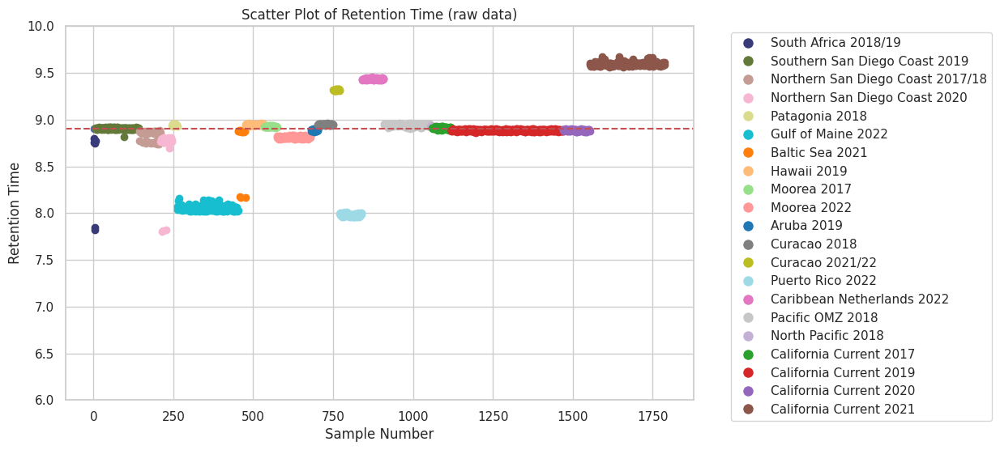

In [65]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
file_path = '20250122_OceanMeta7mergedAbsolutelyFINALqcstuff_1.1.csv'
data = pd.read_csv(file_path)

# Convert 'row ID' column to strings
data['row ID'] = data['row ID'].astype(str)

# Define the user-defined 'row ID' rows
user_defined_row_ids = ['81498']  # Example row IDs, replace with actual IDs

# Filter the data for the user-defined 'row ID' rows
filtered_data = data[data['row ID'].isin(user_defined_row_ids)]

# Extract the 'row retention time' and sample columns with 'Feature RT' in the header
retention_time = filtered_data['row retention time']
feature_rt_columns = [col for col in filtered_data.columns if 'Feature RT' in col]
feature_rt_data = filtered_data[feature_rt_columns]

# Load the metadata file
metadata_file_path = 'merged_metadata_AbsolutelyFinal_FBMN_20241110.txt'
metadata = pd.read_csv(metadata_file_path, sep='\t')

# Create a dictionary to map sample names to datasets
sample_to_dataset = dict(zip(metadata['filename'], metadata['ATTRIBUTE_descriptor']))

# Define colors for each dataset
dataset_colors = {
    'Aruba 2019': '#1f77b4',
    'Baltic Sea 2021': '#ff7f0e',
    'California Current 2017': '#2ca02c',
    'California Current 2019': '#d62728',
    'California Current 2020': '#9467bd',
    'California Current 2021': '#8c564b',
    'Caribbean Netherlands 2022': '#e377c2',
    'Curacao 2018': '#7f7f7f',
    'Curacao 2021/22': '#bcbd22',
    'Gulf of Maine 2022': '#17becf',
    'Hawaii 2019': '#ffbb78',
    'Moorea 2017': '#98df8a',
    'Moorea 2022': '#ff9896',
    'North Pacific 2018': '#c5b0d5',
    'Northern San Diego Coast 2017/18': '#c49c94',
    'Northern San Diego Coast 2020': '#f7b6d2',
    'Pacific OMZ 2018': '#c7c7c7',
    'Patagonia 2018': '#dbdb8d',
    'Puerto Rico 2022': '#9edae5',
    'South Africa 2018/19': '#393b79',
    'Southern San Diego Coast 2019': '#637939'
}

# Define the desired order of datasets
dataset_order = [
    'South Africa 2018/19', 
    'Southern San Diego Coast 2019', 
    'Northern San Diego Coast 2017/18', 
    'Northern San Diego Coast 2020', 
    'Patagonia 2018', 
    'Gulf of Maine 2022', 
    'Baltic Sea 2021', 
    'Hawaii 2019', 
    'Moorea 2017', 
    'Moorea 2022', 
    'Aruba 2019', 
    'Curacao 2018', 
    'Curacao 2021/22', 
    'Puerto Rico 2022', 
    'Caribbean Netherlands 2022', 
    'Pacific OMZ 2018', 
    'North Pacific 2018', 
    'California Current 2017', 
    'California Current 2019', 
    'California Current 2020', 
    'California Current 2021'
]

# Create a scatter plot
plt.figure(figsize=(10, 6))

# Plot row retention time excluding zeros
plt.scatter(range(1, len(retention_time[retention_time != 0]) + 1), retention_time[retention_time != 0], label='Row Retention Time')

# Plot Feature RT columns excluding zeros with colors according to dataset
sample_order = []
for col in feature_rt_columns:
    non_zero_data = feature_rt_data[col][feature_rt_data[col] != 0]
    sample_name = col.split(' ')[0]  # Extract sample name from column header
    dataset = sample_to_dataset.get(sample_name, 'Unknown')  # Get dataset from metadata
    
    if dataset != 'Blanks':
        sample_order.extend([(dataset, val) for val in non_zero_data])

# Sort samples by the specified order
sample_order.sort(key=lambda x: dataset_order.index(x[0]) if x[0] in dataset_order else len(dataset_order))

# Print the dataset names before plotting
unique_datasets_in_plot = sorted(set([x[0] for x in sample_order]), key=lambda x: dataset_order.index(x) if x in dataset_order else len(dataset_order))
print("Datasets contributing to the plot:", unique_datasets_in_plot)

# Plot sorted samples
for i, (dataset, val) in enumerate(sample_order):
    plt.scatter(i + 1, val, color=dataset_colors.get(dataset, '#000000'))  # Default to black if dataset not found

# Add a horizontal line for mean row retention time excluding zeros
plt.axhline(y=retention_time[retention_time != 0].mean(), color='r', linestyle='--', label='Mean Row Retention Time')

# Add labels and title
plt.xlabel('Sample Number')
plt.ylabel('Retention Time')
plt.title('Scatter Plot of Retention Time (raw data)')
plt.grid(True)

# Set the y-axis range
plt.ylim([6, 10])  # Replace min_value and max_value with your desired range

# Add legend to show unique ATTRIBUTE_descriptor values and assigned colors that contribute to the plot
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=dataset_colors[ds], markersize=10) for ds in unique_datasets_in_plot]
plt.legend(handles, unique_datasets_in_plot, bbox_to_anchor=(1.05, 1), loc='upper left')

# Save the plot as .svg file
plt.savefig('diethylphthalate_retentiondev.svg', format='svg', bbox_inches='tight')

# Show the plot
plt.show()

Datasets contributing to the plot: ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']


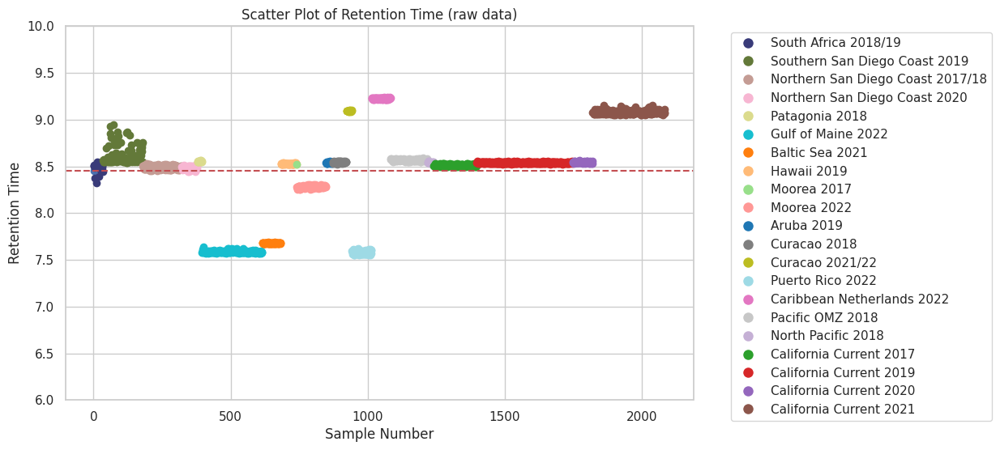

In [66]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
file_path = '20250122_OceanMeta7mergedAbsolutelyFINALqcstuff_1.1.csv'
data = pd.read_csv(file_path)

# Convert 'row ID' column to strings
data['row ID'] = data['row ID'].astype(str)

# Define the user-defined 'row ID' rows
user_defined_row_ids = ['65864']  # Example row IDs, replace with actual IDs

# Filter the data for the user-defined 'row ID' rows
filtered_data = data[data['row ID'].isin(user_defined_row_ids)]

# Extract the 'row retention time' and sample columns with 'Feature RT' in the header
retention_time = filtered_data['row retention time']
feature_rt_columns = [col for col in filtered_data.columns if 'Feature RT' in col]
feature_rt_data = filtered_data[feature_rt_columns]

# Load the metadata file
metadata_file_path = 'merged_metadata_AbsolutelyFinal_FBMN_20241110.txt'
metadata = pd.read_csv(metadata_file_path, sep='\t')

# Create a dictionary to map sample names to datasets
sample_to_dataset = dict(zip(metadata['filename'], metadata['ATTRIBUTE_descriptor']))

# Define colors for each dataset
dataset_colors = {
    'Aruba 2019': '#1f77b4',
    'Baltic Sea 2021': '#ff7f0e',
    'California Current 2017': '#2ca02c',
    'California Current 2019': '#d62728',
    'California Current 2020': '#9467bd',
    'California Current 2021': '#8c564b',
    'Caribbean Netherlands 2022': '#e377c2',
    'Curacao 2018': '#7f7f7f',
    'Curacao 2021/22': '#bcbd22',
    'Gulf of Maine 2022': '#17becf',
    'Hawaii 2019': '#ffbb78',
    'Moorea 2017': '#98df8a',
    'Moorea 2022': '#ff9896',
    'North Pacific 2018': '#c5b0d5',
    'Northern San Diego Coast 2017/18': '#c49c94',
    'Northern San Diego Coast 2020': '#f7b6d2',
    'Pacific OMZ 2018': '#c7c7c7',
    'Patagonia 2018': '#dbdb8d',
    'Puerto Rico 2022': '#9edae5',
    'South Africa 2018/19': '#393b79',
    'Southern San Diego Coast 2019': '#637939'
}

# Define the desired order of datasets
dataset_order = [
    'South Africa 2018/19', 
    'Southern San Diego Coast 2019', 
    'Northern San Diego Coast 2017/18', 
    'Northern San Diego Coast 2020', 
    'Patagonia 2018', 
    'Gulf of Maine 2022', 
    'Baltic Sea 2021', 
    'Hawaii 2019', 
    'Moorea 2017', 
    'Moorea 2022', 
    'Aruba 2019', 
    'Curacao 2018', 
    'Curacao 2021/22', 
    'Puerto Rico 2022', 
    'Caribbean Netherlands 2022', 
    'Pacific OMZ 2018', 
    'North Pacific 2018', 
    'California Current 2017', 
    'California Current 2019', 
    'California Current 2020', 
    'California Current 2021'
]

# Create a scatter plot
plt.figure(figsize=(10, 6))

# Plot row retention time excluding zeros
plt.scatter(range(1, len(retention_time[retention_time != 0]) + 1), retention_time[retention_time != 0], label='Row Retention Time')

# Plot Feature RT columns excluding zeros with colors according to dataset
sample_order = []
for col in feature_rt_columns:
    non_zero_data = feature_rt_data[col][feature_rt_data[col] != 0]
    sample_name = col.split(' ')[0]  # Extract sample name from column header
    dataset = sample_to_dataset.get(sample_name, 'Unknown')  # Get dataset from metadata
    
    if dataset != 'Blanks':
        sample_order.extend([(dataset, val) for val in non_zero_data])

# Sort samples by the specified order
sample_order.sort(key=lambda x: dataset_order.index(x[0]) if x[0] in dataset_order else len(dataset_order))

# Print the dataset names before plotting
unique_datasets_in_plot = sorted(set([x[0] for x in sample_order]), key=lambda x: dataset_order.index(x) if x in dataset_order else len(dataset_order))
print("Datasets contributing to the plot:", unique_datasets_in_plot)

# Plot sorted samples
for i, (dataset, val) in enumerate(sample_order):
    plt.scatter(i + 1, val, color=dataset_colors.get(dataset, '#000000'))  # Default to black if dataset not found

# Add a horizontal line for mean row retention time excluding zeros
plt.axhline(y=retention_time[retention_time != 0].mean(), color='r', linestyle='--', label='Mean Row Retention Time')

# Add labels and title
plt.xlabel('Sample Number')
plt.ylabel('Retention Time')
plt.title('Scatter Plot of Retention Time (raw data)')
plt.grid(True)

# Set the y-axis range
plt.ylim([6, 10])  # Replace min_value and max_value with your desired range

# Add legend to show unique ATTRIBUTE_descriptor values and assigned colors that contribute to the plot
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=dataset_colors[ds], markersize=10) for ds in unique_datasets_in_plot]
plt.legend(handles, unique_datasets_in_plot, bbox_to_anchor=(1.05, 1), loc='upper left')

# Save the plot as .svg file
plt.savefig('cocamidopropylbetaine_retentiondev.svg', format='svg', bbox_inches='tight')

# Show the plot
plt.show()

Datasets contributing to the plot: ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']


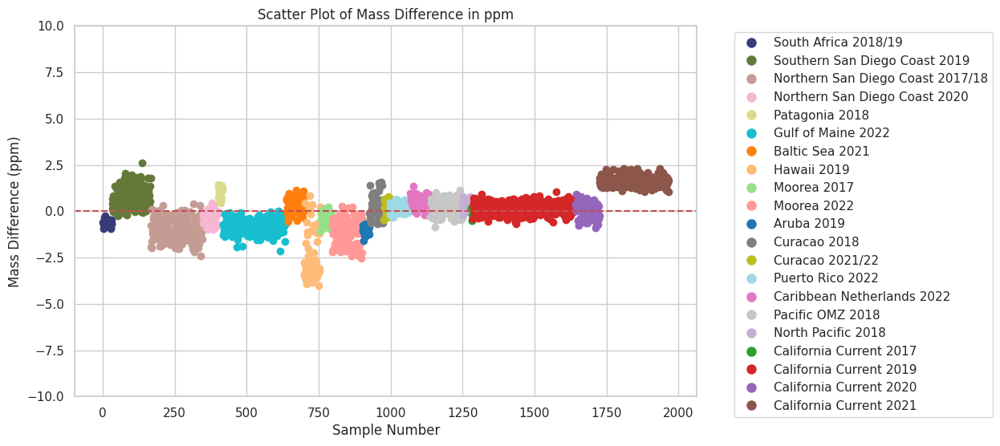

In [67]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
file_path = '20250122_OceanMeta7mergedAbsolutelyFINALqcstuff_1.1.csv'
data = pd.read_csv(file_path)

# Convert 'row ID' column to strings
data['row ID'] = data['row ID'].astype(str)

# Define the user-defined 'row ID' rows
user_defined_row_ids = ['57256']  # Example row IDs, replace with actual IDs

# Filter the data for the user-defined 'row ID' rows
filtered_data = data[data['row ID'].isin(user_defined_row_ids)]

# Extract the 'row m/z' and sample columns with 'Feature m/z' in the header
masstocharge = filtered_data['row m/z'].astype(float)
feature_mz_columns = [col for col in filtered_data.columns if 'Feature m/z' in col]
feature_mz_data = filtered_data[feature_mz_columns].astype(float)

# Calculate the reference m/z value (mean of row m/z excluding zeros)
reference_mz = masstocharge[masstocharge != 0].mean()

# Function to calculate ppm deviation
def calculate_ppm_deviation(mz_value, reference_mz):
    return (mz_value - reference_mz) / reference_mz * 1e6

# Load the metadata file
metadata_file_path = 'merged_metadata_AbsolutelyFinal_FBMN_20241110.txt'
metadata = pd.read_csv(metadata_file_path, sep='\t')

# Create a dictionary to map sample names to datasets
sample_to_dataset = dict(zip(metadata['filename'], metadata['ATTRIBUTE_descriptor']))

# Define colors for each dataset
dataset_colors = {
    'Aruba 2019': '#1f77b4',
    'Baltic Sea 2021': '#ff7f0e',
    'California Current 2017': '#2ca02c',
    'California Current 2019': '#d62728',
    'California Current 2020': '#9467bd',
    'California Current 2021': '#8c564b',
    'Caribbean Netherlands 2022': '#e377c2',
    'Curacao 2018': '#7f7f7f',
    'Curacao 2021/22': '#bcbd22',
    'Gulf of Maine 2022': '#17becf',
    'Hawaii 2019': '#ffbb78',
    'Moorea 2017': '#98df8a',
    'Moorea 2022': '#ff9896',
    'North Pacific 2018': '#c5b0d5',
    'Northern San Diego Coast 2017/18': '#c49c94',
    'Northern San Diego Coast 2020': '#f7b6d2',
    'Pacific OMZ 2018': '#c7c7c7',
    'Patagonia 2018': '#dbdb8d',
    'Puerto Rico 2022': '#9edae5',
    'South Africa 2018/19': '#393b79',
    'Southern San Diego Coast 2019': '#637939'
}

# Define the desired order of datasets
dataset_order = [
    'South Africa 2018/19', 
    'Southern San Diego Coast 2019', 
    'Northern San Diego Coast 2017/18', 
    'Northern San Diego Coast 2020', 
    'Patagonia 2018', 
    'Gulf of Maine 2022', 
    'Baltic Sea 2021', 
    'Hawaii 2019', 
    'Moorea 2017', 
    'Moorea 2022', 
    'Aruba 2019', 
    'Curacao 2018', 
    'Curacao 2021/22', 
    'Puerto Rico 2022', 
    'Caribbean Netherlands 2022', 
    'Pacific OMZ 2018', 
    'North Pacific 2018', 
    'California Current 2017', 
    'California Current 2019', 
    'California Current 2020', 
    'California Current 2021'
]

# Create a scatter plot
plt.figure(figsize=(10, 6))

# Plot Feature m/z columns excluding zeros with ppm deviation and colors according to dataset
sample_order = []
for col in feature_mz_columns:
    non_zero_data = feature_mz_data[col][feature_mz_data[col] != 0]
    sample_name = col.split(' ')[0]  # Extract sample name from column header
    dataset = sample_to_dataset.get(sample_name, 'Unknown')  # Get dataset from metadata
    
    ppm_deviation = calculate_ppm_deviation(non_zero_data, reference_mz)
    
    if dataset != 'Blanks':
        sample_order.extend([(dataset, val) for val in ppm_deviation])

# Sort samples by the specified order
sample_order.sort(key=lambda x: dataset_order.index(x[0]) if x[0] in dataset_order else len(dataset_order))

# Print the dataset names before plotting
unique_datasets_in_plot = sorted(set([x[0] for x in sample_order]), key=lambda x: dataset_order.index(x) if x in dataset_order else len(dataset_order))
print("Datasets contributing to the plot:", unique_datasets_in_plot)

# Plot sorted samples
for i, (dataset, val) in enumerate(sample_order):
    plt.scatter(i + 1, val, color=dataset_colors.get(dataset, '#000000'))  # Default to black if dataset not found

# Add a horizontal line for zero ppm deviation (reference line)
plt.axhline(y=0, color='r', linestyle='--', label='Reference Row m/z')

# Add labels and title
plt.xlabel('Sample Number')
plt.ylabel('Mass Difference (ppm)')
plt.title('Scatter Plot of Mass Difference in ppm')
plt.grid(True)

# Set the y-axis limit to -10 ppm and +10 ppm
plt.ylim([-10, 10])

# Add legend to show unique ATTRIBUTE_descriptor values and assigned colors that contribute to the plot
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=dataset_colors[ds], markersize=10) for ds in unique_datasets_in_plot]
plt.legend(handles, unique_datasets_in_plot, bbox_to_anchor=(1.05, 1), loc='upper left')

# Save the plot as .svg file
plt.savefig('DEET_masstochargedev.svg', format='svg', bbox_inches='tight')

# Show the plot
plt.show()

Datasets contributing to the plot: ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']


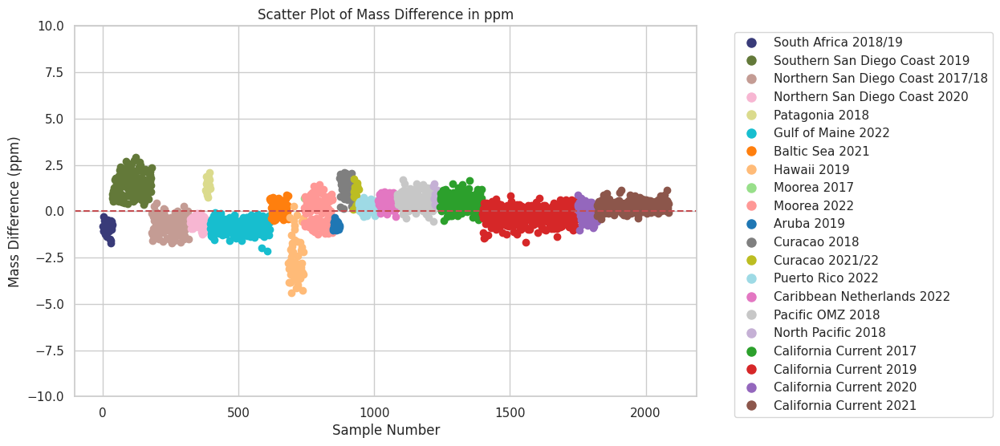

In [68]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
file_path = '20250122_OceanMeta7mergedAbsolutelyFINALqcstuff_1.1.csv'
data = pd.read_csv(file_path)

# Convert 'row ID' column to strings
data['row ID'] = data['row ID'].astype(str)

# Define the user-defined 'row ID' rows
user_defined_row_ids = ['65864']  # Example row IDs, replace with actual IDs

# Filter the data for the user-defined 'row ID' rows
filtered_data = data[data['row ID'].isin(user_defined_row_ids)]

# Extract the 'row m/z' and sample columns with 'Feature m/z' in the header
masstocharge = filtered_data['row m/z'].astype(float)
feature_mz_columns = [col for col in filtered_data.columns if 'Feature m/z' in col]
feature_mz_data = filtered_data[feature_mz_columns].astype(float)

# Calculate the reference m/z value (mean of row m/z excluding zeros)
reference_mz = masstocharge[masstocharge != 0].mean()

# Function to calculate ppm deviation
def calculate_ppm_deviation(mz_value, reference_mz):
    return (mz_value - reference_mz) / reference_mz * 1e6

# Load the metadata file
metadata_file_path = 'merged_metadata_AbsolutelyFinal_FBMN_20241110.txt'
metadata = pd.read_csv(metadata_file_path, sep='\t')

# Create a dictionary to map sample names to datasets
sample_to_dataset = dict(zip(metadata['filename'], metadata['ATTRIBUTE_descriptor']))

# Define colors for each dataset
dataset_colors = {
    'Aruba 2019': '#1f77b4',
    'Baltic Sea 2021': '#ff7f0e',
    'California Current 2017': '#2ca02c',
    'California Current 2019': '#d62728',
    'California Current 2020': '#9467bd',
    'California Current 2021': '#8c564b',
    'Caribbean Netherlands 2022': '#e377c2',
    'Curacao 2018': '#7f7f7f',
    'Curacao 2021/22': '#bcbd22',
    'Gulf of Maine 2022': '#17becf',
    'Hawaii 2019': '#ffbb78',
    'Moorea 2017': '#98df8a',
    'Moorea 2022': '#ff9896',
    'North Pacific 2018': '#c5b0d5',
    'Northern San Diego Coast 2017/18': '#c49c94',
    'Northern San Diego Coast 2020': '#f7b6d2',
    'Pacific OMZ 2018': '#c7c7c7',
    'Patagonia 2018': '#dbdb8d',
    'Puerto Rico 2022': '#9edae5',
    'South Africa 2018/19': '#393b79',
    'Southern San Diego Coast 2019': '#637939'
}

# Define the desired order of datasets
dataset_order = [
    'South Africa 2018/19', 
    'Southern San Diego Coast 2019', 
    'Northern San Diego Coast 2017/18', 
    'Northern San Diego Coast 2020', 
    'Patagonia 2018', 
    'Gulf of Maine 2022', 
    'Baltic Sea 2021', 
    'Hawaii 2019', 
    'Moorea 2017', 
    'Moorea 2022', 
    'Aruba 2019', 
    'Curacao 2018', 
    'Curacao 2021/22', 
    'Puerto Rico 2022', 
    'Caribbean Netherlands 2022', 
    'Pacific OMZ 2018', 
    'North Pacific 2018', 
    'California Current 2017', 
    'California Current 2019', 
    'California Current 2020', 
    'California Current 2021'
]

# Create a scatter plot
plt.figure(figsize=(10, 6))

# Plot Feature m/z columns excluding zeros with ppm deviation and colors according to dataset
sample_order = []
for col in feature_mz_columns:
    non_zero_data = feature_mz_data[col][feature_mz_data[col] != 0]
    sample_name = col.split(' ')[0]  # Extract sample name from column header
    dataset = sample_to_dataset.get(sample_name, 'Unknown')  # Get dataset from metadata
    
    ppm_deviation = calculate_ppm_deviation(non_zero_data, reference_mz)
    
    if dataset != 'Blanks':
        sample_order.extend([(dataset, val) for val in ppm_deviation])

# Sort samples by the specified order
sample_order.sort(key=lambda x: dataset_order.index(x[0]) if x[0] in dataset_order else len(dataset_order))

# Print the dataset names before plotting
unique_datasets_in_plot = sorted(set([x[0] for x in sample_order]), key=lambda x: dataset_order.index(x) if x in dataset_order else len(dataset_order))
print("Datasets contributing to the plot:", unique_datasets_in_plot)

# Plot sorted samples
for i, (dataset, val) in enumerate(sample_order):
    plt.scatter(i + 1, val, color=dataset_colors.get(dataset, '#000000'))  # Default to black if dataset not found

# Add a horizontal line for zero ppm deviation (reference line)
plt.axhline(y=0, color='r', linestyle='--', label='Reference Row m/z')

# Add labels and title
plt.xlabel('Sample Number')
plt.ylabel('Mass Difference (ppm)')
plt.title('Scatter Plot of Mass Difference in ppm')
plt.grid(True)

# Set the y-axis limit to -10 ppm and +10 ppm
plt.ylim([-10, 10])

# Add legend to show unique ATTRIBUTE_descriptor values and assigned colors that contribute to the plot
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=dataset_colors[ds], markersize=10) for ds in unique_datasets_in_plot]
plt.legend(handles, unique_datasets_in_plot, bbox_to_anchor=(1.05, 1), loc='upper left')

# Save the plot as .svg file
plt.savefig('cocamidopropylbetaine_masstochargedev.svg', format='svg', bbox_inches='tight')

# Show the plot
plt.show()

Datasets contributing to the plot: ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']


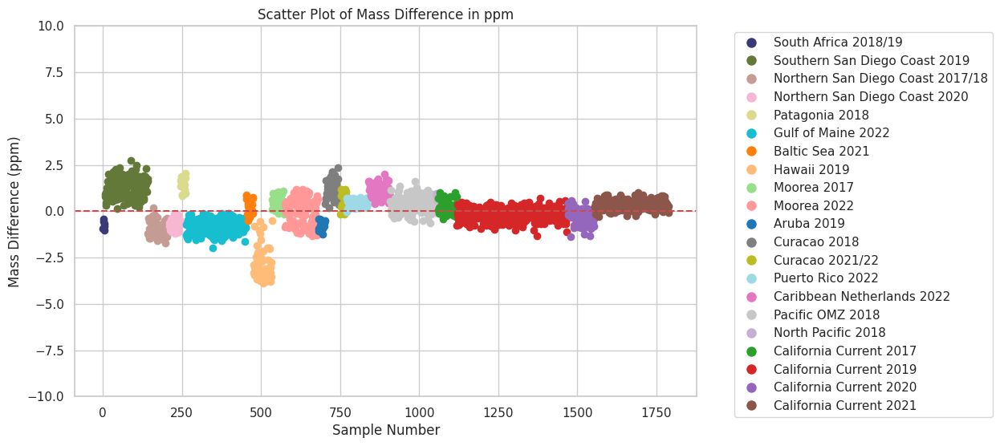

In [69]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
file_path = '20250122_OceanMeta7mergedAbsolutelyFINALqcstuff_1.1.csv'
data = pd.read_csv(file_path)

# Convert 'row ID' column to strings
data['row ID'] = data['row ID'].astype(str)

# Define the user-defined 'row ID' rows
user_defined_row_ids = ['81498']  # Example row IDs, replace with actual IDs

# Filter the data for the user-defined 'row ID' rows
filtered_data = data[data['row ID'].isin(user_defined_row_ids)]

# Extract the 'row m/z' and sample columns with 'Feature m/z' in the header
masstocharge = filtered_data['row m/z'].astype(float)
feature_mz_columns = [col for col in filtered_data.columns if 'Feature m/z' in col]
feature_mz_data = filtered_data[feature_mz_columns].astype(float)

# Calculate the reference m/z value (mean of row m/z excluding zeros)
reference_mz = masstocharge[masstocharge != 0].mean()

# Function to calculate ppm deviation
def calculate_ppm_deviation(mz_value, reference_mz):
    return (mz_value - reference_mz) / reference_mz * 1e6

# Load the metadata file
metadata_file_path = 'merged_metadata_AbsolutelyFinal_FBMN_20241110.txt'
metadata = pd.read_csv(metadata_file_path, sep='\t')

# Create a dictionary to map sample names to datasets
sample_to_dataset = dict(zip(metadata['filename'], metadata['ATTRIBUTE_descriptor']))

# Define colors for each dataset
dataset_colors = {
    'Aruba 2019': '#1f77b4',
    'Baltic Sea 2021': '#ff7f0e',
    'California Current 2017': '#2ca02c',
    'California Current 2019': '#d62728',
    'California Current 2020': '#9467bd',
    'California Current 2021': '#8c564b',
    'Caribbean Netherlands 2022': '#e377c2',
    'Curacao 2018': '#7f7f7f',
    'Curacao 2021/22': '#bcbd22',
    'Gulf of Maine 2022': '#17becf',
    'Hawaii 2019': '#ffbb78',
    'Moorea 2017': '#98df8a',
    'Moorea 2022': '#ff9896',
    'North Pacific 2018': '#c5b0d5',
    'Northern San Diego Coast 2017/18': '#c49c94',
    'Northern San Diego Coast 2020': '#f7b6d2',
    'Pacific OMZ 2018': '#c7c7c7',
    'Patagonia 2018': '#dbdb8d',
    'Puerto Rico 2022': '#9edae5',
    'South Africa 2018/19': '#393b79',
    'Southern San Diego Coast 2019': '#637939'
}

# Define the desired order of datasets
dataset_order = [
    'South Africa 2018/19', 
    'Southern San Diego Coast 2019', 
    'Northern San Diego Coast 2017/18', 
    'Northern San Diego Coast 2020', 
    'Patagonia 2018', 
    'Gulf of Maine 2022', 
    'Baltic Sea 2021', 
    'Hawaii 2019', 
    'Moorea 2017', 
    'Moorea 2022', 
    'Aruba 2019', 
    'Curacao 2018', 
    'Curacao 2021/22', 
    'Puerto Rico 2022', 
    'Caribbean Netherlands 2022', 
    'Pacific OMZ 2018', 
    'North Pacific 2018', 
    'California Current 2017', 
    'California Current 2019', 
    'California Current 2020', 
    'California Current 2021'
]

# Create a scatter plot
plt.figure(figsize=(10, 6))

# Plot Feature m/z columns excluding zeros with ppm deviation and colors according to dataset
sample_order = []
for col in feature_mz_columns:
    non_zero_data = feature_mz_data[col][feature_mz_data[col] != 0]
    sample_name = col.split(' ')[0]  # Extract sample name from column header
    dataset = sample_to_dataset.get(sample_name, 'Unknown')  # Get dataset from metadata
    
    ppm_deviation = calculate_ppm_deviation(non_zero_data, reference_mz)
    
    if dataset != 'Blanks':
        sample_order.extend([(dataset, val) for val in ppm_deviation])

# Sort samples by the specified order
sample_order.sort(key=lambda x: dataset_order.index(x[0]) if x[0] in dataset_order else len(dataset_order))

# Print the dataset names before plotting
unique_datasets_in_plot = sorted(set([x[0] for x in sample_order]), key=lambda x: dataset_order.index(x) if x in dataset_order else len(dataset_order))
print("Datasets contributing to the plot:", unique_datasets_in_plot)

# Plot sorted samples
for i, (dataset, val) in enumerate(sample_order):
    plt.scatter(i + 1, val, color=dataset_colors.get(dataset, '#000000'))  # Default to black if dataset not found

# Add a horizontal line for zero ppm deviation (reference line)
plt.axhline(y=0, color='r', linestyle='--', label='Reference Row m/z')

# Add labels and title
plt.xlabel('Sample Number')
plt.ylabel('Mass Difference (ppm)')
plt.title('Scatter Plot of Mass Difference in ppm')
plt.grid(True)

# Set the y-axis limit to -10 ppm and +10 ppm
plt.ylim([-10, 10])

# Add legend to show unique ATTRIBUTE_descriptor values and assigned colors that contribute to the plot
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=dataset_colors[ds], markersize=10) for ds in unique_datasets_in_plot]
plt.legend(handles, unique_datasets_in_plot, bbox_to_anchor=(1.05, 1), loc='upper left')

# Save the plot as .svg file
plt.savefig('diethylphthalate_masstochargedev.svg', format='svg', bbox_inches='tight')

# Show the plot
plt.show()

Datasets contributing to the plot: ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']


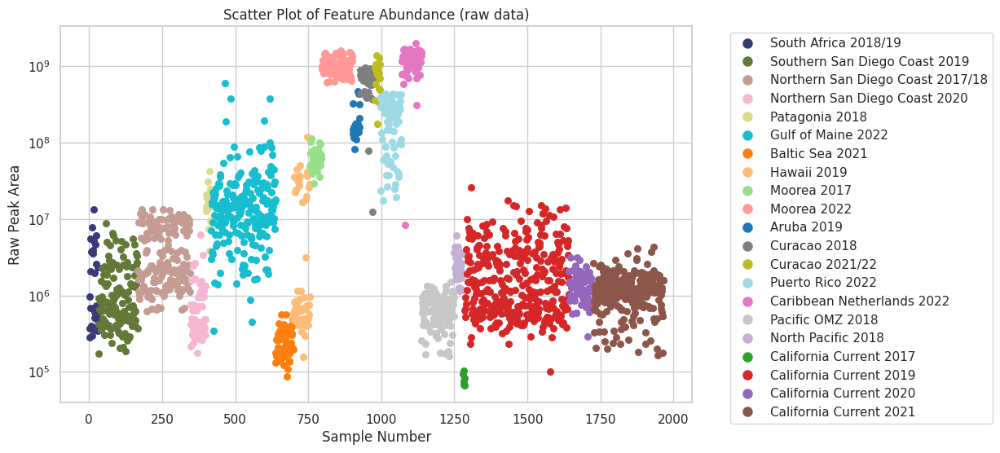

In [70]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the CSV file with feature abundance values
file_path = 'featuretable_reformated.csv'
abundance_data = pd.read_csv(file_path)

# Convert 'row ID' column to strings
abundance_data['row ID'] = abundance_data['row ID'].astype(str)

# Define the user-defined 'row ID' rows (example row IDs, replace with actual IDs if needed)
user_defined_row_ids = ['57256']  # Example row IDs, replace with actual IDs

# Filter the data for the user-defined 'row ID' rows
filtered_abundance_data = abundance_data[abundance_data['row ID'].isin(user_defined_row_ids)]

# Extract the 'row ID' and sample columns with '.mz' in the header
feature_ids = filtered_abundance_data['row ID']
sample_columns = [col for col in filtered_abundance_data.columns if '.mz' in col]
sample_abundance_data = filtered_abundance_data[sample_columns]

# Load the metadata file
metadata_file_path = 'merged_metadata_AbsolutelyFinal_FBMN_20241110.txt'
metadata = pd.read_csv(metadata_file_path, sep='\t')

# Create a dictionary to map sample names to datasets
sample_to_dataset = dict(zip(metadata['filename'], metadata['ATTRIBUTE_descriptor']))

# Define colors for each dataset
dataset_colors = {
    'Aruba 2019': '#1f77b4',
    'Baltic Sea 2021': '#ff7f0e',
    'California Current 2017': '#2ca02c',
    'California Current 2019': '#d62728',
    'California Current 2020': '#9467bd',
    'California Current 2021': '#8c564b',
    'Caribbean Netherlands 2022': '#e377c2',
    'Curacao 2018': '#7f7f7f',
    'Curacao 2021/22': '#bcbd22',
    'Gulf of Maine 2022': '#17becf',
    'Hawaii 2019': '#ffbb78',
    'Moorea 2017': '#98df8a',
    'Moorea 2022': '#ff9896',
    'North Pacific 2018': '#c5b0d5',
    'Northern San Diego Coast 2017/18': '#c49c94',
    'Northern San Diego Coast 2020': '#f7b6d2',
    'Pacific OMZ 2018': '#c7c7c7',
    'Patagonia 2018': '#dbdb8d',
    'Puerto Rico 2022': '#9edae5',
    'South Africa 2018/19': '#393b79',
    'Southern San Diego Coast 2019': '#637939'
}

# Define the desired order of datasets
dataset_order = ['South Africa 2018/19', 
                 'Southern San Diego Coast 2019', 
                 'Northern San Diego Coast 2017/18', 
                 'Northern San Diego Coast 2020', 
                 'Patagonia 2018', 
                 'Gulf of Maine 2022', 
                 'Baltic Sea 2021', 
                 'Hawaii 2019', 
                 'Moorea 2017', 
                 'Moorea 2022', 
                 'Aruba 2019', 
                 'Curacao 2018', 
                 'Curacao 2021/22', 
                 'Puerto Rico 2022', 
                 'Caribbean Netherlands 2022', 
                 'Pacific OMZ 2018', 
                 'North Pacific 2018', 
                 'California Current 2017', 
                 'California Current 2019', 
                 'California Current 2020', 
                 'California Current 2021']

# Remove zero abundances from the data
sample_abundance_data = sample_abundance_data[sample_abundance_data > 0]

# Create a scatter plot
plt.figure(figsize=(10, 6))

# Plot Feature Abundance columns with colors according to dataset and using dots for all markers
sample_order = []
for col in sample_columns:
    non_zero_data = sample_abundance_data[col].dropna()
    sample_name = col.split(' ')[0]  # Extract sample name from column header
    dataset = sample_to_dataset.get(sample_name, 'Unknown')  # Get dataset from metadata
    
    if dataset != 'Blanks':
        sample_order.extend([(dataset, val) for val in non_zero_data])

# Sort samples by dataset according to the desired order
sample_order.sort(key=lambda x: dataset_order.index(x[0]) if x[0] in dataset_order else len(dataset_order))

# Print the dataset names before plotting
unique_datasets_in_plot = sorted(set([x[0] for x in sample_order]), key=lambda x: dataset_order.index(x) if x in dataset_order else len(dataset_order))
print("Datasets contributing to the plot:", unique_datasets_in_plot)

# Plot sorted samples with dots for all markers and reduced marker size
for i, (dataset, val) in enumerate(sample_order):
    plt.scatter(i + 1, val, color=dataset_colors.get(dataset, '#000000'), marker='o', s=30)  # Default to black dot if dataset not found

# Add labels and title
plt.xlabel('Sample Number')
plt.ylabel('Raw Peak Area')
plt.yscale('log')
plt.title('Scatter Plot of Feature Abundance (raw data)')
plt.grid(True)

# Add legend to show unique ATTRIBUTE_descriptor values and assigned colors that contribute to the plot
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=dataset_colors[ds], markersize=10, linestyle='None') for ds in unique_datasets_in_plot]
plt.legend(handles, unique_datasets_in_plot, bbox_to_anchor=(1.05, 1), loc='upper left')

# Save the plot as .svg file
plt.savefig('DEET_Feature_Abundance_Plot.svg', format='svg', bbox_inches='tight')

# Show the plot
plt.show()

Datasets contributing to the plot: ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']


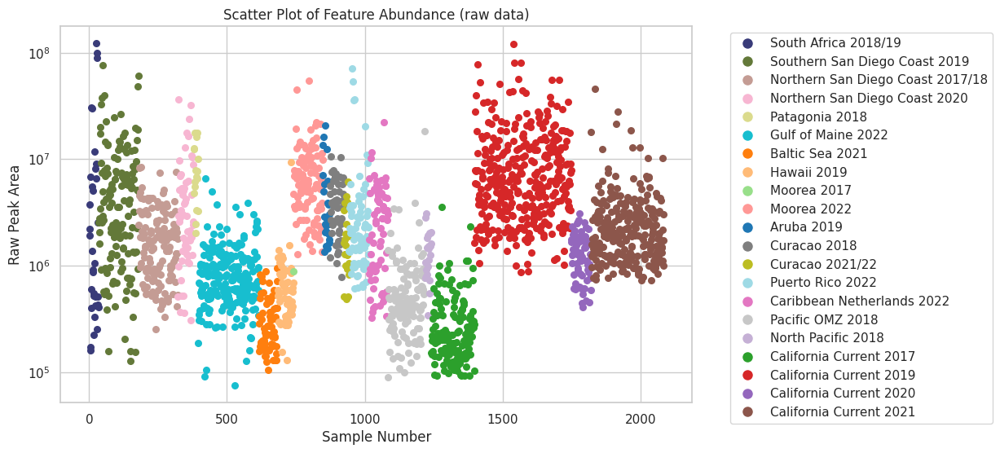

In [71]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the CSV file with feature abundance values
file_path = 'featuretable_reformated.csv'
abundance_data = pd.read_csv(file_path)

# Convert 'row ID' column to strings
abundance_data['row ID'] = abundance_data['row ID'].astype(str)

# Define the user-defined 'row ID' rows (example row IDs, replace with actual IDs if needed)
user_defined_row_ids = ['65864']  # Example row IDs, replace with actual IDs

# Filter the data for the user-defined 'row ID' rows
filtered_abundance_data = abundance_data[abundance_data['row ID'].isin(user_defined_row_ids)]

# Extract the 'row ID' and sample columns with '.mz' in the header
feature_ids = filtered_abundance_data['row ID']
sample_columns = [col for col in filtered_abundance_data.columns if '.mz' in col]
sample_abundance_data = filtered_abundance_data[sample_columns]

# Load the metadata file
metadata_file_path = 'merged_metadata_AbsolutelyFinal_FBMN_20241110.txt'
metadata = pd.read_csv(metadata_file_path, sep='\t')

# Create a dictionary to map sample names to datasets
sample_to_dataset = dict(zip(metadata['filename'], metadata['ATTRIBUTE_descriptor']))

# Define colors for each dataset
dataset_colors = {
    'Aruba 2019': '#1f77b4',
    'Baltic Sea 2021': '#ff7f0e',
    'California Current 2017': '#2ca02c',
    'California Current 2019': '#d62728',
    'California Current 2020': '#9467bd',
    'California Current 2021': '#8c564b',
    'Caribbean Netherlands 2022': '#e377c2',
    'Curacao 2018': '#7f7f7f',
    'Curacao 2021/22': '#bcbd22',
    'Gulf of Maine 2022': '#17becf',
    'Hawaii 2019': '#ffbb78',
    'Moorea 2017': '#98df8a',
    'Moorea 2022': '#ff9896',
    'North Pacific 2018': '#c5b0d5',
    'Northern San Diego Coast 2017/18': '#c49c94',
    'Northern San Diego Coast 2020': '#f7b6d2',
    'Pacific OMZ 2018': '#c7c7c7',
    'Patagonia 2018': '#dbdb8d',
    'Puerto Rico 2022': '#9edae5',
    'South Africa 2018/19': '#393b79',
    'Southern San Diego Coast 2019': '#637939'
}

# Define the desired order of datasets
dataset_order = ['South Africa 2018/19', 
                 'Southern San Diego Coast 2019', 
                 'Northern San Diego Coast 2017/18', 
                 'Northern San Diego Coast 2020', 
                 'Patagonia 2018', 
                 'Gulf of Maine 2022', 
                 'Baltic Sea 2021', 
                 'Hawaii 2019', 
                 'Moorea 2017', 
                 'Moorea 2022', 
                 'Aruba 2019', 
                 'Curacao 2018', 
                 'Curacao 2021/22', 
                 'Puerto Rico 2022', 
                 'Caribbean Netherlands 2022', 
                 'Pacific OMZ 2018', 
                 'North Pacific 2018', 
                 'California Current 2017', 
                 'California Current 2019', 
                 'California Current 2020', 
                 'California Current 2021']

# Remove zero abundances from the data
sample_abundance_data = sample_abundance_data[sample_abundance_data > 0]

# Create a scatter plot
plt.figure(figsize=(10, 6))

# Plot Feature Abundance columns with colors according to dataset and using dots for all markers
sample_order = []
for col in sample_columns:
    non_zero_data = sample_abundance_data[col].dropna()
    sample_name = col.split(' ')[0]  # Extract sample name from column header
    dataset = sample_to_dataset.get(sample_name, 'Unknown')  # Get dataset from metadata
    
    if dataset != 'Blanks':
        sample_order.extend([(dataset, val) for val in non_zero_data])

# Sort samples by dataset according to the desired order
sample_order.sort(key=lambda x: dataset_order.index(x[0]) if x[0] in dataset_order else len(dataset_order))

# Print the dataset names before plotting
unique_datasets_in_plot = sorted(set([x[0] for x in sample_order]), key=lambda x: dataset_order.index(x) if x in dataset_order else len(dataset_order))
print("Datasets contributing to the plot:", unique_datasets_in_plot)

# Plot sorted samples with dots for all markers and reduced marker size
for i, (dataset, val) in enumerate(sample_order):
    plt.scatter(i + 1, val, color=dataset_colors.get(dataset, '#000000'), marker='o', s=30)  # Default to black dot if dataset not found

# Add labels and title
plt.xlabel('Sample Number')
plt.ylabel('Raw Peak Area')
plt.yscale('log')
plt.title('Scatter Plot of Feature Abundance (raw data)')
plt.grid(True)

# Add legend to show unique ATTRIBUTE_descriptor values and assigned colors that contribute to the plot
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=dataset_colors[ds], markersize=10, linestyle='None') for ds in unique_datasets_in_plot]
plt.legend(handles, unique_datasets_in_plot, bbox_to_anchor=(1.05, 1), loc='upper left')

# Save the plot as .svg file
plt.savefig('cocamidopropylbetaine_Feature_Abundance_Plot.svg', format='svg', bbox_inches='tight')

# Show the plot
plt.show()

Datasets contributing to the plot: ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']


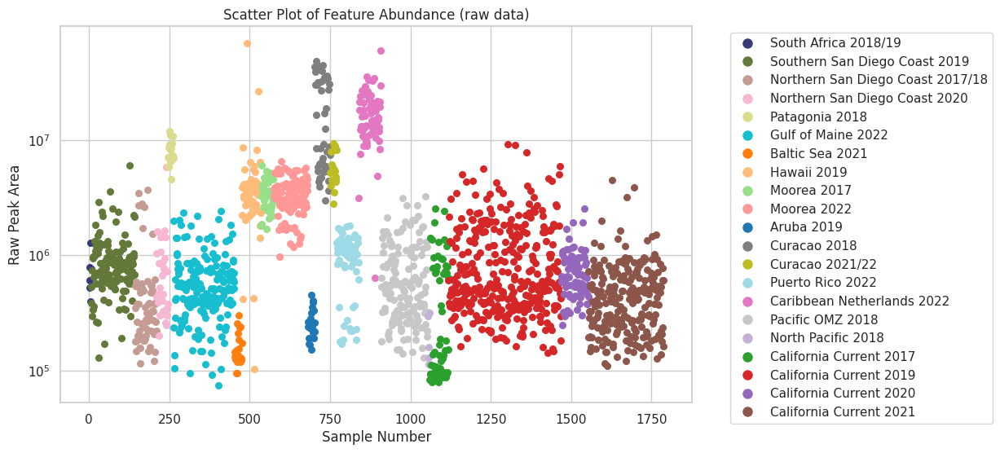

In [72]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the CSV file with feature abundance values
file_path = 'featuretable_reformated.csv'
abundance_data = pd.read_csv(file_path)

# Convert 'row ID' column to strings
abundance_data['row ID'] = abundance_data['row ID'].astype(str)

# Define the user-defined 'row ID' rows (example row IDs, replace with actual IDs if needed)
user_defined_row_ids = ['81498']  # Example row IDs, replace with actual IDs

# Filter the data for the user-defined 'row ID' rows
filtered_abundance_data = abundance_data[abundance_data['row ID'].isin(user_defined_row_ids)]

# Extract the 'row ID' and sample columns with '.mz' in the header
feature_ids = filtered_abundance_data['row ID']
sample_columns = [col for col in filtered_abundance_data.columns if '.mz' in col]
sample_abundance_data = filtered_abundance_data[sample_columns]

# Load the metadata file
metadata_file_path = 'merged_metadata_AbsolutelyFinal_FBMN_20241110.txt'
metadata = pd.read_csv(metadata_file_path, sep='\t')

# Create a dictionary to map sample names to datasets
sample_to_dataset = dict(zip(metadata['filename'], metadata['ATTRIBUTE_descriptor']))

# Define colors for each dataset
dataset_colors = {
    'Aruba 2019': '#1f77b4',
    'Baltic Sea 2021': '#ff7f0e',
    'California Current 2017': '#2ca02c',
    'California Current 2019': '#d62728',
    'California Current 2020': '#9467bd',
    'California Current 2021': '#8c564b',
    'Caribbean Netherlands 2022': '#e377c2',
    'Curacao 2018': '#7f7f7f',
    'Curacao 2021/22': '#bcbd22',
    'Gulf of Maine 2022': '#17becf',
    'Hawaii 2019': '#ffbb78',
    'Moorea 2017': '#98df8a',
    'Moorea 2022': '#ff9896',
    'North Pacific 2018': '#c5b0d5',
    'Northern San Diego Coast 2017/18': '#c49c94',
    'Northern San Diego Coast 2020': '#f7b6d2',
    'Pacific OMZ 2018': '#c7c7c7',
    'Patagonia 2018': '#dbdb8d',
    'Puerto Rico 2022': '#9edae5',
    'South Africa 2018/19': '#393b79',
    'Southern San Diego Coast 2019': '#637939'
}

# Define the desired order of datasets
dataset_order = ['South Africa 2018/19', 
                 'Southern San Diego Coast 2019', 
                 'Northern San Diego Coast 2017/18', 
                 'Northern San Diego Coast 2020', 
                 'Patagonia 2018', 
                 'Gulf of Maine 2022', 
                 'Baltic Sea 2021', 
                 'Hawaii 2019', 
                 'Moorea 2017', 
                 'Moorea 2022', 
                 'Aruba 2019', 
                 'Curacao 2018', 
                 'Curacao 2021/22', 
                 'Puerto Rico 2022', 
                 'Caribbean Netherlands 2022', 
                 'Pacific OMZ 2018', 
                 'North Pacific 2018', 
                 'California Current 2017', 
                 'California Current 2019', 
                 'California Current 2020', 
                 'California Current 2021']

# Remove zero abundances from the data
sample_abundance_data = sample_abundance_data[sample_abundance_data > 0]

# Create a scatter plot
plt.figure(figsize=(10, 6))

# Plot Feature Abundance columns with colors according to dataset and using dots for all markers
sample_order = []
for col in sample_columns:
    non_zero_data = sample_abundance_data[col].dropna()
    sample_name = col.split(' ')[0]  # Extract sample name from column header
    dataset = sample_to_dataset.get(sample_name, 'Unknown')  # Get dataset from metadata
    
    if dataset != 'Blanks':
        sample_order.extend([(dataset, val) for val in non_zero_data])

# Sort samples by dataset according to the desired order
sample_order.sort(key=lambda x: dataset_order.index(x[0]) if x[0] in dataset_order else len(dataset_order))

# Print the dataset names before plotting
unique_datasets_in_plot = sorted(set([x[0] for x in sample_order]), key=lambda x: dataset_order.index(x) if x in dataset_order else len(dataset_order))
print("Datasets contributing to the plot:", unique_datasets_in_plot)

# Plot sorted samples with dots for all markers and reduced marker size
for i, (dataset, val) in enumerate(sample_order):
    plt.scatter(i + 1, val, color=dataset_colors.get(dataset, '#000000'), marker='o', s=30)  # Default to black dot if dataset not found

# Add labels and title
plt.xlabel('Sample Number')
plt.ylabel('Raw Peak Area')
plt.yscale('log')
plt.title('Scatter Plot of Feature Abundance (raw data)')
plt.grid(True)

# Add legend to show unique ATTRIBUTE_descriptor values and assigned colors that contribute to the plot
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=dataset_colors[ds], markersize=10, linestyle='None') for ds in unique_datasets_in_plot]
plt.legend(handles, unique_datasets_in_plot, bbox_to_anchor=(1.05, 1), loc='upper left')

# Save the plot as .svg file
plt.savefig('Diethylphthalate_Feature_Abundance_Plot.svg', format='svg', bbox_inches='tight')

# Show the plot
plt.show()

# 11.Boxplots for SI (Supp.Fig.8)

/tmp/ipykernel_20140/114494.py:88: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




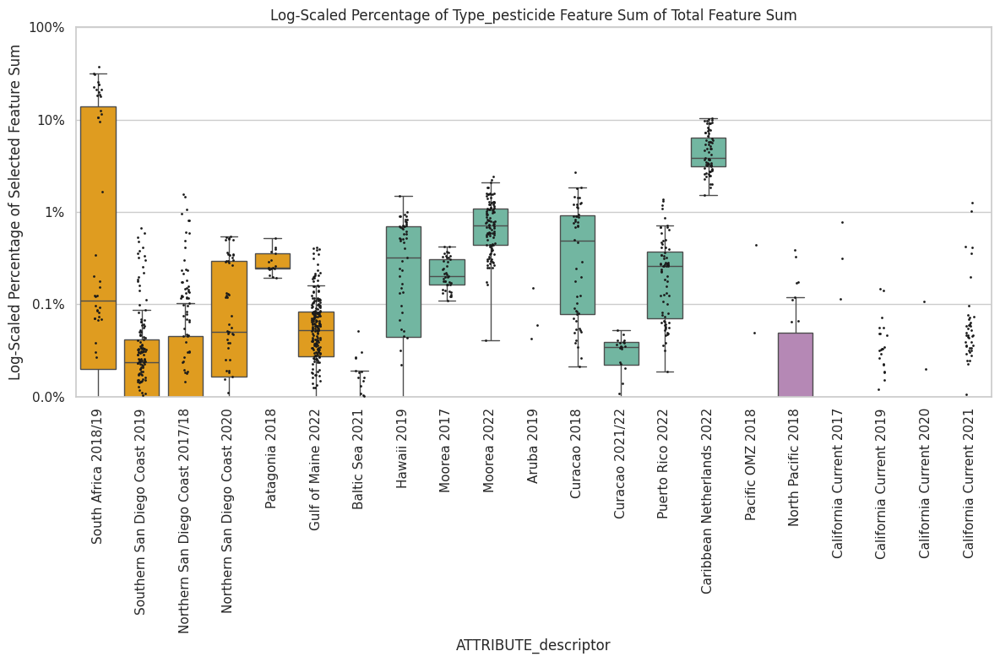

In [73]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FuncFormatter

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

# Load features of interest
df_featuresofinterest = pd.read_csv('unique_xenobiotic_features_noDEET.csv')

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonia 2018': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2021': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd'
}

# Define subsets for Type and Class
subsets = {
    "Type_pesticide": df_featuresofinterest[df_featuresofinterest['Type'] == "pesticide"]
}

def percentage_formatter(x, pos):
    if x < 1:
        return f'{x:.1f}%'
    else:
        return f'{x:.0f}%'

for subset_name, subset_df in subsets.items():
    
    # Filter the DataFrame to keep only the features of interest
    df_selected_features = df[subset_df['row ID']]
    
    # Sum the selected features per sample
    df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
    
    # Calculate the percentage of selected feature sum compared to total feature sum
    df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
    
    # Merge with metadata according to descriptor
    df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')
    
    # Sort the DataFrame based on the desired order
    df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
    df_final = df_final.sort_values('ATTRIBUTE_descriptor')
    
    # Plot boxplot with log-scaled y-axis showing actual percentages as labels
    plt.figure(figsize=(12, 8))
    sns.set_theme(style="whitegrid")
    
    ax = sns.boxplot(
        data=df_final,
        x='ATTRIBUTE_descriptor',
        y='percentage',
        palette=custom_palette,
        showfliers=False  
    )
    
    sns.stripplot(
        data=df_final,
        x='ATTRIBUTE_descriptor',
        y='percentage',
        color='k',
        size=2,  
        jitter=True,  
        ax=ax
    )
    
    plt.yscale('log')
    
    ax.yaxis.set_major_formatter(FuncFormatter(percentage_formatter))
    
    plt.title(f'Log-Scaled Percentage of {subset_name} Feature Sum of Total Feature Sum')
    plt.xlabel('ATTRIBUTE_descriptor')
    plt.ylabel('Log-Scaled Percentage of Selected Feature Sum')
    plt.ylim(0.01, 100)
    plt.xticks(rotation=90)
    plt.tight_layout()
    
    # Save plot and DataFrame to files with updated names
    plt.savefig(f'SI_log_percentageplot_{subset_name}.svg')
    plt.show()
    
    df_final.to_csv(f'SI_log_final_results_{subset_name}.csv', index=False)

/tmp/ipykernel_20140/3686029294.py:88: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




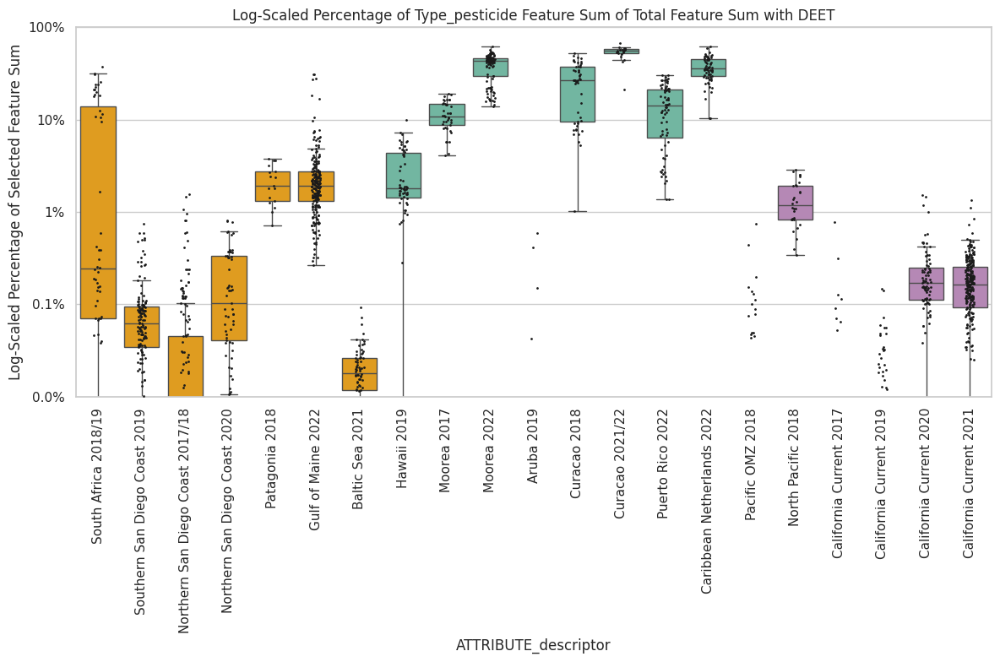

In [74]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FuncFormatter

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

# Load features of interest
df_featuresofinterest = pd.read_csv('unique_xenobiotic_features.csv')

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonia 2018': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2021': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd'
}

# Define subsets for Type and Class
subsets = {
    "Type_pesticide": df_featuresofinterest[df_featuresofinterest['Type'] == "pesticide"]
}

def percentage_formatter(x, pos):
    if x < 1:
        return f'{x:.1f}%'
    else:
        return f'{x:.0f}%'

for subset_name, subset_df in subsets.items():
    
    # Filter the DataFrame to keep only the features of interest
    df_selected_features = df[subset_df['row ID']]
    
    # Sum the selected features per sample
    df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
    
    # Calculate the percentage of selected feature sum compared to total feature sum
    df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
    
    # Merge with metadata according to descriptor
    df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')
    
    # Sort the DataFrame based on the desired order
    df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
    df_final = df_final.sort_values('ATTRIBUTE_descriptor')
    
    # Plot boxplot with log-scaled y-axis showing actual percentages as labels
    plt.figure(figsize=(12, 8))
    sns.set_theme(style="whitegrid")
    
    ax = sns.boxplot(
        data=df_final,
        x='ATTRIBUTE_descriptor',
        y='percentage',
        palette=custom_palette,
        showfliers=False  
    )
    
    sns.stripplot(
        data=df_final,
        x='ATTRIBUTE_descriptor',
        y='percentage',
        color='k',
        size=2,  
        jitter=True,  
        ax=ax
    )
    
    plt.yscale('log')
    
    ax.yaxis.set_major_formatter(FuncFormatter(percentage_formatter))
    
    plt.title(f'Log-Scaled Percentage of {subset_name} Feature Sum of Total Feature Sum with DEET')
    plt.xlabel('ATTRIBUTE_descriptor')
    plt.ylabel('Log-Scaled Percentage of Selected Feature Sum')
    plt.ylim(0.01, 100)
    plt.xticks(rotation=90)
    plt.tight_layout()
    
    # Save plot and DataFrame to files with updated names
    plt.savefig(f'SI_log_percentageplot_{subset_name}.svg')
    plt.show()
    
    df_final.to_csv(f'SI_log_final_results_withDEET_{subset_name}.csv', index=False)

# 12.Distance to shore and Depth violins (Fig. 5c+d, Supp.Fig.9+10)

/tmp/ipykernel_20140/838726900.py:61: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/838726900.py:61: UserWarning:


The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.

/tmp/ipykernel_20140/838726900.py:61: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



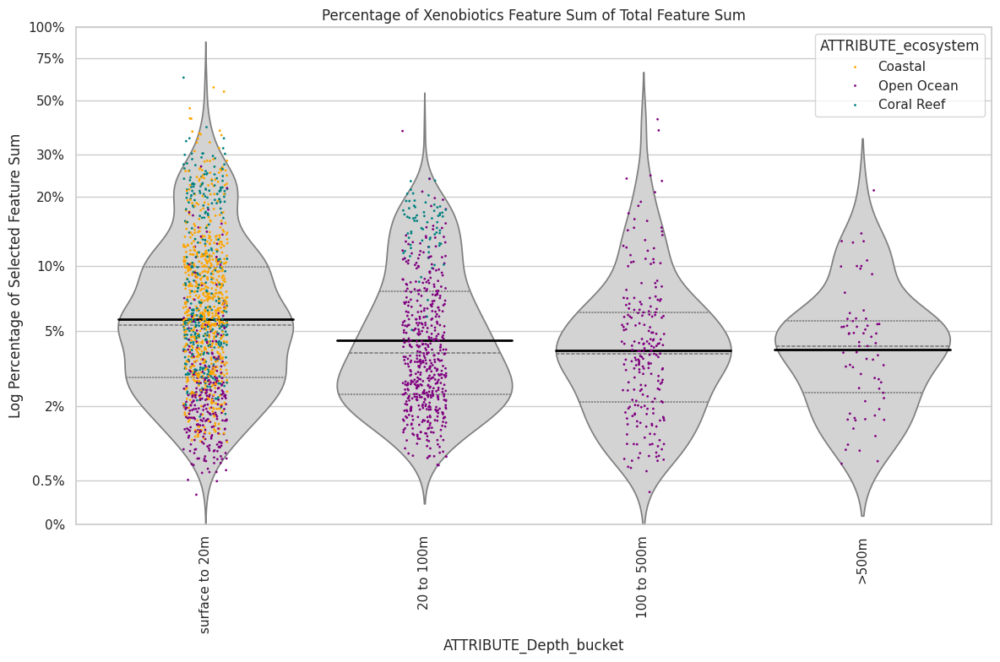

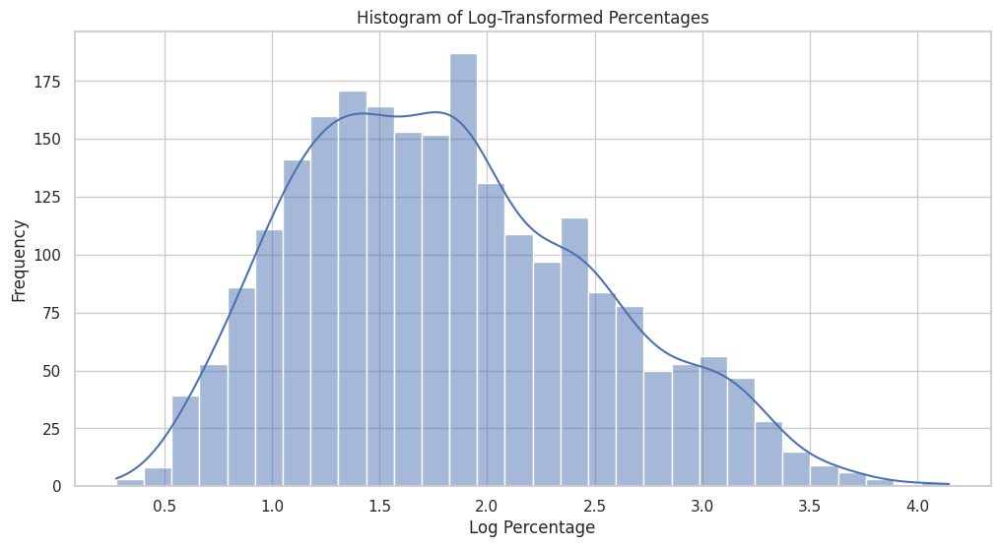

<Figure size 600x600 with 0 Axes>

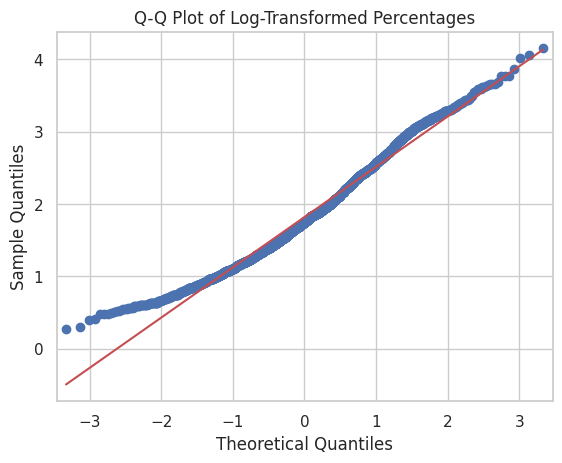

ANOVA result: F-statistic=21.38, p-value=1.17e-13

Tukey's HSD test results:
      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
   group1       group2     meandiff p-adj   lower  upper  reject
----------------------------------------------------------------
100 to 500m     20 to 100m   0.0939 0.3053 -0.0452 0.2331  False
100 to 500m          >500m   0.0065 0.9999 -0.2366 0.2497  False
100 to 500m surface to 20m    0.292    0.0  0.1642 0.4199   True
 20 to 100m          >500m  -0.0874 0.7475 -0.3114 0.1366  False
 20 to 100m surface to 20m   0.1981    0.0  0.1123 0.2839   True
      >500m surface to 20m   0.2855 0.0041  0.0684 0.5026   True
----------------------------------------------------------------


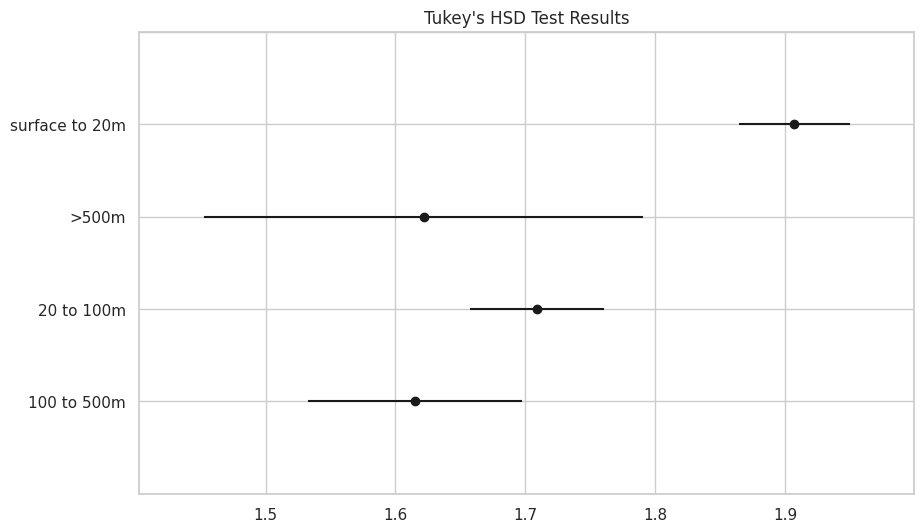

In [75]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy.stats as stats
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

# Load the list of features of interest
features_of_interest = pd.read_csv('unique_xenobiotic_features_noDEET.csv')

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[features_of_interest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Remove rows where percentage is zero
df_selected_features = df_selected_features[df_selected_features['percentage'] != 0]

# Log transform the percentage data
df_selected_features['log_percentage'] = np.log(df_selected_features['percentage'] + 1)  # Adding 1 to avoid log(0)

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_Depth_bucket', 'ATTRIBUTE_ecosystem']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['surface to 20m', '20 to 100m', '100 to 500m', '>500m']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_Depth_bucket'] = pd.Categorical(df_final['ATTRIBUTE_Depth_bucket'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_Depth_bucket')

# Define colors for ecosystems
ecosystem_colors = {'Coastal': 'orange', 'Coral Reef': 'teal', 'Open Ocean': 'purple'}

# Plot violin plot with log-transformed data
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_Depth_bucket',
    y='log_percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=['lightgrey'],
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_Depth_bucket',
    y='log_percentage',
    hue='ATTRIBUTE_ecosystem',
    palette=ecosystem_colors,
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax,
    dodge=False  # Separate points by hue
)

# Calculate means and plot them as solid lines
means = df_final.groupby('ATTRIBUTE_Depth_bucket')['log_percentage'].mean().values
for i, mean in enumerate(means):
    plt.plot([i - 0.4, i + 0.4], [mean, mean], color='black', linestyle='-', linewidth=2)

plt.title('Percentage of Xenobiotics Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_Depth_bucket')
plt.ylabel('Log Percentage of Selected Feature Sum')
plt.ylim(0, np.log(99 + 1))  # Adjust y-axis limit for log-transformed data

# Set y-axis tick labels at specified percentages and remove horizontal lines from tick labels
y_ticks_labels = [0, 0.5, 2, 5, 10, 20, 30, 50, 75, 100]
y_ticks = np.log(np.array(y_ticks_labels) + 1)
ax.set_yticks(y_ticks)
ax.set_yticklabels([f'{label}%' for label in y_ticks_labels])
ax.yaxis.grid(True)  # Remove horizontal grid lines

plt.xticks(rotation=90)
plt.tight_layout()

plt.savefig('Violins_Percentageoftotalintensity_depth_with_log_transformed.svg')
plt.show()

# Plot histogram of log-transformed percentages
plt.figure(figsize=(12, 6))
sns.histplot(df_final['log_percentage'], bins=30, kde=True)
plt.title('Histogram of Log-Transformed Percentages')
plt.xlabel('Log Percentage')
plt.ylabel('Frequency')
plt.show()

# Plot Q-Q plot of log-transformed percentages
plt.figure(figsize=(6, 6))
qqplot(df_final['log_percentage'], line='s')
plt.title('Q-Q Plot of Log-Transformed Percentages')
plt.show()

# Perform ANOVA on log-transformed percentages
anova_result = stats.f_oneway(
    df_final[df_final['ATTRIBUTE_Depth_bucket'] == 'surface to 20m']['log_percentage'],
    df_final[df_final['ATTRIBUTE_Depth_bucket'] == '20 to 100m']['log_percentage'],
    df_final[df_final['ATTRIBUTE_Depth_bucket'] == '100 to 500m']['log_percentage'],
    df_final[df_final['ATTRIBUTE_Depth_bucket'] == '>500m']['log_percentage']
)

print(f"ANOVA result: F-statistic={anova_result.statistic:.2f}, p-value={anova_result.pvalue:.2e}")

# Perform Tukey's HSD test on log-transformed percentages
tukey_result = pairwise_tukeyhsd(
    endog=df_final['log_percentage'],
    groups=df_final['ATTRIBUTE_Depth_bucket'],
    alpha=0.05
)

print("\nTukey's HSD test results:")
print(tukey_result)

# Plot Tukey's HSD test results
tukey_result.plot_simultaneous()
plt.title("Tukey's HSD Test Results")
plt.show()

/tmp/ipykernel_20140/1476320661.py:66: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/1476320661.py:66: UserWarning:


The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.

/tmp/ipykernel_20140/1476320661.py:66: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



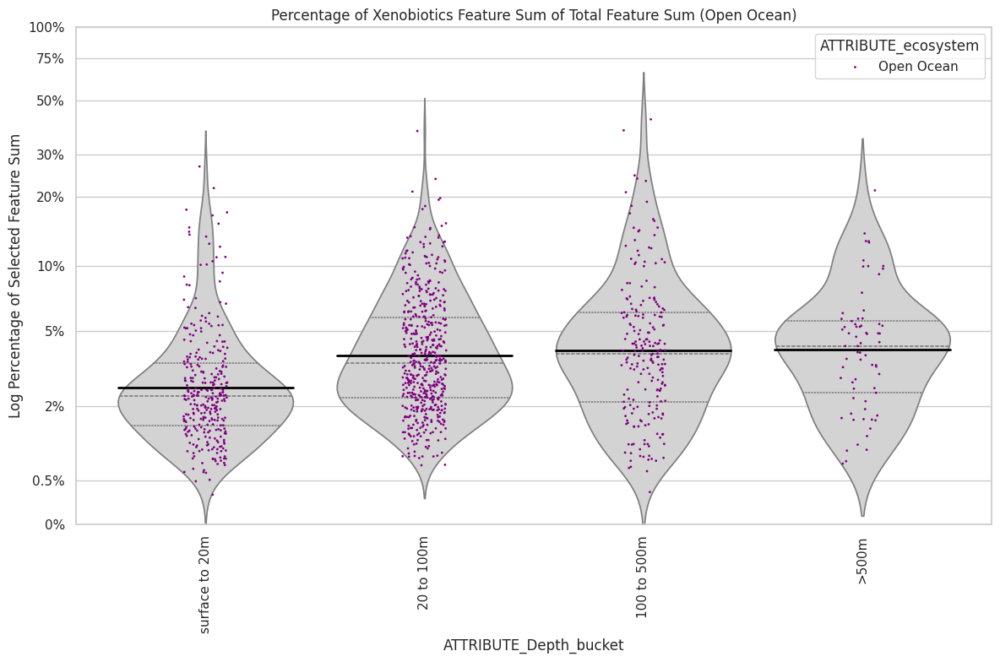

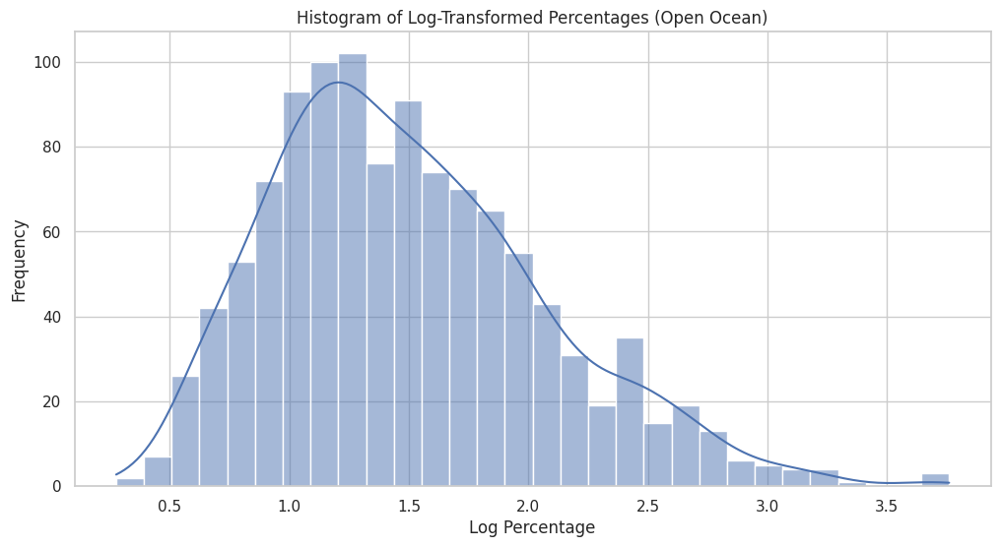

<Figure size 600x600 with 0 Axes>

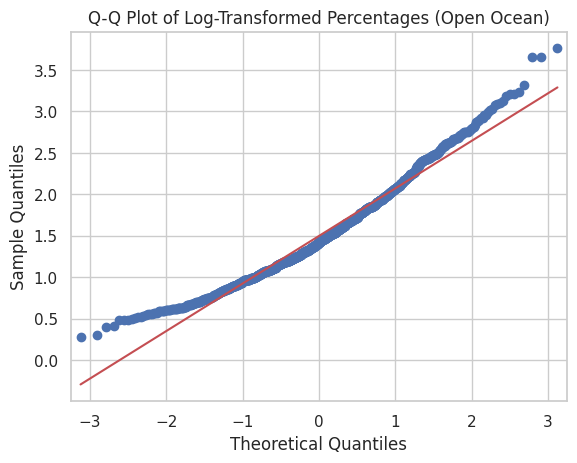

ANOVA result for Open Ocean: F-statistic=24.52, p-value=2.26e-15

Tukey's HSD test results for Open Ocean:
       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
   group1       group2     meandiff p-adj   lower   upper  reject
-----------------------------------------------------------------
100 to 500m     20 to 100m  -0.0478 0.7087  -0.163  0.0673  False
100 to 500m          >500m   0.0065 0.9998 -0.1912  0.2043  False
100 to 500m surface to 20m  -0.3451    0.0 -0.4714 -0.2188   True
 20 to 100m          >500m   0.0544  0.871  -0.129  0.2378  False
 20 to 100m surface to 20m  -0.2973    0.0 -0.3996 -0.1949   True
      >500m surface to 20m  -0.3517    0.0 -0.5422 -0.1611   True
-----------------------------------------------------------------


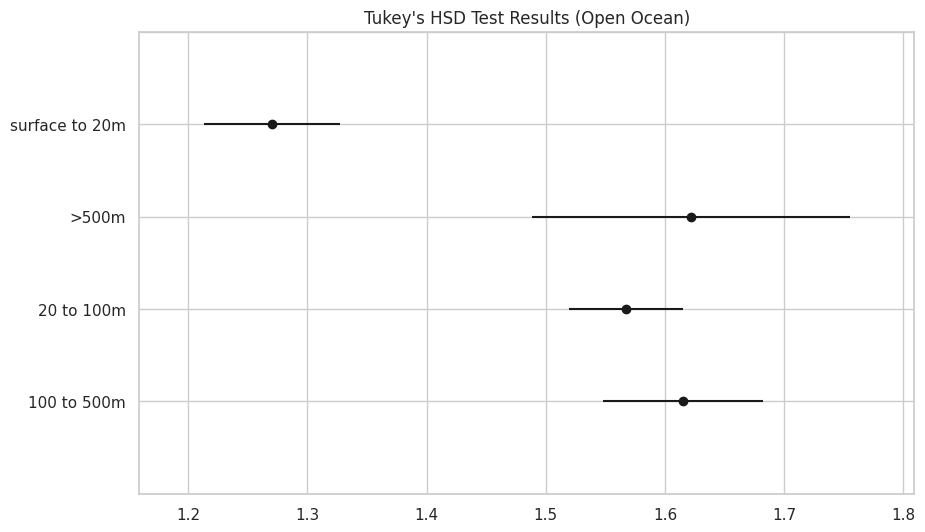

In [76]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy.stats as stats
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

# Load the list of features of interest
features_of_interest = pd.read_csv('unique_xenobiotic_features_noDEET.csv')

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[features_of_interest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Remove rows where percentage is zero
df_selected_features = df_selected_features[df_selected_features['percentage'] != 0]

# Log transform the percentage data
df_selected_features['log_percentage'] = np.log(df_selected_features['percentage'] + 1)  # Adding 1 to avoid log(0)

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_Depth_bucket', 'ATTRIBUTE_ecosystem']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['surface to 20m', '20 to 100m', '100 to 500m', '>500m']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_Depth_bucket'] = pd.Categorical(df_final['ATTRIBUTE_Depth_bucket'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_Depth_bucket')

# Define colors for ecosystems
ecosystem_colors = {'Coastal': 'orange', 'Coral Reef': 'teal', 'Open Ocean': 'purple'}

# Function to perform analysis for a specific ecosystem
def perform_analysis(ecosystem):
    # Filter data for the specified ecosystem
    df_ecosystem = df_final[df_final['ATTRIBUTE_ecosystem'] == ecosystem]
    
    # Plot violin plot with log-transformed data
    plt.figure(figsize=(12, 8))
    sns.set_theme(style="whitegrid")
    ax = sns.violinplot(
        data=df_ecosystem,
        x='ATTRIBUTE_Depth_bucket',
        y='log_percentage',
        inner='quartile',  # Show quartiles inside the violin
        palette=['lightgrey'],
        scale='width'  # Normalize the width of the violins
    )
    sns.stripplot(
        data=df_ecosystem,
        x='ATTRIBUTE_Depth_bucket',
        y='log_percentage',
        hue='ATTRIBUTE_ecosystem',
        palette=ecosystem_colors,
        size=2,  # Adjust size if needed
        jitter=True,  # Add jitter to prevent overlapping
        ax=ax,
        dodge=False  # Separate points by hue
    )

    # Calculate means and plot them as solid lines
    means = df_ecosystem.groupby('ATTRIBUTE_Depth_bucket')['log_percentage'].mean().values
    for i, mean in enumerate(means):
        plt.plot([i - 0.4, i + 0.4], [mean, mean], color='black', linestyle='-', linewidth=2)

    plt.title(f'Percentage of Xenobiotics Feature Sum of Total Feature Sum ({ecosystem})')
    plt.xlabel('ATTRIBUTE_Depth_bucket')
    plt.ylabel('Log Percentage of Selected Feature Sum')
    plt.ylim(0, np.log(99 + 1))  # Adjust y-axis limit for log-transformed data

    # Set y-axis tick labels at specified percentages and remove horizontal lines from tick labels
    y_ticks_labels = [0, 0.5, 2, 5, 10, 20, 30, 50, 75, 100]
    y_ticks = np.log(np.array(y_ticks_labels) + 1)
    ax.set_yticks(y_ticks)
    ax.set_yticklabels([f'{label}%' for label in y_ticks_labels])
    ax.yaxis.grid(True)  # Remove horizontal grid lines

    plt.xticks(rotation=90)
    plt.tight_layout()

    plt.savefig(f'Violins_Percentageoftotalintensity_depth_with_log_transformed_{ecosystem}.svg')
    plt.show()

    # Plot histogram of log-transformed percentages
    plt.figure(figsize=(12, 6))
    sns.histplot(df_ecosystem['log_percentage'], bins=30, kde=True)
    plt.title(f'Histogram of Log-Transformed Percentages ({ecosystem})')
    plt.xlabel('Log Percentage')
    plt.ylabel('Frequency')
    plt.show()

    # Plot Q-Q plot of log-transformed percentages
    plt.figure(figsize=(6, 6))
    qqplot(df_ecosystem['log_percentage'], line='s')
    plt.title(f'Q-Q Plot of Log-Transformed Percentages ({ecosystem})')
    plt.show()

    # Perform ANOVA on log-transformed percentages
    anova_result = stats.f_oneway(
        df_ecosystem[df_ecosystem['ATTRIBUTE_Depth_bucket'] == 'surface to 20m']['log_percentage'],
        df_ecosystem[df_ecosystem['ATTRIBUTE_Depth_bucket'] == '20 to 100m']['log_percentage'],
        df_ecosystem[df_ecosystem['ATTRIBUTE_Depth_bucket'] == '100 to 500m']['log_percentage'],
        df_ecosystem[df_ecosystem['ATTRIBUTE_Depth_bucket'] == '>500m']['log_percentage']
    )

    print(f"ANOVA result for {ecosystem}: F-statistic={anova_result.statistic:.2f}, p-value={anova_result.pvalue:.2e}")

    # Perform Tukey's HSD test on log-transformed percentages
    tukey_result = pairwise_tukeyhsd(
        endog=df_ecosystem['log_percentage'],
        groups=df_ecosystem['ATTRIBUTE_Depth_bucket'],
        alpha=0.05
    )

    print(f"\nTukey's HSD test results for {ecosystem}:")
    print(tukey_result)

    # Plot Tukey's HSD test results
    tukey_result.plot_simultaneous()
    plt.title(f"Tukey's HSD Test Results ({ecosystem})")
    plt.show()

# Perform analysis for each ecosystem separately
for ecosystem in ['Open Ocean']:
    perform_analysis(ecosystem)

/tmp/ipykernel_20140/3007291126.py:66: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/3007291126.py:66: UserWarning:


The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.

/tmp/ipykernel_20140/3007291126.py:66: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



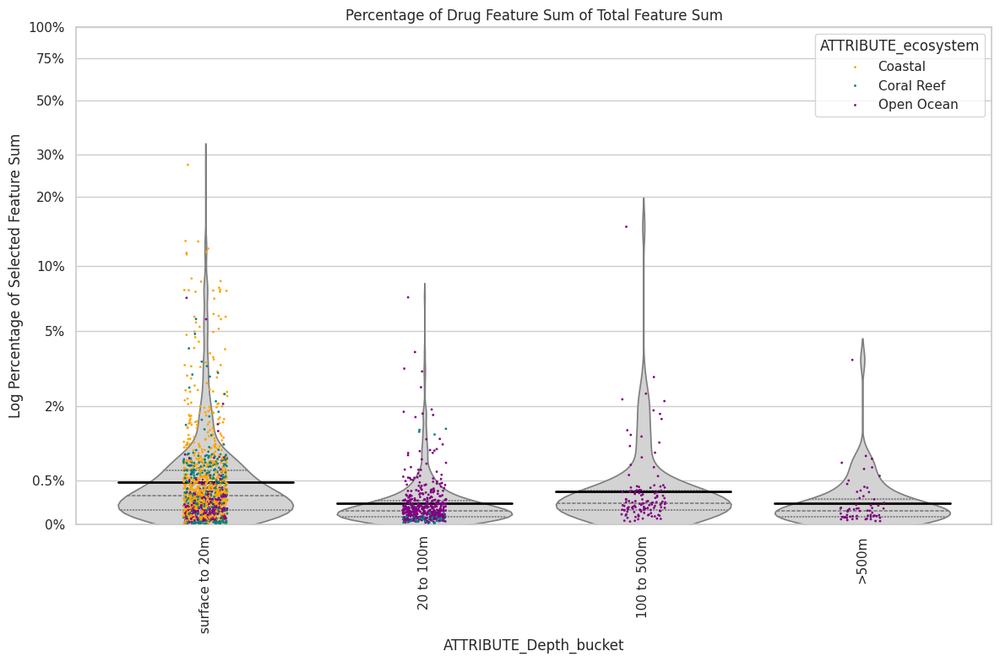

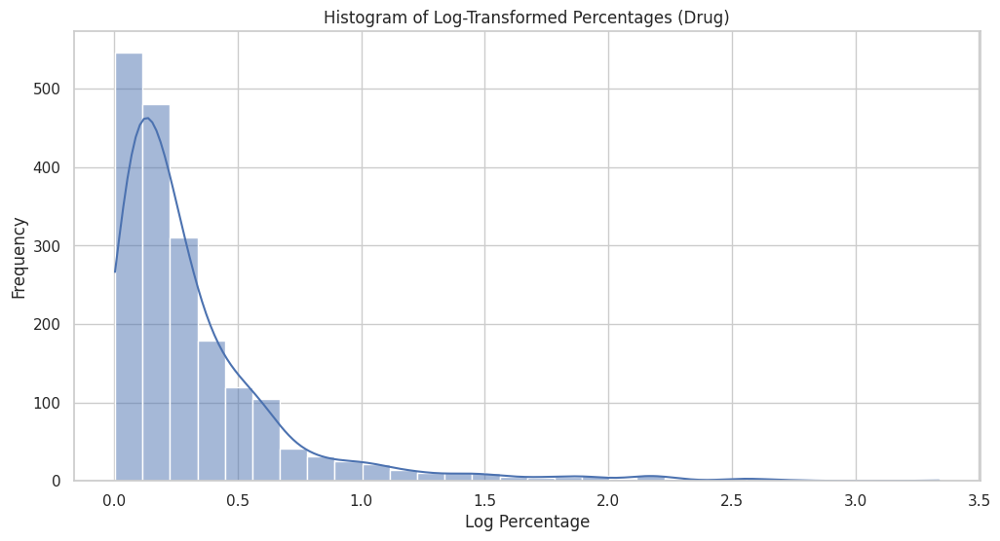

<Figure size 600x600 with 0 Axes>

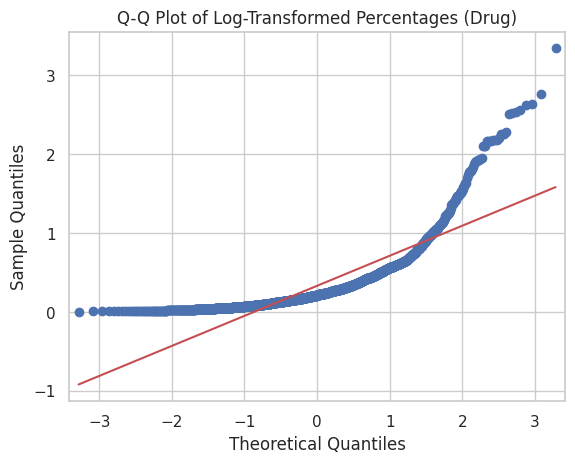

ANOVA result for drug: F-statistic=35.72, p-value=1.81e-22

Tukey's HSD test results for drug:
       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
   group1       group2     meandiff p-adj   lower   upper  reject
-----------------------------------------------------------------
100 to 500m     20 to 100m  -0.1107 0.0177 -0.2076 -0.0137   True
100 to 500m          >500m  -0.1039 0.2718 -0.2519  0.0442  False
100 to 500m surface to 20m    0.087 0.0644 -0.0034  0.1774  False
 20 to 100m          >500m   0.0068 0.9991 -0.1212  0.1348  False
 20 to 100m surface to 20m   0.1976    0.0  0.1463   0.249   True
      >500m surface to 20m   0.1909 0.0004  0.0677   0.314   True
-----------------------------------------------------------------


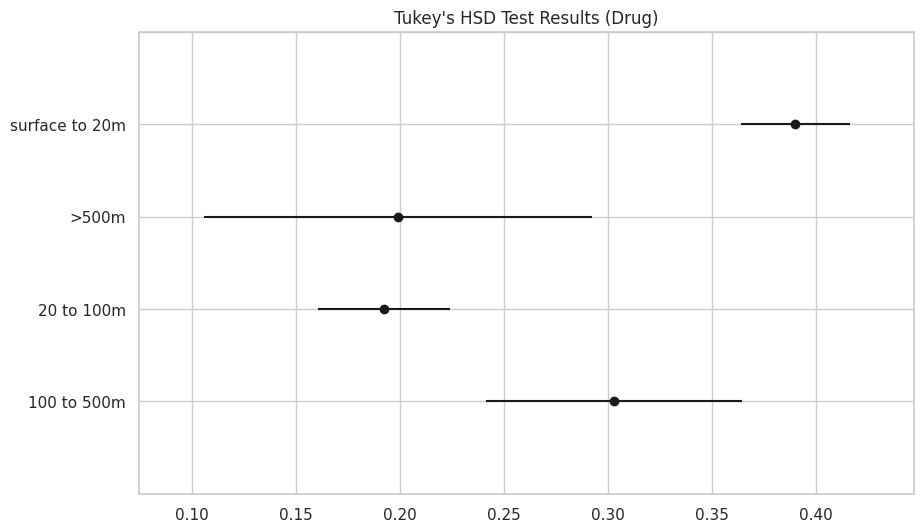

/tmp/ipykernel_20140/3007291126.py:66: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/3007291126.py:66: UserWarning:


The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.

/tmp/ipykernel_20140/3007291126.py:66: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



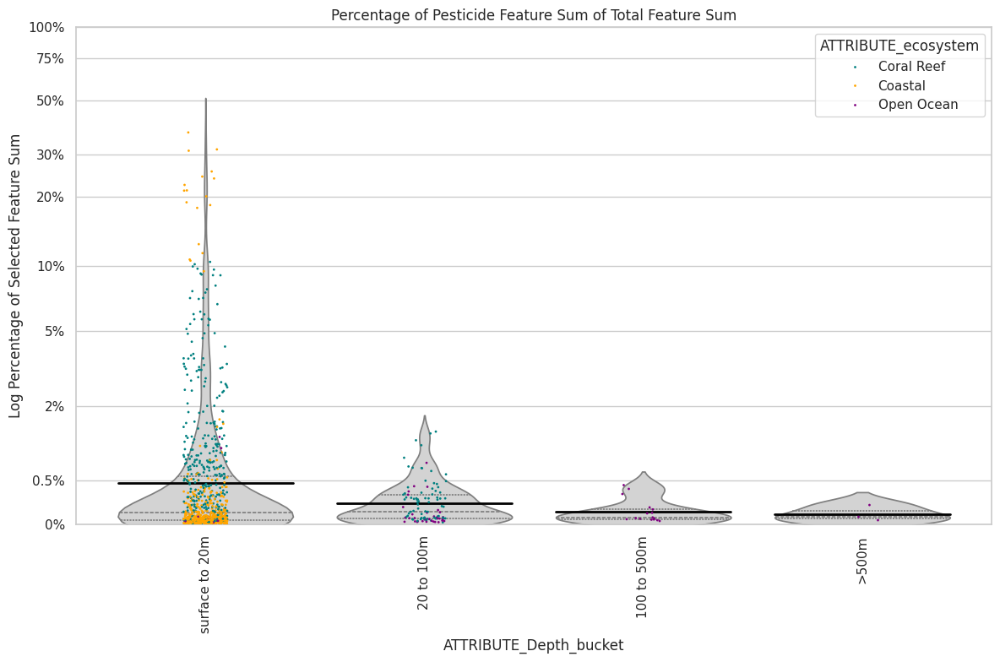

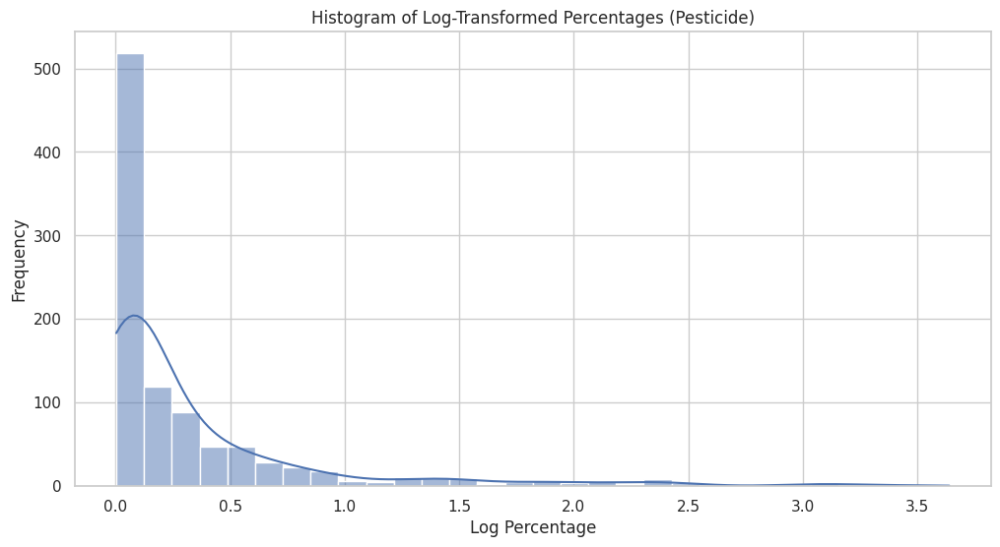

<Figure size 600x600 with 0 Axes>

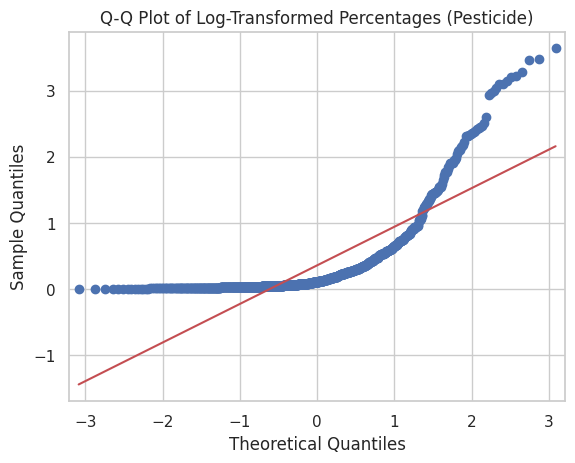

ANOVA result for pesticide: F-statistic=4.27, p-value=5.26e-03

Tukey's HSD test results for pesticide:
      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
   group1       group2     meandiff p-adj   lower  upper  reject
----------------------------------------------------------------
100 to 500m     20 to 100m   0.0781 0.9589 -0.3233 0.4795  False
100 to 500m          >500m  -0.0239 0.9999 -0.9655 0.9177  False
100 to 500m surface to 20m   0.2624 0.2797 -0.1153   0.64  False
 20 to 100m          >500m   -0.102 0.9907 -0.9782 0.7742  False
 20 to 100m surface to 20m   0.1842 0.0115  0.0302 0.3383   True
      >500m surface to 20m   0.2863 0.8299 -0.5793 1.1518  False
----------------------------------------------------------------


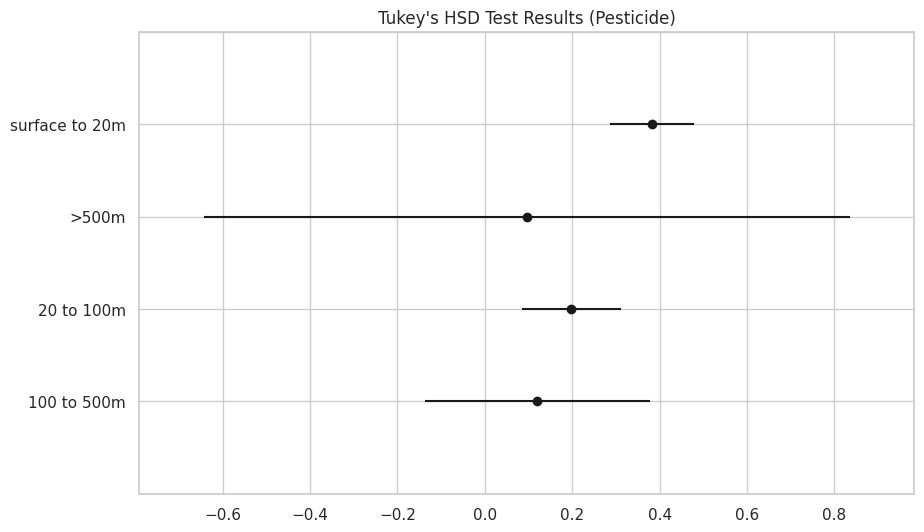

/tmp/ipykernel_20140/3007291126.py:66: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/3007291126.py:66: UserWarning:


The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.

/tmp/ipykernel_20140/3007291126.py:66: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



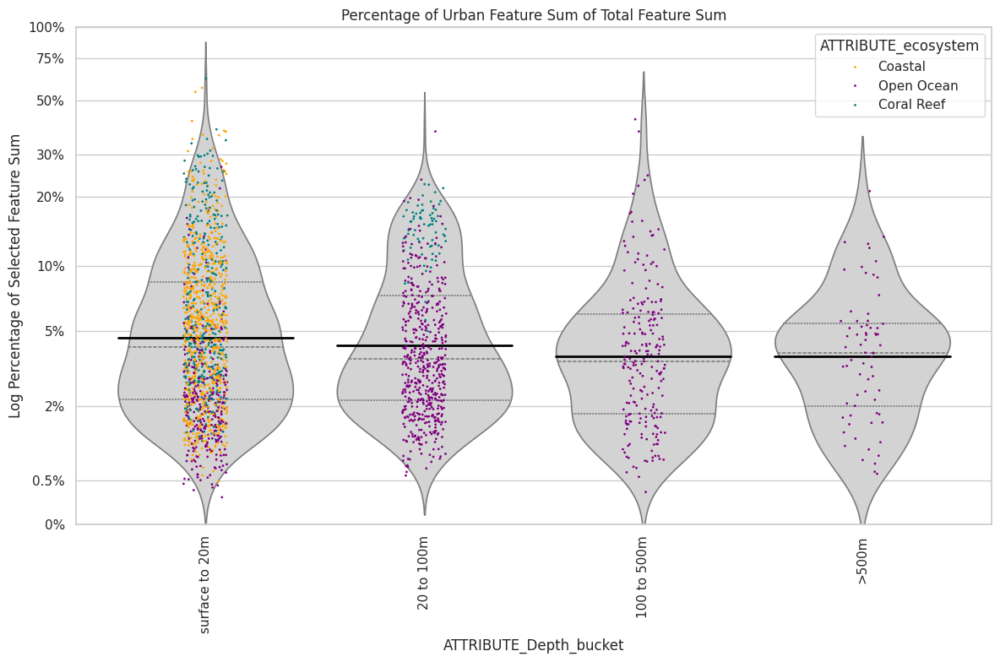

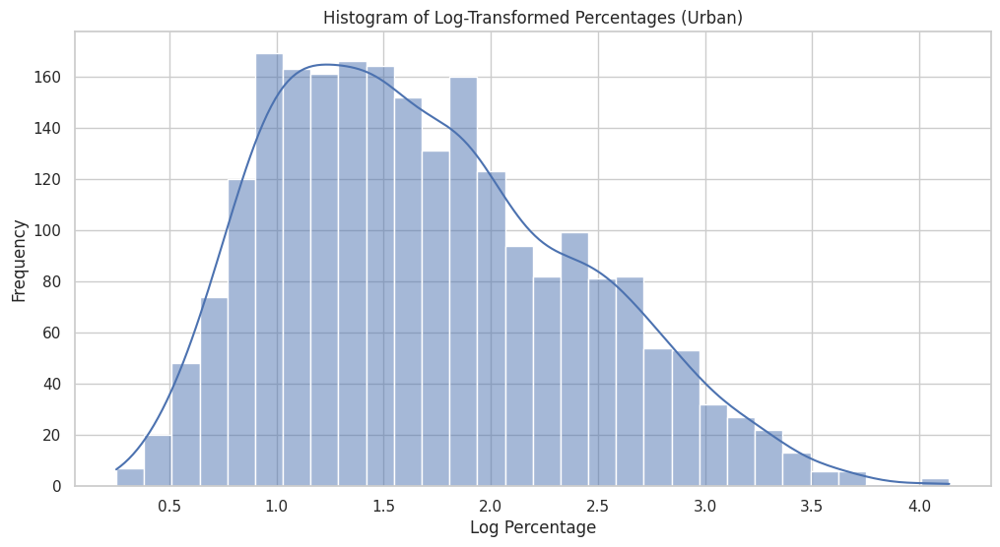

<Figure size 600x600 with 0 Axes>

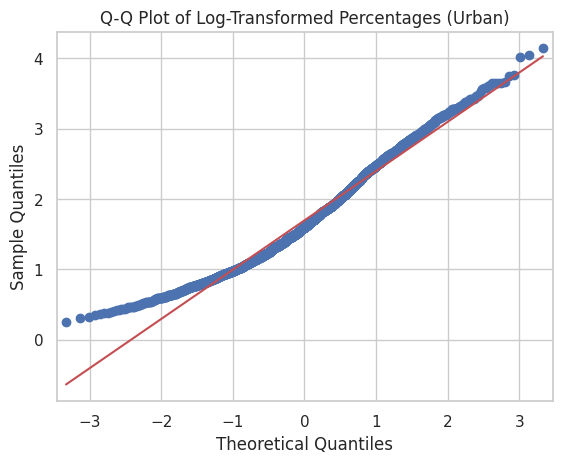

ANOVA result for urban: F-statistic=5.58, p-value=8.20e-04

Tukey's HSD test results for urban:
      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
   group1       group2     meandiff p-adj   lower  upper  reject
----------------------------------------------------------------
100 to 500m     20 to 100m   0.1027 0.2457 -0.0392 0.2445  False
100 to 500m          >500m    0.003    1.0  -0.245  0.251  False
100 to 500m surface to 20m   0.1756  0.003  0.0453  0.306   True
 20 to 100m          >500m  -0.0996 0.6762  -0.328 0.1287  False
 20 to 100m surface to 20m    0.073 0.1397 -0.0145 0.1605  False
      >500m surface to 20m   0.1726 0.1866 -0.0488  0.394  False
----------------------------------------------------------------


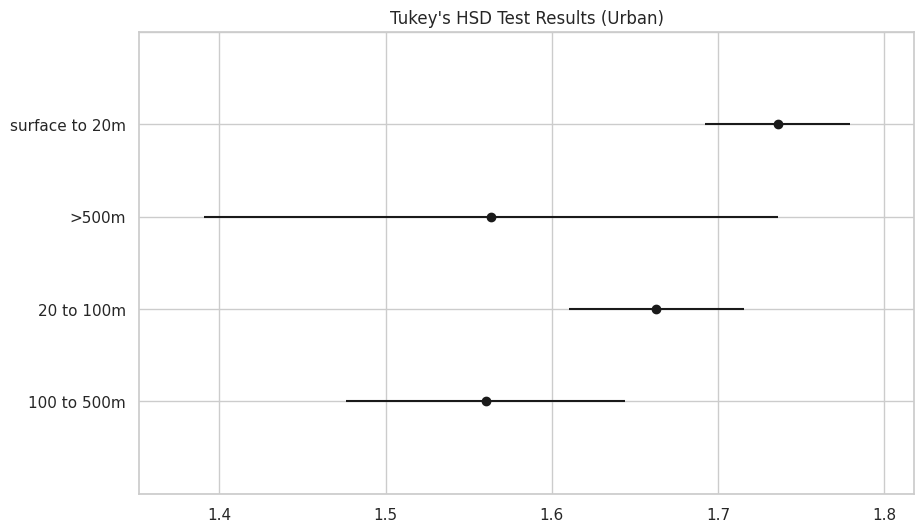

In [77]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy.stats as stats
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

# Load the list of features of interest
features_of_interest = pd.read_csv('unique_xenobiotic_features_noDEET.csv')

# Define a function to execute the script for a given type
def execute_script_for_type(type_name):
    # Filter features of interest based on type
    filtered_features = features_of_interest[features_of_interest['Type'] == type_name]
    
    # Filter the DataFrame to keep only the filtered features
    df_selected_features = df[filtered_features['row ID']]
    
    # Sum the selected features per sample
    df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
    
    # Calculate the percentage of selected feature sum compared to total feature sum
    df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
    
    # Remove rows where percentage is zero
    df_selected_features = df_selected_features[df_selected_features['percentage'] != 0]
    
    # Log transform the percentage data
    df_selected_features['log_percentage'] = np.log(df_selected_features['percentage'] + 1)  # Adding 1 to avoid log(0)
    
    # Load metadata
    metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')
    
    # Merge with metadata according to descriptor
    df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_Depth_bucket', 'ATTRIBUTE_ecosystem']], left_index=True, right_on='filename')
    
    # Define the desired order for ATTRIBUTE_descriptor
    descriptor_order = ['surface to 20m', '20 to 100m', '100 to 500m', '>500m']
    
    # Sort the DataFrame based on the desired order
    df_final['ATTRIBUTE_Depth_bucket'] = pd.Categorical(df_final['ATTRIBUTE_Depth_bucket'], categories=descriptor_order, ordered=True)
    df_final = df_final.sort_values('ATTRIBUTE_Depth_bucket')
    
    # Define colors for ecosystems
    ecosystem_colors = {'Coastal': 'orange', 'Coral Reef': 'teal', 'Open Ocean': 'purple'}
    
    # Plot violin plot with log-transformed data
    plt.figure(figsize=(12, 8))
    sns.set_theme(style="whitegrid")
    ax = sns.violinplot(
        data=df_final,
        x='ATTRIBUTE_Depth_bucket',
        y='log_percentage',
        inner='quartile',  # Show quartiles inside the violin
        palette=['lightgrey'],
        scale='width'  # Normalize the width of the violins
    )
    sns.stripplot(
        data=df_final,
        x='ATTRIBUTE_Depth_bucket',
        y='log_percentage',
        hue='ATTRIBUTE_ecosystem',
        palette=ecosystem_colors,
        size=2,  # Adjust size if needed
        jitter=True,  # Add jitter to prevent overlapping
        ax=ax,
        dodge=False  # Separate points by hue
    )
    
    # Calculate means and plot them as solid lines
    means = df_final.groupby('ATTRIBUTE_Depth_bucket')['log_percentage'].mean().values
    for i, mean in enumerate(means):
        plt.plot([i - 0.4, i + 0.4], [mean, mean], color='black', linestyle='-', linewidth=2)
    
    plt.title(f'Percentage of {type_name.capitalize()} Feature Sum of Total Feature Sum')
    plt.xlabel('ATTRIBUTE_Depth_bucket')
    plt.ylabel('Log Percentage of Selected Feature Sum')
    plt.ylim(0, np.log(99 + 1))  # Adjust y-axis limit for log-transformed data
    
    # Set y-axis tick labels at specified percentages and remove horizontal lines from tick labels
    y_ticks_labels = [0, 0.5, 2, 5, 10, 20, 30, 50, 75, 100]
    y_ticks = np.log(np.array(y_ticks_labels) + 1)
    ax.set_yticks(y_ticks)
    ax.set_yticklabels([f'{label}%' for label in y_ticks_labels])
    ax.yaxis.grid(True)  # Remove horizontal grid lines
    
    plt.xticks(rotation=90)
    plt.tight_layout()
    
    plt.savefig(f'Violins_Percentageoftotalintensity_depth_with_log_transformed_{type_name}.svg')
    plt.show()
    
    # Plot histogram of log-transformed percentages
    plt.figure(figsize=(12, 6))
    sns.histplot(df_final['log_percentage'], bins=30, kde=True)
    plt.title(f'Histogram of Log-Transformed Percentages ({type_name.capitalize()})')
    plt.xlabel('Log Percentage')
    plt.ylabel('Frequency')
    plt.show()
    
    # Plot Q-Q plot of log-transformed percentages
    plt.figure(figsize=(6, 6))
    qqplot(df_final['log_percentage'], line='s')
    plt.title(f'Q-Q Plot of Log-Transformed Percentages ({type_name.capitalize()})')
    plt.show()
    
    # Perform ANOVA on log-transformed percentages
    anova_result = stats.f_oneway(
        df_final[df_final['ATTRIBUTE_Depth_bucket'] == 'surface to 20m']['log_percentage'],
        df_final[df_final['ATTRIBUTE_Depth_bucket'] == '20 to 100m']['log_percentage'],
        df_final[df_final['ATTRIBUTE_Depth_bucket'] == '100 to 500m']['log_percentage'],
        df_final[df_final['ATTRIBUTE_Depth_bucket'] == '>500m']['log_percentage']
    )
    
    print(f"ANOVA result for {type_name}: F-statistic={anova_result.statistic:.2f}, p-value={anova_result.pvalue:.2e}")
    
    # Perform Tukey's HSD test on log-transformed percentages
    tukey_result = pairwise_tukeyhsd(
        endog=df_final['log_percentage'],
        groups=df_final['ATTRIBUTE_Depth_bucket'],
        alpha=0.05
    )
    
    print(f"\nTukey's HSD test results for {type_name}:")
    print(tukey_result)
    
    # Plot Tukey's HSD test results
    tukey_result.plot_simultaneous()
    plt.title(f"Tukey's HSD Test Results ({type_name.capitalize()})")
    plt.show()

# Execute the script for each type
for type_name in ['drug', 'pesticide', 'urban']:
    execute_script_for_type(type_name)

/tmp/ipykernel_20140/2934337142.py:61: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/2934337142.py:61: UserWarning:


The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.

/tmp/ipykernel_20140/2934337142.py:61: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



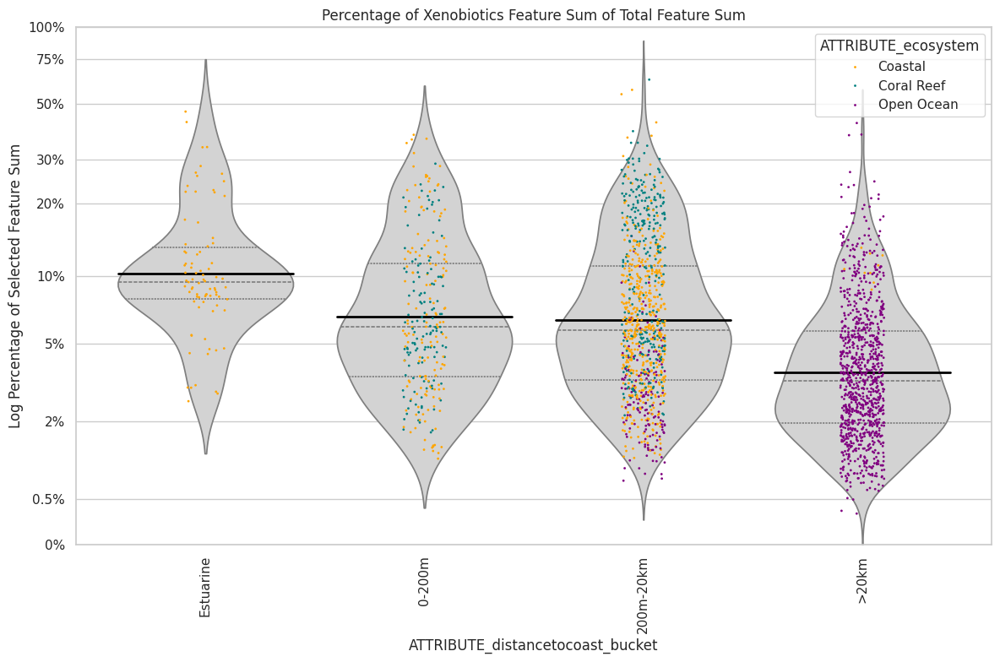

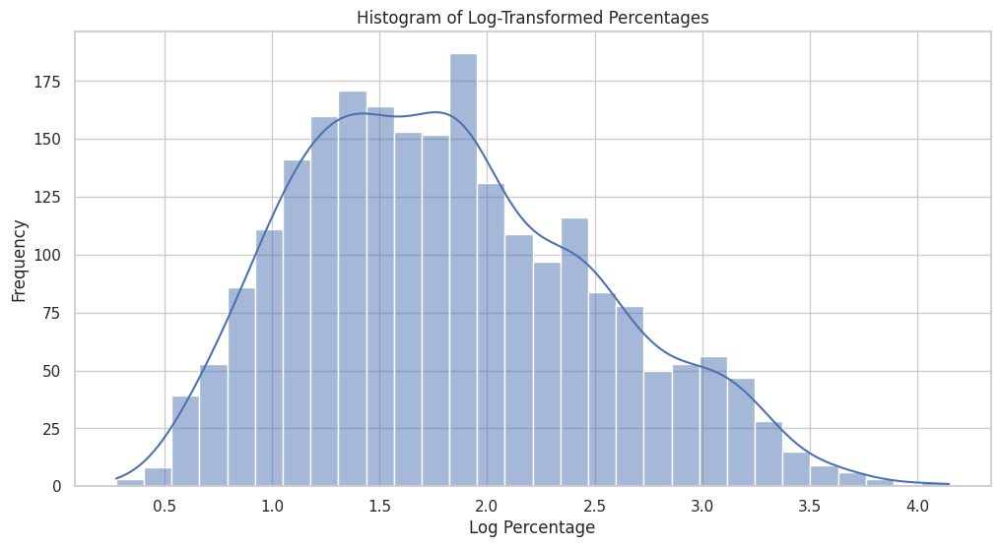

<Figure size 600x600 with 0 Axes>

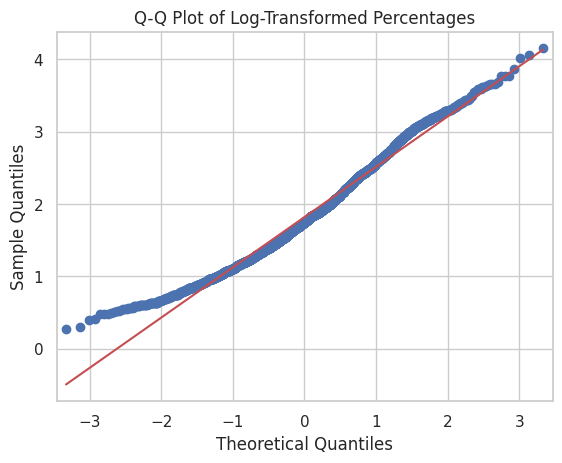

ANOVA result: F-statistic=124.71, p-value=7.30e-75

Tukey's HSD test results:
   Multiple Comparison of Means - Tukey HSD, FWER=0.05    
  group1    group2  meandiff p-adj   lower   upper  reject
----------------------------------------------------------
   0-200m 200m-20km  -0.0323 0.8817 -0.1449  0.0802  False
   0-200m     >20km  -0.5008    0.0 -0.6132 -0.3885   True
   0-200m Estuarine   0.3875    0.0  0.1794  0.5956   True
200m-20km     >20km  -0.4685    0.0 -0.5435 -0.3935   True
200m-20km Estuarine   0.4198    0.0  0.2293  0.6104   True
    >20km Estuarine   0.8883    0.0  0.6979  1.0788   True
----------------------------------------------------------


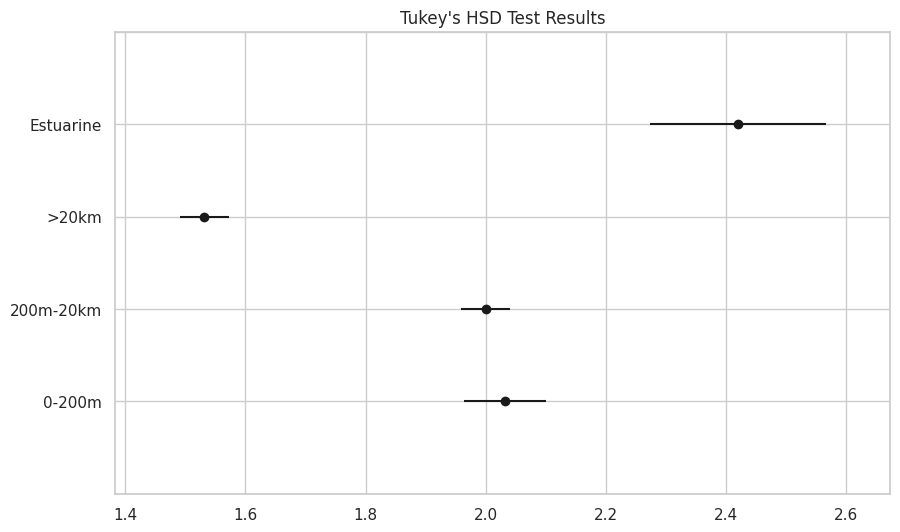

In [78]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy.stats as stats
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

# Load the list of features of interest
features_of_interest = pd.read_csv('unique_xenobiotic_features_noDEET.csv')

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[features_of_interest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Remove rows where percentage is zero
df_selected_features = df_selected_features[df_selected_features['percentage'] != 0]

# Log transform the percentage data
df_selected_features['log_percentage'] = np.log(df_selected_features['percentage'] + 1)  # Adding 1 to avoid log(0)

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_distancetocoast_bucket', 'ATTRIBUTE_ecosystem']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['Estuarine', '0-200m', '200m-20km', '>20km']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_distancetocoast_bucket'] = pd.Categorical(df_final['ATTRIBUTE_distancetocoast_bucket'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_distancetocoast_bucket')

# Define colors for ecosystems
ecosystem_colors = {'Coastal': 'orange', 'Coral Reef': 'teal', 'Open Ocean': 'purple'}

# Plot violin plot with log-transformed data
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_distancetocoast_bucket',
    y='log_percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=['lightgrey'],
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_distancetocoast_bucket',
    y='log_percentage',
    hue='ATTRIBUTE_ecosystem',
    palette=ecosystem_colors,
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax,
    dodge=False  # Separate points by hue
)

# Calculate means and plot them as solid lines
means = df_final.groupby('ATTRIBUTE_distancetocoast_bucket')['log_percentage'].mean().values
for i, mean in enumerate(means):
    plt.plot([i - 0.4, i + 0.4], [mean, mean], color='black', linestyle='-', linewidth=2)

plt.title('Percentage of Xenobiotics Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_distancetocoast_bucket')
plt.ylabel('Log Percentage of Selected Feature Sum')
plt.ylim(0, np.log(99 + 1))  # Adjust y-axis limit for log-transformed data

# Set y-axis tick labels at specified percentages and remove horizontal lines from tick labels
y_ticks_labels = [0, 0.5, 2, 5, 10, 20, 30, 50, 75, 100]
y_ticks = np.log(np.array(y_ticks_labels) + 1)
ax.set_yticks(y_ticks)
ax.set_yticklabels([f'{label}%' for label in y_ticks_labels])
ax.yaxis.grid(True)  # Remove horizontal grid lines

plt.xticks(rotation=90)
plt.tight_layout()

plt.savefig('Violins_Percentageoftotalintensity_distance_with_log_transformed.svg')
plt.show()

# Plot histogram of log-transformed percentages
plt.figure(figsize=(12, 6))
sns.histplot(df_final['log_percentage'], bins=30, kde=True)
plt.title('Histogram of Log-Transformed Percentages')
plt.xlabel('Log Percentage')
plt.ylabel('Frequency')
plt.show()

# Plot Q-Q plot of log-transformed percentages
plt.figure(figsize=(6, 6))
qqplot(df_final['log_percentage'], line='s')
plt.title('Q-Q Plot of Log-Transformed Percentages')
plt.show()

# Perform ANOVA on log-transformed percentages
anova_result = stats.f_oneway(
    df_final[df_final['ATTRIBUTE_distancetocoast_bucket'] == 'Estuarine']['log_percentage'],
    df_final[df_final['ATTRIBUTE_distancetocoast_bucket'] == '0-200m']['log_percentage'],
    df_final[df_final['ATTRIBUTE_distancetocoast_bucket'] == '200m-20km']['log_percentage'],
    df_final[df_final['ATTRIBUTE_distancetocoast_bucket'] == '>20km']['log_percentage']
)

print(f"ANOVA result: F-statistic={anova_result.statistic:.2f}, p-value={anova_result.pvalue:.2e}")

# Perform Tukey's HSD test on log-transformed percentages
tukey_result = pairwise_tukeyhsd(
    endog=df_final['log_percentage'],
    groups=df_final['ATTRIBUTE_distancetocoast_bucket'],
    alpha=0.05
)

print("\nTukey's HSD test results:")
print(tukey_result)

# Plot Tukey's HSD test results
tukey_result.plot_simultaneous()
plt.title("Tukey's HSD Test Results")
plt.show()

/tmp/ipykernel_20140/2676587293.py:39: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/2676587293.py:39: UserWarning:


The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.

/tmp/ipykernel_20140/2676587293.py:39: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



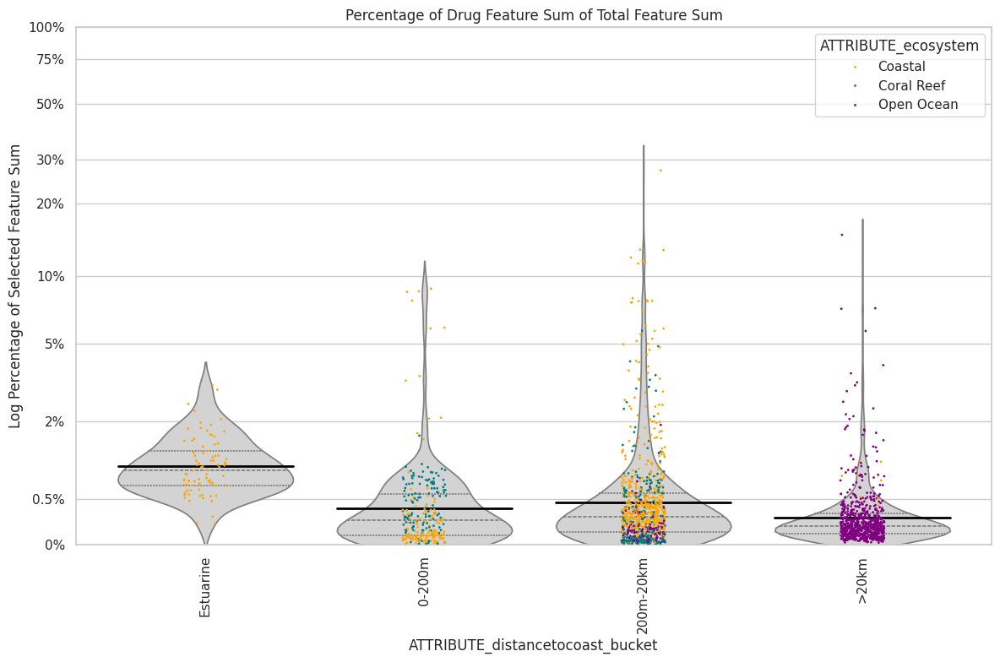

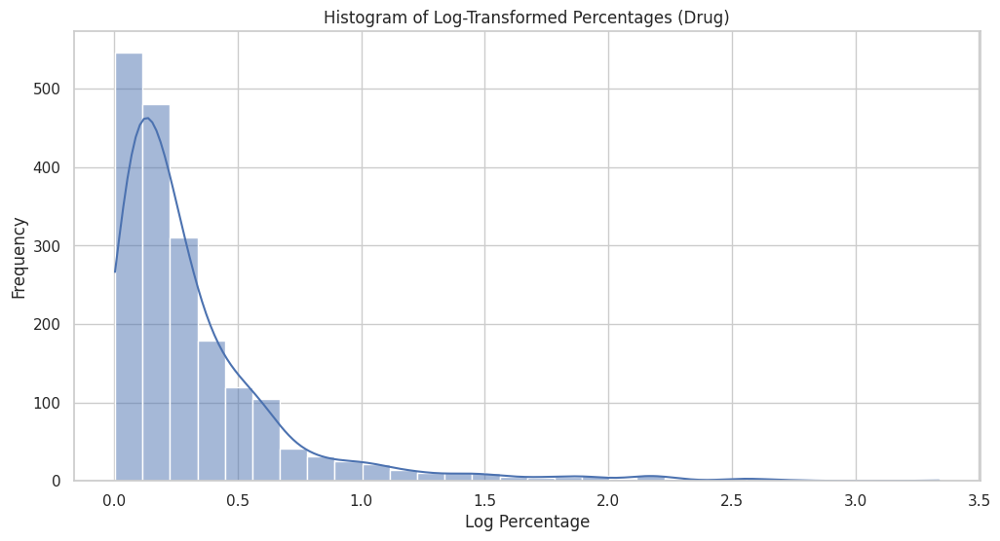

<Figure size 600x600 with 0 Axes>

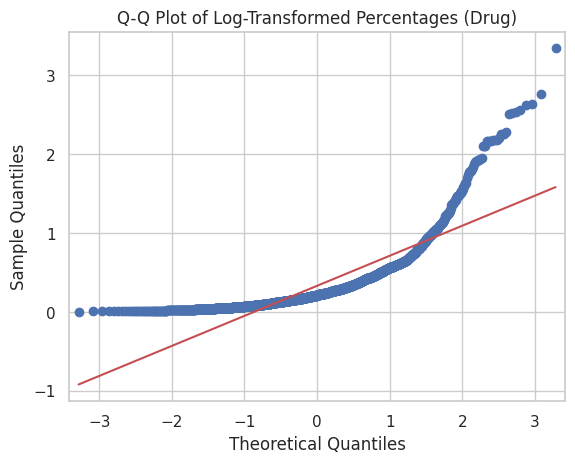

ANOVA result for drug: F-statistic=46.13, p-value=8.58e-29

Tukey's HSD test results for drug:
   Multiple Comparison of Means - Tukey HSD, FWER=0.05    
  group1    group2  meandiff p-adj   lower   upper  reject
----------------------------------------------------------
   0-200m 200m-20km   0.0548 0.1526 -0.0122  0.1217  False
   0-200m     >20km  -0.0816 0.0124 -0.1504 -0.0128   True
   0-200m Estuarine   0.3778    0.0  0.2572  0.4984   True
200m-20km     >20km  -0.1364    0.0 -0.1839 -0.0888   True
200m-20km Estuarine    0.323    0.0  0.2131   0.433   True
    >20km Estuarine   0.4594    0.0  0.3484  0.5704   True
----------------------------------------------------------


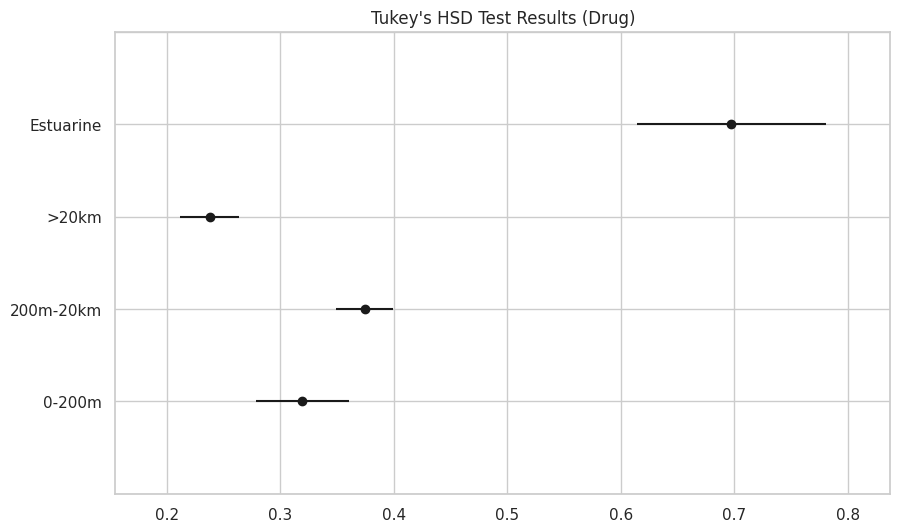

/tmp/ipykernel_20140/2676587293.py:39: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/2676587293.py:39: UserWarning:


The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.

/tmp/ipykernel_20140/2676587293.py:39: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



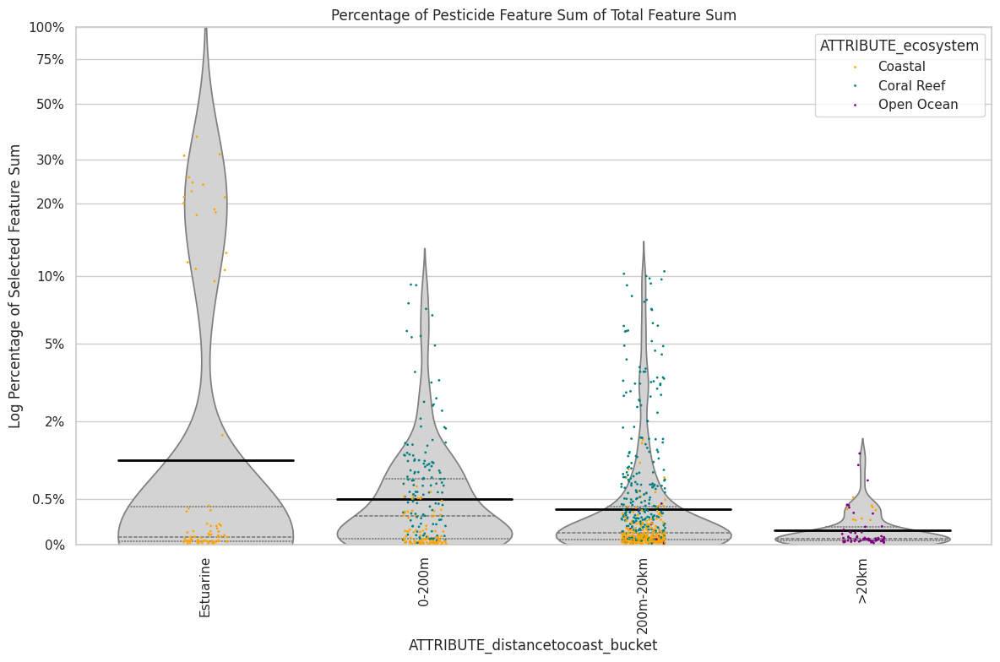

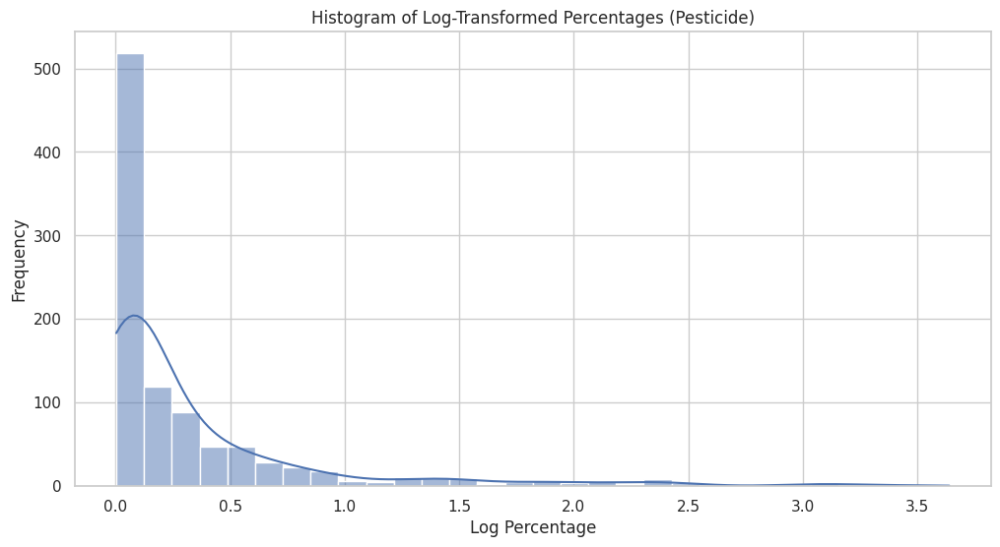

<Figure size 600x600 with 0 Axes>

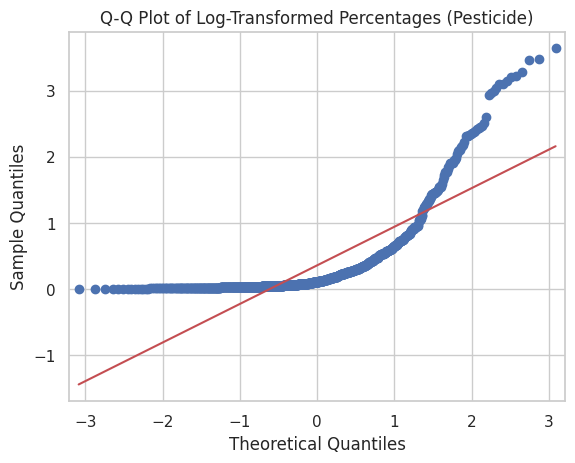

ANOVA result for pesticide: F-statistic=18.14, p-value=1.85e-11

Tukey's HSD test results for pesticide:
   Multiple Comparison of Means - Tukey HSD, FWER=0.05    
  group1    group2  meandiff p-adj   lower   upper  reject
----------------------------------------------------------
   0-200m 200m-20km   -0.085 0.2241 -0.1994  0.0295  False
   0-200m     >20km  -0.2747  0.002 -0.4721 -0.0772   True
   0-200m Estuarine    0.351    0.0  0.1592  0.5427   True
200m-20km     >20km  -0.1897 0.0368 -0.3713  -0.008   True
200m-20km Estuarine   0.4359    0.0  0.2606  0.6113   True
    >20km Estuarine   0.6256    0.0  0.3876  0.8636   True
----------------------------------------------------------


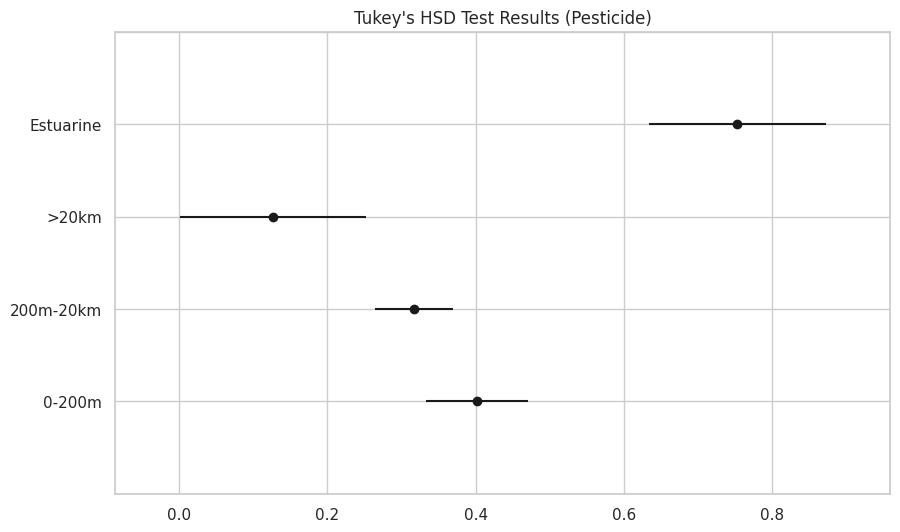

/tmp/ipykernel_20140/2676587293.py:39: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/2676587293.py:39: UserWarning:


The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.

/tmp/ipykernel_20140/2676587293.py:39: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



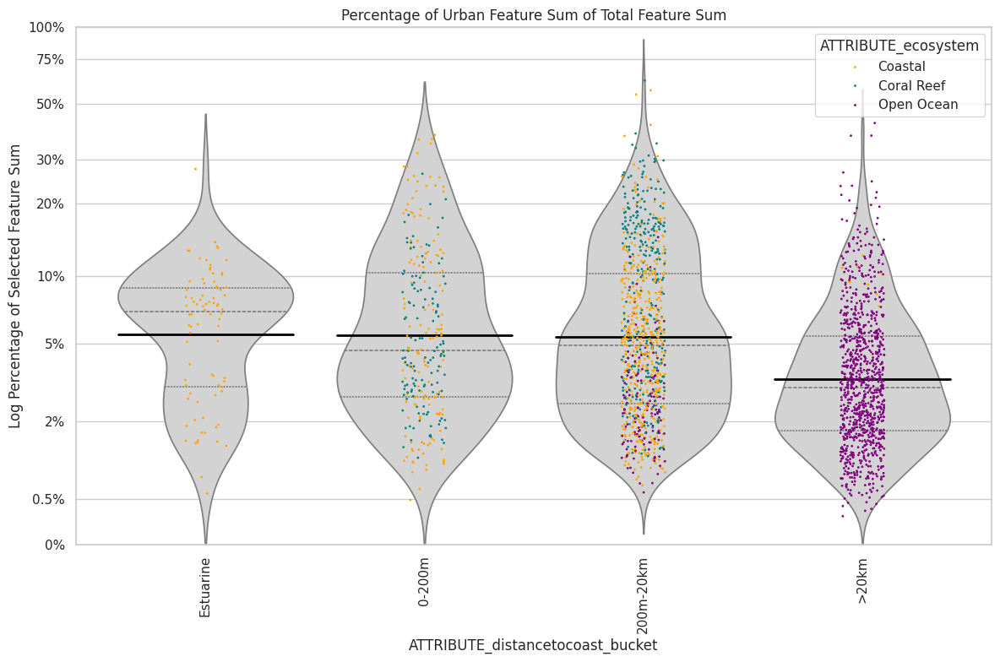

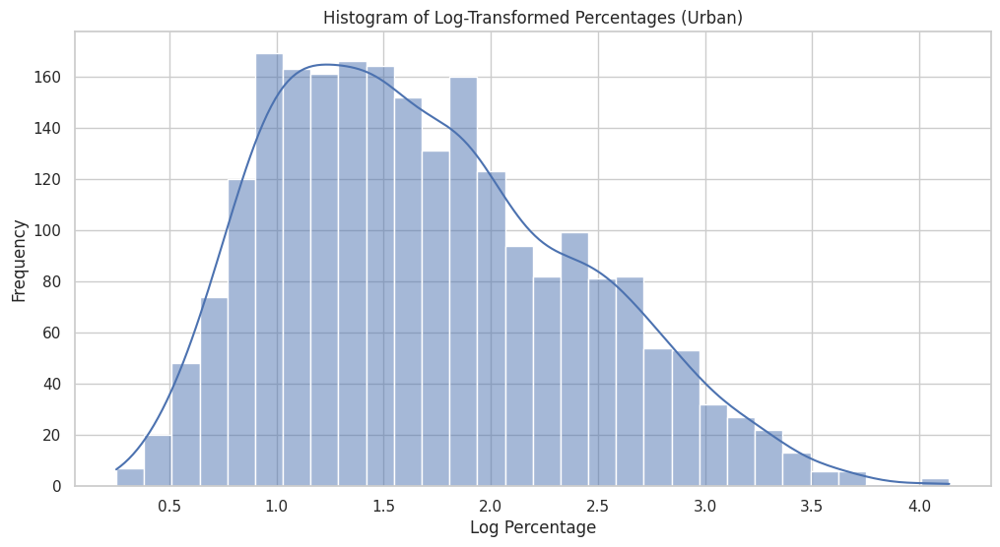

<Figure size 600x600 with 0 Axes>

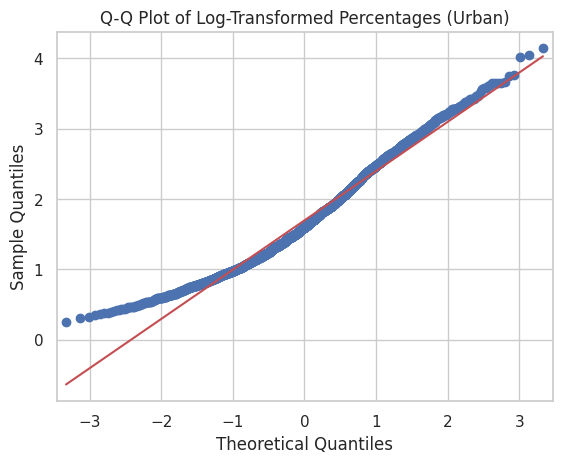

ANOVA result for urban: F-statistic=60.21, p-value=1.78e-37

Tukey's HSD test results for urban:
   Multiple Comparison of Means - Tukey HSD, FWER=0.05    
  group1    group2  meandiff p-adj   lower   upper  reject
----------------------------------------------------------
   0-200m 200m-20km  -0.0161 0.9852  -0.134  0.1019  False
   0-200m     >20km  -0.3928    0.0 -0.5105  -0.275   True
   0-200m Estuarine   0.0069 0.9998 -0.2112   0.225  False
200m-20km     >20km  -0.3767    0.0 -0.4553 -0.2981   True
200m-20km Estuarine    0.023  0.991 -0.1767  0.2226  False
    >20km Estuarine   0.3997    0.0  0.2001  0.5992   True
----------------------------------------------------------


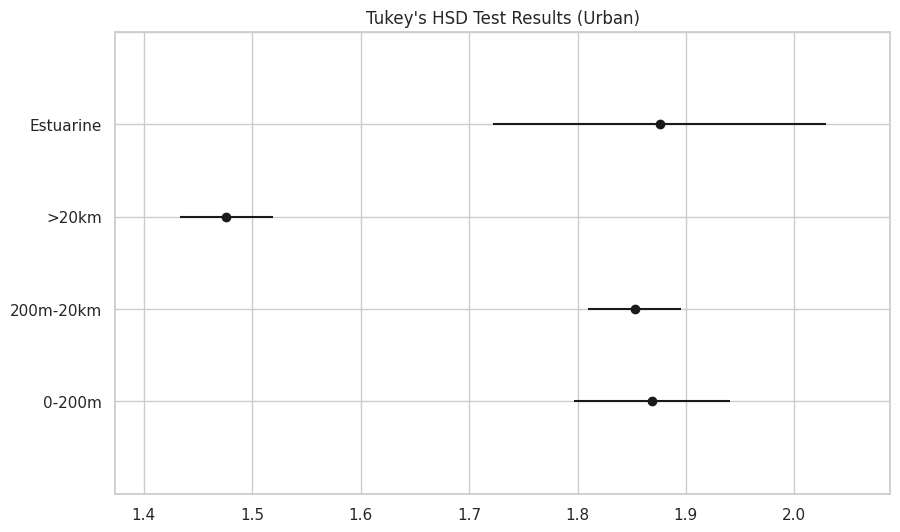

In [79]:
def execute_script_for_type(type_name):
    # Filter features of interest based on type
    filtered_features = features_of_interest[features_of_interest['Type'] == type_name]
    
    # Filter the DataFrame to keep only the filtered features
    df_selected_features = df[filtered_features['row ID']]
    
    # Sum the selected features per sample
    df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
    
    # Calculate the percentage of selected feature sum compared to total feature sum
    df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
    
    # Remove rows where percentage is zero
    df_selected_features = df_selected_features[df_selected_features['percentage'] != 0]
    
    # Log transform the percentage data
    df_selected_features['log_percentage'] = np.log(df_selected_features['percentage'] + 1)  # Adding 1 to avoid log(0)
    
    # Load metadata
    metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')
    
    # Merge with metadata according to descriptor
    df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_distancetocoast_bucket', 'ATTRIBUTE_ecosystem']], left_index=True, right_on='filename')
    
    # Define the desired order for ATTRIBUTE_descriptor
    descriptor_order = ['Estuarine', '0-200m', '200m-20km', '>20km']
    
    # Sort the DataFrame based on the desired order
    df_final['ATTRIBUTE_distancetocoast_bucket'] = pd.Categorical(df_final['ATTRIBUTE_distancetocoast_bucket'], categories=descriptor_order, ordered=True)
    df_final = df_final.sort_values('ATTRIBUTE_distancetocoast_bucket')
    
    # Define colors for ecosystems
    ecosystem_colors = {'Coastal': 'orange', 'Coral Reef': 'teal', 'Open Ocean': 'purple'}
    
    # Plot violin plot with log-transformed data
    plt.figure(figsize=(12, 8))
    sns.set_theme(style="whitegrid")
    ax = sns.violinplot(
        data=df_final,
        x='ATTRIBUTE_distancetocoast_bucket',
        y='log_percentage',
        inner='quartile',  # Show quartiles inside the violin
        palette=['lightgrey'],
        scale='width'  # Normalize the width of the violins
    )
    sns.stripplot(
        data=df_final,
        x='ATTRIBUTE_distancetocoast_bucket',
        y='log_percentage',
        hue='ATTRIBUTE_ecosystem',
        palette=ecosystem_colors,
        size=2,  # Adjust size if needed
        jitter=True,  # Add jitter to prevent overlapping
        ax=ax,
        dodge=False  # Separate points by hue
    )
    
    # Calculate means and plot them as solid lines
    means = df_final.groupby('ATTRIBUTE_distancetocoast_bucket')['log_percentage'].mean().values
    for i, mean in enumerate(means):
        plt.plot([i - 0.4, i + 0.4], [mean, mean], color='black', linestyle='-', linewidth=2)
    
    plt.title(f'Percentage of {type_name.capitalize()} Feature Sum of Total Feature Sum')
    plt.xlabel('ATTRIBUTE_distancetocoast_bucket')
    plt.ylabel('Log Percentage of Selected Feature Sum')
    plt.ylim(0, np.log(99 + 1))  # Adjust y-axis limit for log-transformed data
    
    # Set y-axis tick labels at specified percentages and remove horizontal lines from tick labels
    y_ticks_labels = [0, 0.5, 2, 5, 10, 20, 30, 50, 75, 100]
    y_ticks = np.log(np.array(y_ticks_labels) + 1)
    ax.set_yticks(y_ticks)
    ax.set_yticklabels([f'{label}%' for label in y_ticks_labels])
    ax.yaxis.grid(True)  # Remove horizontal grid lines
    
    plt.xticks(rotation=90)
    plt.tight_layout()
    
    plt.savefig(f'Violins_Percentageoftotalintensity_distance_with_log_transformed_{type_name}.svg')
    plt.show()
    
    # Plot histogram of log-transformed percentages
    plt.figure(figsize=(12, 6))
    sns.histplot(df_final['log_percentage'], bins=30, kde=True)
    plt.title(f'Histogram of Log-Transformed Percentages ({type_name.capitalize()})')
    plt.xlabel('Log Percentage')
    plt.ylabel('Frequency')
    plt.show()
    
    # Plot Q-Q plot of log-transformed percentages
    plt.figure(figsize=(6, 6))
    qqplot(df_final['log_percentage'], line='s')
    plt.title(f'Q-Q Plot of Log-Transformed Percentages ({type_name.capitalize()})')
    plt.show()
    
    # Perform ANOVA on log-transformed percentages
    anova_result = stats.f_oneway(
        df_final[df_final['ATTRIBUTE_distancetocoast_bucket'] == 'Estuarine']['log_percentage'],
        df_final[df_final['ATTRIBUTE_distancetocoast_bucket'] == '0-200m']['log_percentage'],
        df_final[df_final['ATTRIBUTE_distancetocoast_bucket'] == '200m-20km']['log_percentage'],
        df_final[df_final['ATTRIBUTE_distancetocoast_bucket'] == '>20km']['log_percentage']
    )
    
    print(f"ANOVA result for {type_name}: F-statistic={anova_result.statistic:.2f}, p-value={anova_result.pvalue:.2e}")
    
    # Perform Tukey's HSD test on log-transformed percentages
    tukey_result = pairwise_tukeyhsd(
        endog=df_final['log_percentage'],
        groups=df_final['ATTRIBUTE_distancetocoast_bucket'],
        alpha=0.05
    )
    
    print(f"\nTukey's HSD test results for {type_name}:")
    print(tukey_result)
    
    # Plot Tukey's HSD test results
    tukey_result.plot_simultaneous()
    plt.title(f"Tukey's HSD Test Results ({type_name.capitalize()})")
    plt.show()

# Execute the script for each type
for type_name in ['drug', 'pesticide', 'urban']:
    execute_script_for_type(type_name)

# 13.Feature Intensity Spread across Datasets (Supp.Fig.7)

Minimum Median: 138812.31
Maximum Median: 1186870.1


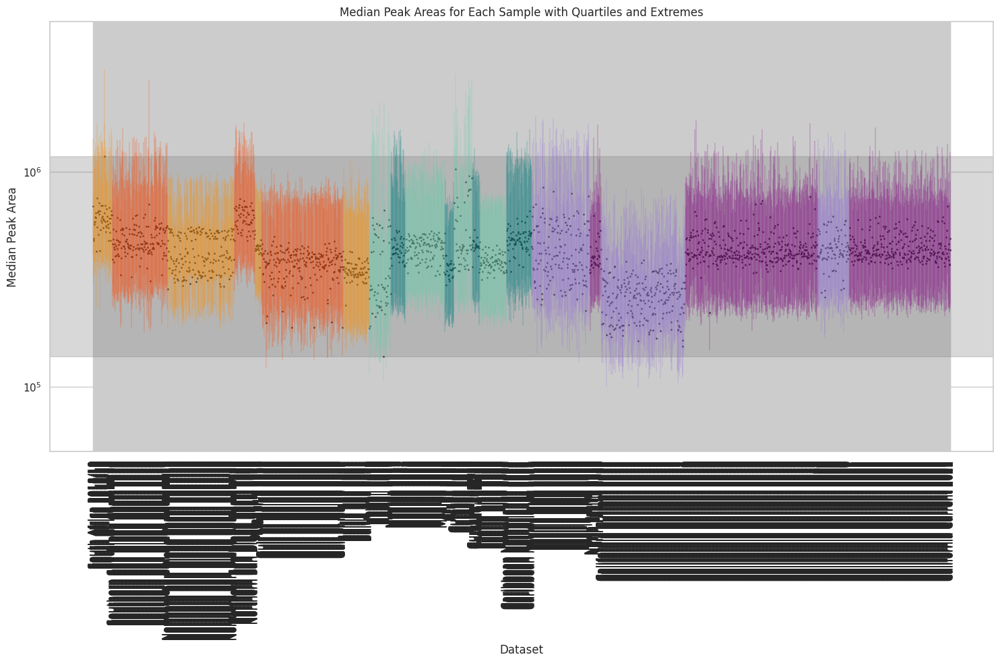

Plot saved as median_peak_areas.svg


In [80]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data from the CSV and TXT files
data = pd.read_csv('Transposed_Cleaned05_go.csv')
metadata = pd.read_csv('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Filter columns that contain '.mz' in their headers (sample columns)
sample_columns = [col for col in data.columns if '.mz' in col]

# Create a dictionary to map sample names to their datasets
sample_to_dataset = dict(zip(metadata['filename'], metadata['ATTRIBUTE_descriptor']))

# Calculate the median, lower quartile, upper quartile, minimum, and maximum for each sample, excluding zero counts
median_data = data[sample_columns].replace(0, pd.NA).median()
lower_quartile_data = data[sample_columns].replace(0, pd.NA).quantile(0.25)
upper_quartile_data = data[sample_columns].replace(0, pd.NA).quantile(0.75)
min_data = data[sample_columns].replace(0, pd.NA).min()
max_data = data[sample_columns].replace(0, pd.NA).max()

# Calculate the minimum and maximum median values
min_median = median_data.min()
max_median = median_data.max()

# Print the minimum and maximum median values
print(f"Minimum Median: {min_median}")
print(f"Maximum Median: {max_median}")

# Create a DataFrame for plotting
plot_data = pd.DataFrame({
    'Sample': median_data.index,
    'Median Peak Area': median_data.values,
    'Lower Quartile': lower_quartile_data.values,
    'Upper Quartile': upper_quartile_data.values,
    'Min': min_data.values,
    'Max': max_data.values,
    'Dataset': [sample_to_dataset.get(sample, 'Unknown') for sample in median_data.index]
})

# Define colors for each dataset
dataset_colors = {
    'Aruba 2019': '#008080',
    'Baltic Sea 2021': '#FF8C00',
    'California Current 2017': '#9370DB',
    'California Current 2019': '#800080',
    'California Current 2020': '#9370DB',
    'California Current 2021': '#800080',
    'Caribbean Netherlands 2022': '#008080',
    'Curacao 2018': '#66CDAA',
    'Curacao 2021/22': '#008080',
    'Gulf of Maine 2022': '#FF4500',
    'Hawaii 2019': '#66CDAA',
    'Moorea 2017': '#008080',
    'Moorea 2022': '#66CDAA',
    'North Pacific 2018': '#800080',
    'Northern San Diego Coast 2017/18': '#FF8C00',
    'Northern San Diego Coast 2020': '#FF4500',
    'Pacific OMZ 2018': '#9370DB',
    'Patagonia 2018': '#FF8C00',
    'Puerto Rico 2022': '#66CDAA',
    'South Africa 2018/19': '#FF8C00',
    'Southern San Diego Coast 2019': '#FF4500'
}

# Define the desired order of datasets
dataset_order = ['South Africa 2018/19', 
                 'Southern San Diego Coast 2019', 
                 'Northern San Diego Coast 2017/18', 
                 'Northern San Diego Coast 2020', 
                 'Patagonia 2018', 
                 'Gulf of Maine 2022', 
                 'Baltic Sea 2021', 
                 'Hawaii 2019', 
                 'Moorea 2017', 
                 'Moorea 2022', 
                 'Aruba 2019', 
                 'Curacao 2018', 
                 'Curacao 2021/22', 
                 'Puerto Rico 2022', 
                 'Caribbean Netherlands 2022', 
                 'Pacific OMZ 2018', 
                 'North Pacific 2018', 
                 'California Current 2017', 
                 'California Current 2019', 
                 'California Current 2020', 
                 'California Current 2021']

# Reorder plot_data according to the desired dataset order
plot_data['Dataset'] = pd.Categorical(plot_data['Dataset'], categories=dataset_order, ordered=True)
plot_data.sort_values('Dataset', inplace=True)

# Create a scatter plot with error bars for lower and upper quartiles
plt.figure(figsize=(15, 10))

sns.scatterplot(x='Sample', y='Median Peak Area', data=plot_data, s=3, marker='o', color='black', edgecolor='black')

# Plot lines for lower quartile to upper quartile
for i in range(len(plot_data)):
    # Plot lower quartile to upper quartile line
    plt.plot([plot_data['Sample'][i], plot_data['Sample'][i]], 
             [plot_data['Lower Quartile'][i], plot_data['Upper Quartile'][i]], 
             color=dataset_colors[plot_data['Dataset'][i]], linewidth=0.25)

# Add a grey box to indicate the span of medians across all samples
plt.axhspan(min_median, max_median, color='grey', alpha=0.3)

# Rotate x-axis labels for better readability
plt.xticks(range(len(plot_data)), plot_data['Dataset'], rotation=90)

# Set y-axis to log scale
plt.yscale('log')

# Manually define the range of the y-axis
plt.ylim(50000, 5000000)  # Replace 1 and 1000000 with your desired limits

# Set plot title and labels
plt.title('Median Peak Areas for Each Sample with Quartiles and Extremes')
plt.xlabel('Dataset')
plt.ylabel('Median Peak Area')

# Save the plot as .svg file before showing it
plt.tight_layout()
plt.savefig('median_peak_areas_IQR.svg')

# Show plot
plt.show()

print("Plot saved as median_peak_areas.svg")

# 14.Violins scaled with blanks (Supp.Fig.6)

/tmp/ipykernel_20140/1018045398.py:80: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/1018045398.py:80: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



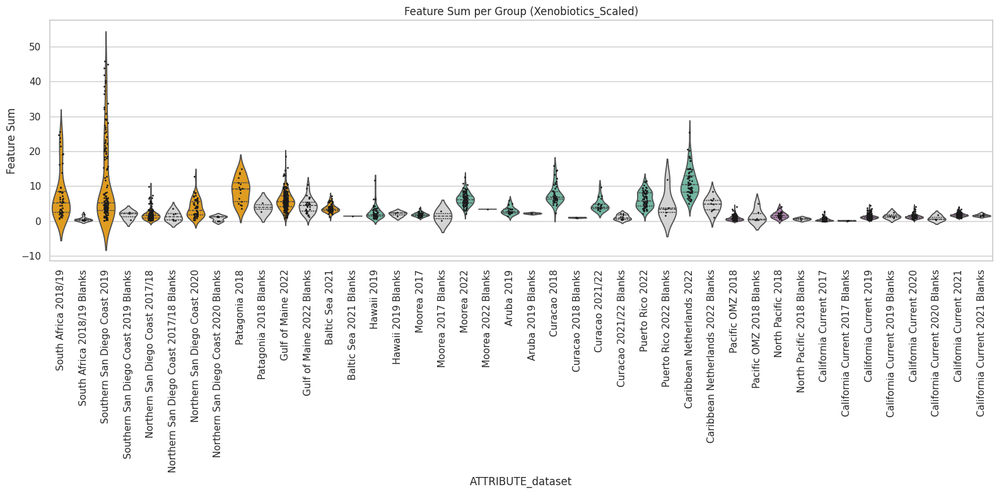

In [81]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('xenobiotics_withblanks_scaled.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows
df['feature sum'] = df.sum(axis=1)

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Merge with metadata according to dataset
df_merged = df.merge(metadata[['filename', 'ATTRIBUTE_descriptor', 'ATTRIBUTE_dataset']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_dataset
dataset_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_merged['ATTRIBUTE_dataset'] = pd.Categorical(df_merged['ATTRIBUTE_dataset'], categories=dataset_order, ordered=True)
df_merged = df_merged.sort_values('ATTRIBUTE_dataset')

# Separate blanks and non-blanks
blanks = df_merged[df_merged['ATTRIBUTE_descriptor'] == 'Blanks']
non_blanks = df_merged[df_merged['ATTRIBUTE_descriptor'] != 'Blanks']

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonia 2018': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2021': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd'
}

# Add blank colors to the palette
for dataset in dataset_order:
    custom_palette[dataset + " Blanks"] = "lightgrey"

# Create a new column to distinguish between samples and blanks
df_merged['plot_category'] = df_merged.apply(lambda row: row['ATTRIBUTE_dataset'] + (' Blanks' if row['ATTRIBUTE_descriptor'] == 'Blanks' else ''), axis=1)

# Define the new order including blanks
plot_order = []
for dataset in dataset_order:
    plot_order.append(dataset)
    plot_order.append(dataset + " Blanks")

# Sort the DataFrame based on the new order
df_merged['plot_category'] = pd.Categorical(df_merged['plot_category'], categories=plot_order, ordered=True)
df_merged = df_merged.sort_values('plot_category')

# Plot violin plot
plt.figure(figsize=(16, 8))
sns.set_theme(style="whitegrid")

ax = sns.violinplot(
    data=df_merged,
    x='plot_category',
    y='feature sum',
    inner='quartile',  
    palette=custom_palette,
    scale='width'  
)
sns.stripplot(
    data=df_merged,
    x='plot_category',
    y='feature sum',
    color='k',
    size=2,  
    jitter=True,  
    ax=ax
)

plt.title('Feature Sum per Group (Xenobiotics_Scaled)')
plt.xlabel('ATTRIBUTE_dataset')
plt.ylabel('Feature Sum')
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('Xenobiotics_Scaled_violinplot_blankresolved.svg')
plt.show()

/tmp/ipykernel_20140/4017828940.py:82: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/4017828940.py:82: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



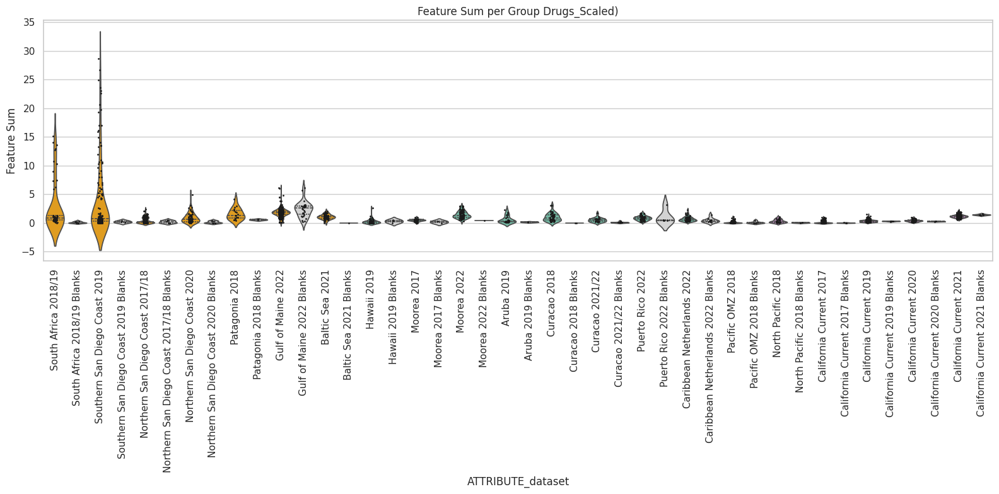

In [82]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('xenobiotics_withblanks_scaled.csv', index_col='row ID')

df = df[df['Type'] == 'drug']

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows
df['feature sum'] = df.sum(axis=1)

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Merge with metadata according to dataset
df_merged = df.merge(metadata[['filename', 'ATTRIBUTE_descriptor', 'ATTRIBUTE_dataset']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_dataset
dataset_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_merged['ATTRIBUTE_dataset'] = pd.Categorical(df_merged['ATTRIBUTE_dataset'], categories=dataset_order, ordered=True)
df_merged = df_merged.sort_values('ATTRIBUTE_dataset')

# Separate blanks and non-blanks
blanks = df_merged[df_merged['ATTRIBUTE_descriptor'] == 'Blanks']
non_blanks = df_merged[df_merged['ATTRIBUTE_descriptor'] != 'Blanks']

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonia 2018': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2021': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd'
}

# Add blank colors to the palette
for dataset in dataset_order:
    custom_palette[dataset + " Blanks"] = "lightgrey"

# Create a new column to distinguish between samples and blanks
df_merged['plot_category'] = df_merged.apply(lambda row: row['ATTRIBUTE_dataset'] + (' Blanks' if row['ATTRIBUTE_descriptor'] == 'Blanks' else ''), axis=1)

# Define the new order including blanks
plot_order = []
for dataset in dataset_order:
    plot_order.append(dataset)
    plot_order.append(dataset + " Blanks")

# Sort the DataFrame based on the new order
df_merged['plot_category'] = pd.Categorical(df_merged['plot_category'], categories=plot_order, ordered=True)
df_merged = df_merged.sort_values('plot_category')

# Plot violin plot
plt.figure(figsize=(16, 8))
sns.set_theme(style="whitegrid")

ax = sns.violinplot(
    data=df_merged,
    x='plot_category',
    y='feature sum',
    inner='quartile',  
    palette=custom_palette,
    scale='width'  
)
sns.stripplot(
    data=df_merged,
    x='plot_category',
    y='feature sum',
    color='k',
    size=2,  
    jitter=True,  
    ax=ax
)

plt.title('Feature Sum per Group Drugs_Scaled)')
plt.xlabel('ATTRIBUTE_dataset')
plt.ylabel('Feature Sum')
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('Drugs_Scaled_violinplot_blankresolved.svg')
plt.show()

/tmp/ipykernel_20140/4161887447.py:82: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/4161887447.py:82: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



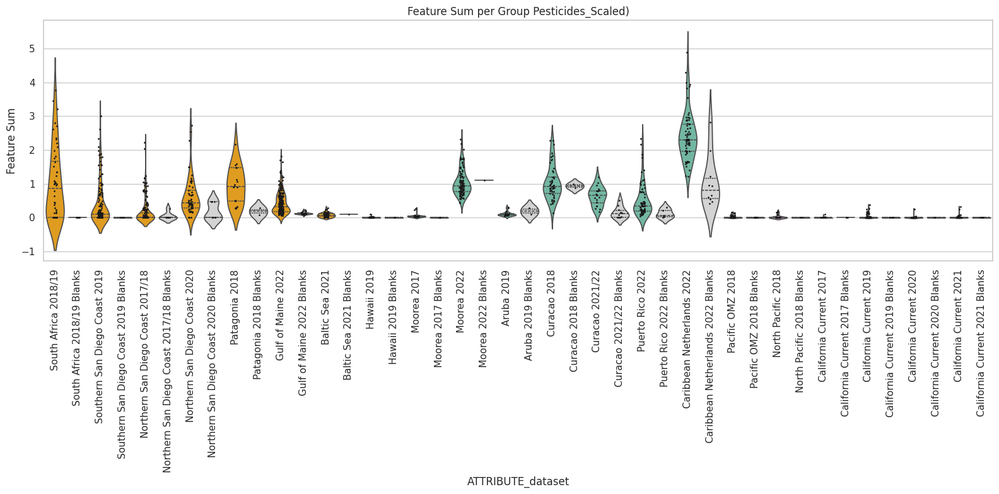

In [83]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('xenobiotics_withblanks_scaled.csv', index_col='row ID')

df = df[df['Type'] == 'pesticide']

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows
df['feature sum'] = df.sum(axis=1)

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Merge with metadata according to dataset
df_merged = df.merge(metadata[['filename', 'ATTRIBUTE_descriptor', 'ATTRIBUTE_dataset']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_dataset
dataset_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_merged['ATTRIBUTE_dataset'] = pd.Categorical(df_merged['ATTRIBUTE_dataset'], categories=dataset_order, ordered=True)
df_merged = df_merged.sort_values('ATTRIBUTE_dataset')

# Separate blanks and non-blanks
blanks = df_merged[df_merged['ATTRIBUTE_descriptor'] == 'Blanks']
non_blanks = df_merged[df_merged['ATTRIBUTE_descriptor'] != 'Blanks']

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonia 2018': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2021': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd'
}

# Add blank colors to the palette
for dataset in dataset_order:
    custom_palette[dataset + " Blanks"] = "lightgrey"

# Create a new column to distinguish between samples and blanks
df_merged['plot_category'] = df_merged.apply(lambda row: row['ATTRIBUTE_dataset'] + (' Blanks' if row['ATTRIBUTE_descriptor'] == 'Blanks' else ''), axis=1)

# Define the new order including blanks
plot_order = []
for dataset in dataset_order:
    plot_order.append(dataset)
    plot_order.append(dataset + " Blanks")

# Sort the DataFrame based on the new order
df_merged['plot_category'] = pd.Categorical(df_merged['plot_category'], categories=plot_order, ordered=True)
df_merged = df_merged.sort_values('plot_category')

# Plot violin plot
plt.figure(figsize=(16, 8))
sns.set_theme(style="whitegrid")

ax = sns.violinplot(
    data=df_merged,
    x='plot_category',
    y='feature sum',
    inner='quartile',  
    palette=custom_palette,
    scale='width'  
)
sns.stripplot(
    data=df_merged,
    x='plot_category',
    y='feature sum',
    color='k',
    size=2,  
    jitter=True,  
    ax=ax
)

plt.title('Feature Sum per Group Pesticides_Scaled)')
plt.xlabel('ATTRIBUTE_dataset')
plt.ylabel('Feature Sum')
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('Pesticides_Scaled_violinplot_blankresolved.svg')
plt.show()

/tmp/ipykernel_20140/1240740821.py:82: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_20140/1240740821.py:82: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



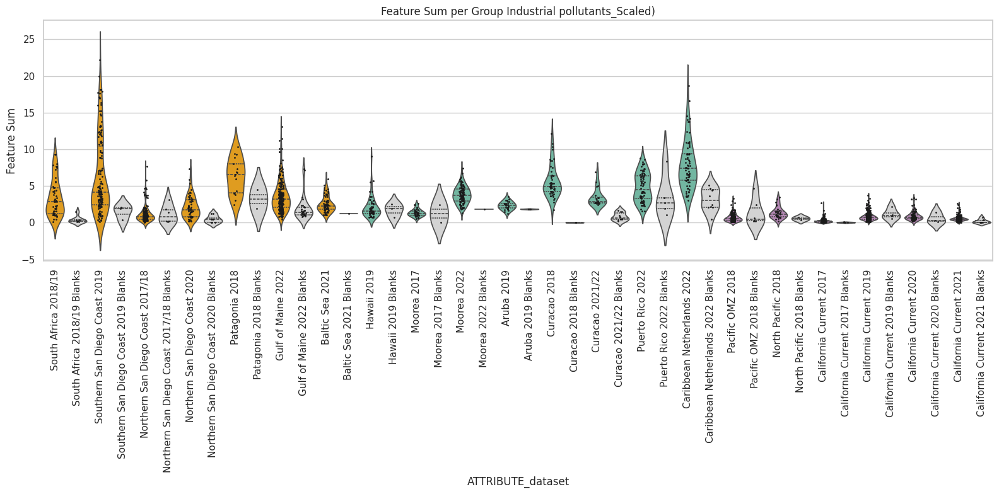

In [84]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('xenobiotics_withblanks_scaled.csv', index_col='row ID')

df = df[df['Type'] == 'urban']

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows
df['feature sum'] = df.sum(axis=1)

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Merge with metadata according to dataset
df_merged = df.merge(metadata[['filename', 'ATTRIBUTE_descriptor', 'ATTRIBUTE_dataset']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_dataset
dataset_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonia 2018', 'Gulf of Maine 2022', 'Baltic Sea 2021', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_merged['ATTRIBUTE_dataset'] = pd.Categorical(df_merged['ATTRIBUTE_dataset'], categories=dataset_order, ordered=True)
df_merged = df_merged.sort_values('ATTRIBUTE_dataset')

# Separate blanks and non-blanks
blanks = df_merged[df_merged['ATTRIBUTE_descriptor'] == 'Blanks']
non_blanks = df_merged[df_merged['ATTRIBUTE_descriptor'] != 'Blanks']

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonia 2018': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2021': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd'
}

# Add blank colors to the palette
for dataset in dataset_order:
    custom_palette[dataset + " Blanks"] = "lightgrey"

# Create a new column to distinguish between samples and blanks
df_merged['plot_category'] = df_merged.apply(lambda row: row['ATTRIBUTE_dataset'] + (' Blanks' if row['ATTRIBUTE_descriptor'] == 'Blanks' else ''), axis=1)

# Define the new order including blanks
plot_order = []
for dataset in dataset_order:
    plot_order.append(dataset)
    plot_order.append(dataset + " Blanks")

# Sort the DataFrame based on the new order
df_merged['plot_category'] = pd.Categorical(df_merged['plot_category'], categories=plot_order, ordered=True)
df_merged = df_merged.sort_values('plot_category')

# Plot violin plot
plt.figure(figsize=(16, 8))
sns.set_theme(style="whitegrid")

ax = sns.violinplot(
    data=df_merged,
    x='plot_category',
    y='feature sum',
    inner='quartile',  
    palette=custom_palette,
    scale='width'  
)
sns.stripplot(
    data=df_merged,
    x='plot_category',
    y='feature sum',
    color='k',
    size=2,  
    jitter=True,  
    ax=ax
)

plt.title('Feature Sum per Group Industrial pollutants_Scaled)')
plt.xlabel('ATTRIBUTE_dataset')
plt.ylabel('Feature Sum')
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('Industrial pollutants_Scaled_violinplot_blankresolved.svg')
plt.show()